## Problem Statement
- Development of a technique to predict missing environmental data for application in climate prediction (JABATAN METEOROLOGI MALAYSIA,  AMPANGAN MUDA Station)

### Outline
**The overall aim of the research is the development of a technique to predict missing environmental data for climate prediction. This can be used to improve the understanding of past, present, and future climate conditions and their potential impacts on the environment and society. By developing a more accurate and reliable technique for predicting missing environmental data, researchers can improve the accuracy and reliability of climate prediction models, which are critical tools for informing environmental management, policy, and decision-making.**

**The ultimate goal of this research is to support efforts to mitigate and adapt to the impacts of climate change, such as climate change, sea level rise, and ecosystem disruption. By improving our ability to predict and understand these impacts, we can better prepare for them and develop effective strategies for managing and reducing their effects on the environment and society.**



In [1]:
# import the necessary libraries
import numpy as np
import pandas as pd

# visuals libraries
import math
import glob


import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

import seaborn as sns

pd.options.mode.chained_assignment = None
import datetime as dt

The following major python libraries like numpy and pandas for mathematical and stastistical computation, while seaborn and matplotlib was imported for visualizations and analysis. Other python libraries used are from scikit learn documentation for machine learning models and predictions.

In [3]:
# import and read file
df = pd.read_excel(r'C:\Users\user\Tinuke Project 2023\AmpaganMudaWSDel .xlsx')
df.head()

,Year,Month,Day,MST,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012,1,1,1,1014.9,24.4,23.0,92,NaN,NaN,0,0.0
1,2012,1,1,2,1014.5,24.3,23.0,93,NaN,NaN,0,0.0
2,2012,1,1,3,1013.7,23.8,23.2,96,NaN,NaN,57,1.8
3,2012,1,1,4,1012.9,23.6,23.1,97,NaN,NaN,60,4.3
4,2012,1,1,5,1013.3,23.5,23.1,98,NaN,NaN,60,9.8


In [4]:
# tail of the data
df.tail()

,Year,Month,Day,MST,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
24574,2014,12,31,20,-1.1,-1.1,-1.1,-1,-1.0,-1.1,-1,-1.1
24575,2014,12,31,21,-1.1,-1.1,-1.1,-1,-1.0,-1.1,-1,-1.1
24576,2014,12,31,22,-1.1,-1.1,-1.1,-1,-1.0,-1.1,-1,-1.1
24577,2014,12,31,23,-1.1,-1.1,-1.1,-1,-1.0,-1.1,-1,-1.1
24578,2014,12,31,24,-1.1,-1.1,-1.1,-1,-1.0,-1.1,-1,-1.1


In [5]:
# rename the MST column label to Hour
df = df.rename(columns={'MST ': 'Hour'})
df.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012,1,1,1,1014.9,24.4,23.0,92,NaN,NaN,0,0.0
1,2012,1,1,2,1014.5,24.3,23.0,93,NaN,NaN,0,0.0
2,2012,1,1,3,1013.7,23.8,23.2,96,NaN,NaN,57,1.8
3,2012,1,1,4,1012.9,23.6,23.1,97,NaN,NaN,60,4.3
4,2012,1,1,5,1013.3,23.5,23.1,98,NaN,NaN,60,9.8


## Features of the Dataset
Year

Month 

Day

Mean Surface Time ( MST )- Hour

Atmospheric Pressure ( Hpa )

Temperature ( ° C )

Dew point ( ° C )

Relative Humidity ( % )

Wind Direction ( ° )

Wind speed ( m/s )

Rainfall Duration( min )

Rainfall Amount ( mm )

## Data Inspection and Manipulation


In [6]:
# shape of the data
df.shape

(24579, 12)

In [7]:
# data columns
df.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Hpa', 'Temp', 'Dew_point',
       'rel_humidity', 'wind_dir', 'wind_speed', 'rain_dur', 'rain_amt'],
      dtype='object')

In [8]:
# info of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24579 entries, 0 to 24578
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Year          24579 non-null  int64  
 1   Month         24579 non-null  int64  
 2   Day           24579 non-null  int64  
 3   Hour          24579 non-null  int64  
 4   Hpa           24579 non-null  float64
 5   Temp          24579 non-null  float64
 6   Dew_point     24579 non-null  float64
 7   rel_humidity  24579 non-null  int64  
 8   wind_dir      16503 non-null  float64
 9   wind_speed    16503 non-null  float64
 10  rain_dur      24579 non-null  int64  
 11  rain_amt      24579 non-null  float64
dtypes: float64(6), int64(6)
memory usage: 2.3 MB


In [9]:
# check for missing values
df.isnull().sum()

Year               0
Month              0
Day                0
Hour               0
Hpa                0
Temp               0
Dew_point          0
rel_humidity       0
wind_dir        8076
wind_speed      8076
rain_dur           0
rain_amt           0
dtype: int64

In [10]:
# percentage of missing values
null_pct = df.apply(pd.isnull).sum()/df.shape[0] 
null_pct

Year            0.000000
Month           0.000000
Day             0.000000
Hour            0.000000
Hpa             0.000000
Temp            0.000000
Dew_point       0.000000
rel_humidity    0.000000
wind_dir        0.328573
wind_speed      0.328573
rain_dur        0.000000
rain_amt        0.000000
dtype: float64

<AxesSubplot:title={'center':'Visualizing missing values in the data set'}>

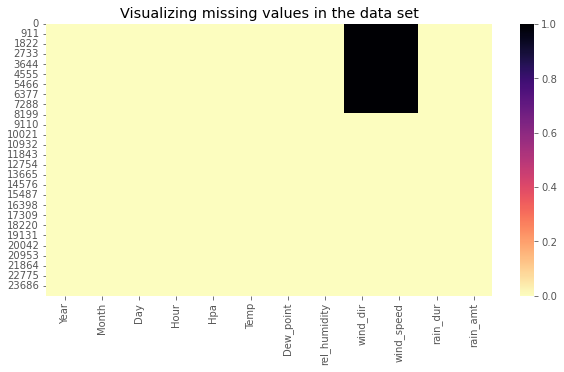

In [11]:
# Visualizing missing values
plt.figure(figsize = (10, 5))
plt.title('Visualizing missing values in the data set')
sns.heatmap(df.isnull(),  cbar = True, cmap = 'magma_r')

In [12]:
# descriptive statistics for all the features
df.describe()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
count,24579.000000,24579.000000,24579.00000,24579.000000,24579.000000,24579.000000,24579.000000,24579.000000,16503.000000,16503.000000,24579.000000,24579.000000
mean,2012.986615,6.387933,15.78266,12.492494,887.217922,23.094719,19.896538,72.112820,122.788039,0.501515,1.841206,0.131763
std,0.802252,3.497451,8.88359,6.921909,334.178733,9.670987,8.040835,31.406057,119.758202,0.883804,8.575241,1.970461
min,2012.000000,1.000000,1.00000,1.000000,-1.100000,-1.100000,-1.100000,-1.000000,-1.000000,-1.100000,-1.000000,-1.100000
25%,2012.000000,3.000000,8.00000,6.000000,1010.600000,23.300000,21.500000,61.000000,10.000000,0.300000,0.000000,0.000000
50%,2013.000000,6.000000,16.00000,12.000000,1012.600000,24.800000,22.900000,85.000000,70.000000,0.500000,0.000000,0.000000
75%,2014.000000,9.000000,23.00000,18.000000,1014.200000,28.600000,23.800000,96.000000,240.000000,1.000000,0.000000,0.000000
max,2014.000000,12.000000,31.00000,24.000000,1020.000000,37.000000,27.600000,100.000000,360.000000,13.200000,60.000000,55.100000


## How to visualize pattern of missing values?
You can visualize missing values in the data using missingno package. It gives a very clear picture.

Visualize the presence of missing data. The matrix method will make a black bar for each column with the missing data points marked at various locations.

In [13]:
 # to visualize missing value
import missingno as msno

<AxesSubplot:>

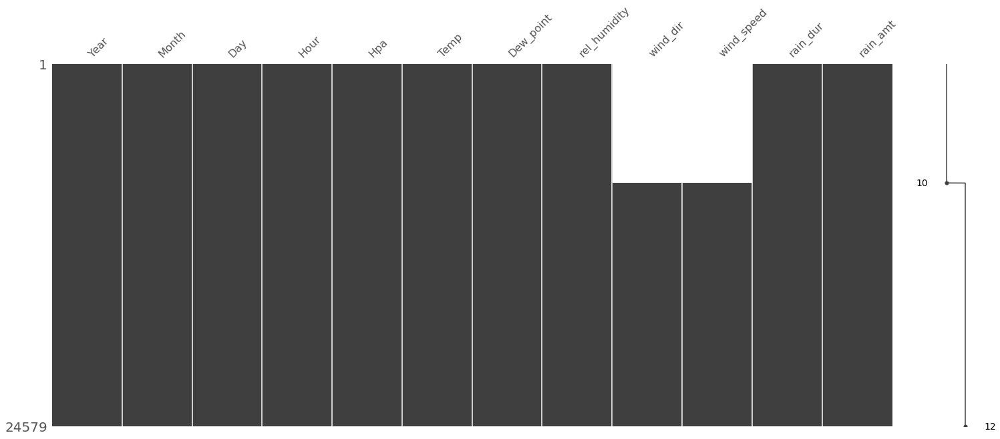

In [14]:
# visualize missing data
msno.matrix(df)

## Do the missingness of values in one column affect the missing data behaviour in another?
Check the Correlation of missing values amongst columns

A high correlation would mean the missingness of values in one column is related to the missingness of values in another column. This can sometimes help gain more insights as to why two are more columns may be missing together and formulate a suitable tactic to handle it.

<AxesSubplot:>

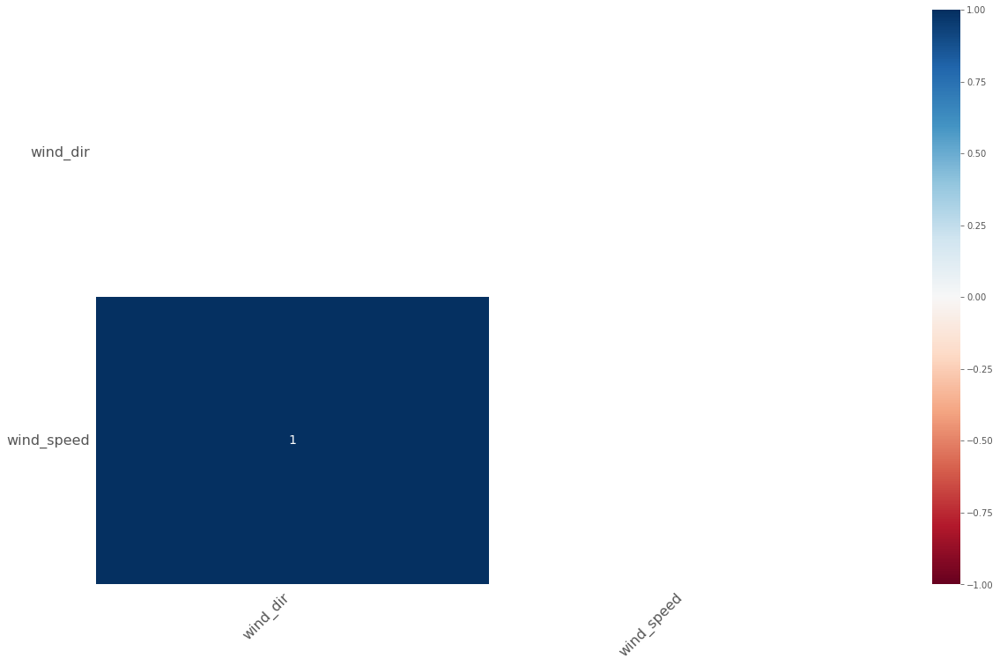

In [15]:
msno.heatmap(df)

In [16]:
# Exhaustive Summary of dataframe 
from datatile.summary.df import DataFrameSummary
dfs = DataFrameSummary(df)
dfs.columns_stats

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
counts,24579,24579,24579,24579,24579,24579,24579,24579,16503,16503,24579,24579
uniques,3,12,31,24,143,200,142,77,38,38,62,207
missing,0,0,0,0,0,0,0,0,8076,8076,0,0
missing_perc,0%,0%,0%,0%,0%,0%,0%,0%,32.86%,32.86%,0%,0%
types,numeric,numeric,numeric,numeric,numeric,numeric,numeric,numeric,numeric,numeric,numeric,numeric


## Steps to filling Missing values
We can see that there are columns that have a minimum value of zero (0). On some columns, a value of zero does not make sense and indicates an invalid or missing value.

Missing values are frequently indicated by out-of-range entries; perhaps a negative number (e.g., -1) in a numeric field that is normally only positive, or a 0 in a numeric field that can never normally be 0.

Specifically, the following columns have an invalid zero minimum and negative value:

1: Hpa

2: Dew Point

3: Relative Humidity

4: Wind Direction

5: Wind Speed

6: Rain Duration

7: Temperature

8: Rain Amount

In [17]:
# Replace all occurrences of negative values with NaN
df.replace(to_replace= [-1, -1.1], value = np.nan, inplace=True)
df.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012,1,1,1,1014.9,24.4,23.0,92.0,NaN,NaN,0.0,0.0
1,2012,1,1,2,1014.5,24.3,23.0,93.0,NaN,NaN,0.0,0.0
2,2012,1,1,3,1013.7,23.8,23.2,96.0,NaN,NaN,57.0,1.8
3,2012,1,1,4,1012.9,23.6,23.1,97.0,NaN,NaN,60.0,4.3
4,2012,1,1,5,1013.3,23.5,23.1,98.0,NaN,NaN,60.0,9.8


In [18]:
df.tail()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
24574,2014,12,31,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24575,2014,12,31,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24576,2014,12,31,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24577,2014,12,31,23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24578,2014,12,31,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
df.isna().sum()

Year                0
Month               0
Day                 0
Hour                0
Hpa              3047
Temp             3047
Dew_point        3047
rel_humidity     3047
wind_dir        10725
wind_speed      10725
rain_dur         2707
rain_amt         2707
dtype: int64

In [20]:
# checking if there are -ve values
df[df < 0].count()

Year            0
Month           0
Day             0
Hour            0
Hpa             0
Temp            0
Dew_point       0
rel_humidity    0
wind_dir        0
wind_speed      0
rain_dur        0
rain_amt        0
dtype: int64

In [21]:
# check the features with 0 value
df[df == 0]

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
24574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df[df == 0].count()

Year                0
Month               0
Day                 0
Hour                0
Hpa                 0
Temp                0
Dew_point           0
rel_humidity        0
wind_dir         1362
wind_speed       1362
rain_dur        20154
rain_amt        20154
dtype: int64

In [23]:
# replacing the features with 0 as NaN
df.replace(0, np.nan, inplace = True)
df.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012,1,1,1,1014.9,24.4,23.0,92.0,NaN,NaN,NaN,NaN
1,2012,1,1,2,1014.5,24.3,23.0,93.0,NaN,NaN,NaN,NaN
2,2012,1,1,3,1013.7,23.8,23.2,96.0,NaN,NaN,57.0,1.8
3,2012,1,1,4,1012.9,23.6,23.1,97.0,NaN,NaN,60.0,4.3
4,2012,1,1,5,1013.3,23.5,23.1,98.0,NaN,NaN,60.0,9.8


In [24]:
df.tail()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
24574,2014,12,31,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24575,2014,12,31,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24576,2014,12,31,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24577,2014,12,31,23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24578,2014,12,31,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
# checking the missing values
df.isna().sum()

Year                0
Month               0
Day                 0
Hour                0
Hpa              3047
Temp             3047
Dew_point        3047
rel_humidity     3047
wind_dir        12087
wind_speed      12087
rain_dur        22861
rain_amt        22861
dtype: int64

<AxesSubplot:>

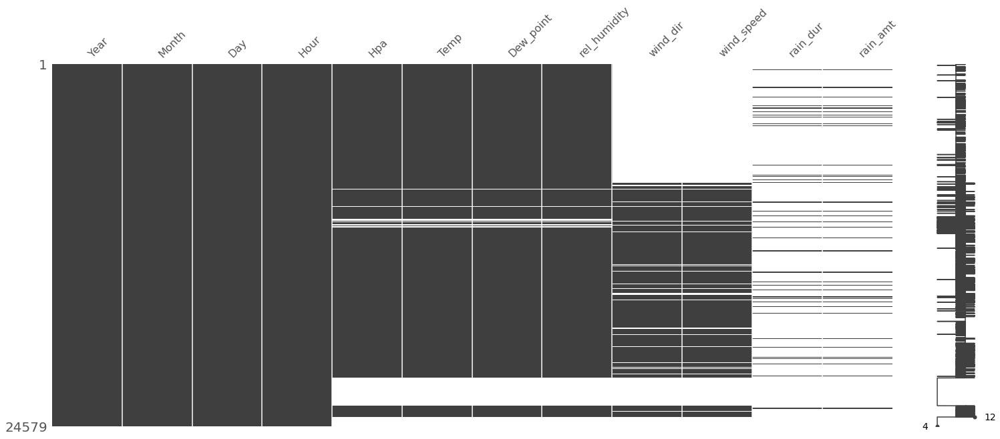

In [26]:
# visualize missing data
msno.matrix(df)

<AxesSubplot:>

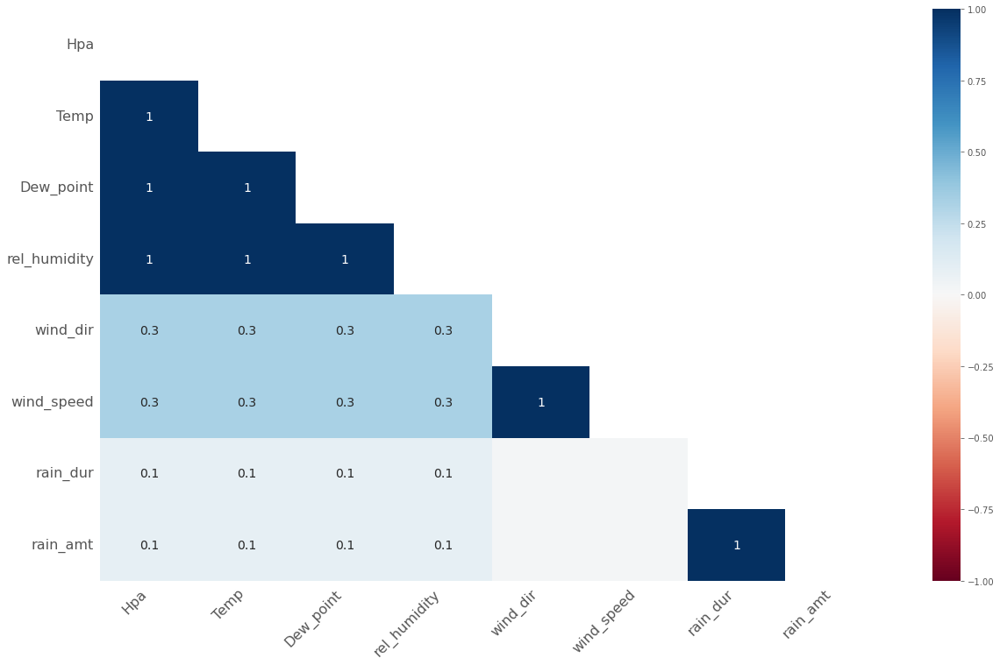

In [27]:
# heatmap of the missing data
msno.heatmap(df)

<AxesSubplot:title={'center':'Visualizing missing values in the data set'}>

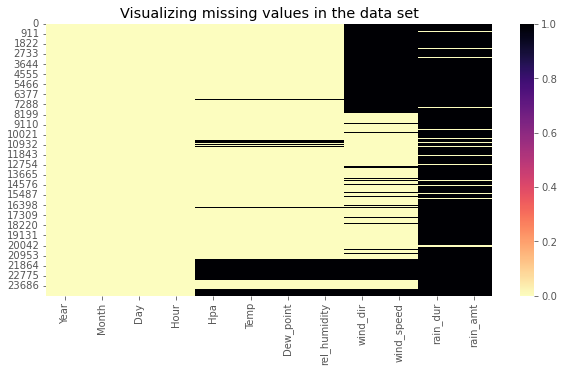

In [28]:
# Visualizing missing values
plt.figure(figsize = (10, 5))
plt.title('Visualizing missing values in the data set')
sns.heatmap(df.isnull(),  cbar = True, cmap = 'magma_r')

In [29]:
# percentage of missing values
null_pct1 = df.apply(pd.isnull).sum()/df.shape[0] 
null_pct1

Year            0.000000
Month           0.000000
Day             0.000000
Hour            0.000000
Hpa             0.123968
Temp            0.123968
Dew_point       0.123968
rel_humidity    0.123968
wind_dir        0.491761
wind_speed      0.491761
rain_dur        0.930103
rain_amt        0.930103
dtype: float64

### Checking the pattern of missingness for the month of May in 2012, 2013 and 2014

In [30]:
import pandas as pd
import missingno as msno
# sort the dataframe by a particular month
month_to_sort = 5
sorted_df = df.sort_values(by = ['Year', 'Month'], ascending=True)
sorted_df = sorted_df[sorted_df['Month'] == 5]
print(sorted_df)

       Year  Month  Day  Hour     Hpa  Temp  Dew_point  rel_humidity  \
2903   2012      5    1     1  1012.7  23.7       23.3          97.0   
2904   2012      5    1     2  1012.4  23.9       23.5          98.0   
2905   2012      5    1     3  1012.1  23.8       23.4          97.0   
2906   2012      5    1     4  1011.8  23.8       23.4          97.0   
2907   2012      5    1     5  1011.4  23.9       23.5          98.0   
...     ...    ...  ...   ...     ...   ...        ...           ...   
20451  2014      5   31    20  1010.2  25.7       24.6          94.0   
20452  2014      5   31    21  1011.4  24.9       24.3          96.0   
20453  2014      5   31    22  1012.2  24.9       24.4          97.0   
20454  2014      5   31    23  1012.5  24.9       24.5          98.0   
20455  2014      5   31    24  1012.5  24.8       24.4          98.0   

       wind_dir  wind_speed  rain_dur  rain_amt  
2903        NaN         NaN       NaN       NaN  
2904        NaN         NaN       N

In [31]:
# view the resulting dataframe
sorted_df = pd.DataFrame(sorted_df)
sorted_df

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
2903,2012,5,1,1,1012.7,23.7,23.3,97.0,NaN,NaN,NaN,NaN
2904,2012,5,1,2,1012.4,23.9,23.5,98.0,NaN,NaN,NaN,NaN
2905,2012,5,1,3,1012.1,23.8,23.4,97.0,NaN,NaN,NaN,NaN
2906,2012,5,1,4,1011.8,23.8,23.4,97.0,NaN,NaN,NaN,NaN
2907,2012,5,1,5,1011.4,23.9,23.5,98.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
20451,2014,5,31,20,1010.2,25.7,24.6,94.0,180.0,2.7,22.0,5.6
20452,2014,5,31,21,1011.4,24.9,24.3,96.0,70.0,0.6,60.0,24.9
20453,2014,5,31,22,1012.2,24.9,24.4,97.0,180.0,0.7,37.0,0.9
20454,2014,5,31,23,1012.5,24.9,24.5,98.0,90.0,1.0,NaN,NaN


### Missingness of Data for a particular Day 15 in May in 2012 and its visualization

<AxesSubplot:>

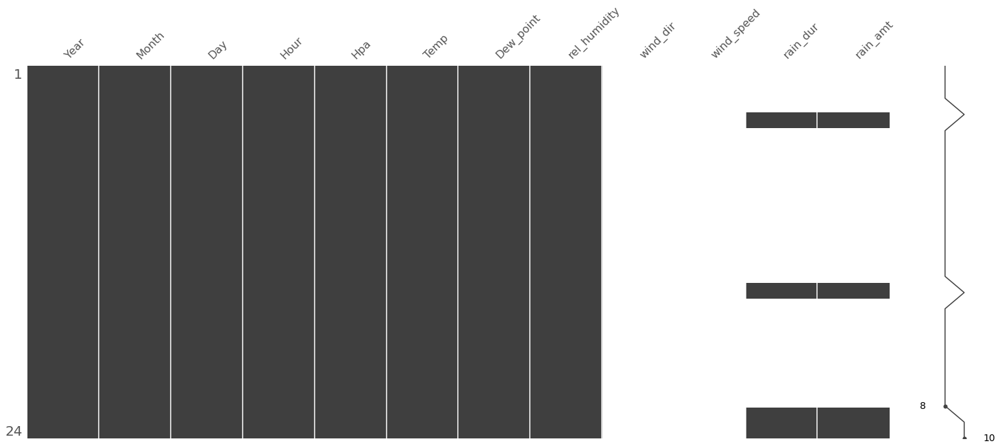

In [32]:
import missingno as msno

# filter the data for a particular day 15 and month of May in the year
year = 2012
month = 5
day = 15
filtered_df1 = sorted_df[(sorted_df['Year'] == year) & (sorted_df['Month'] == month) & (sorted_df['Day'] == day)]

# visualize the missingness of the filtered data
msno.matrix(filtered_df1)


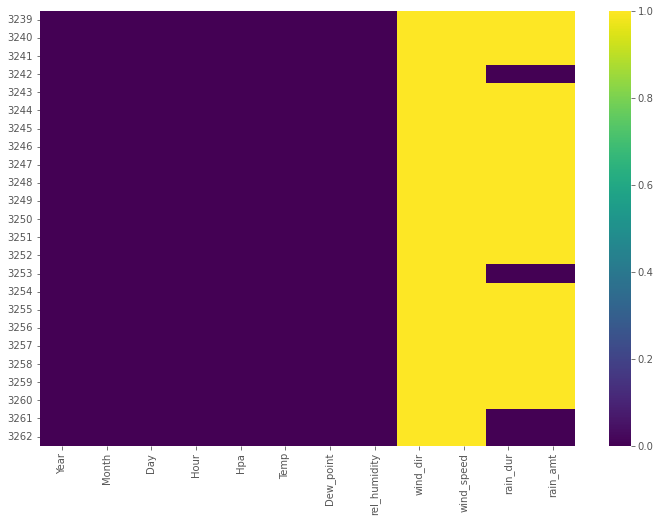

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create heatmap of missingness
sns.heatmap(filtered_df1.isnull(), cmap='viridis')

# Show plot
plt.show()


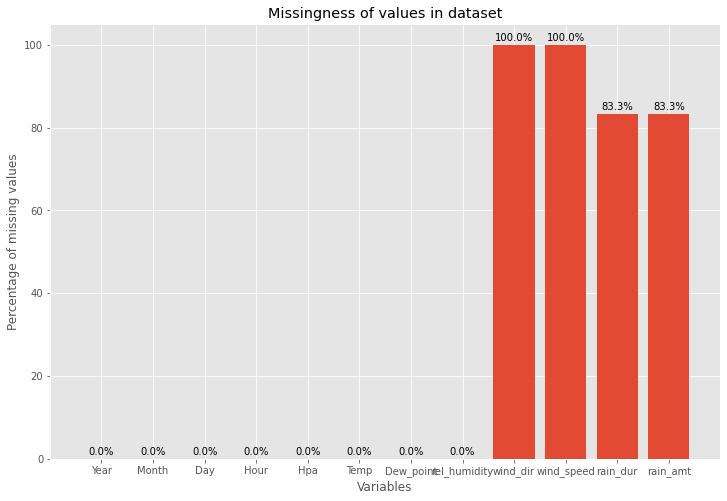

In [34]:
import matplotlib.pyplot as plt

# Calculate percentage of missing values for each variable
missing_percent = filtered_df1.isnull().sum() / len(filtered_df1) * 100

# Create bar chart of missingness
plt.bar(missing_percent.index, missing_percent.values)

# Add data labels to bars
for i, v in enumerate(missing_percent.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Set axis labels and title
plt.xlabel('Variables')
plt.ylabel('Percentage of missing values')
plt.title('Missingness of values in dataset')

# Show plot
plt.show()


### Missingness of Data for a particular Day 15 in May in 2013 and its visualization

<AxesSubplot:>

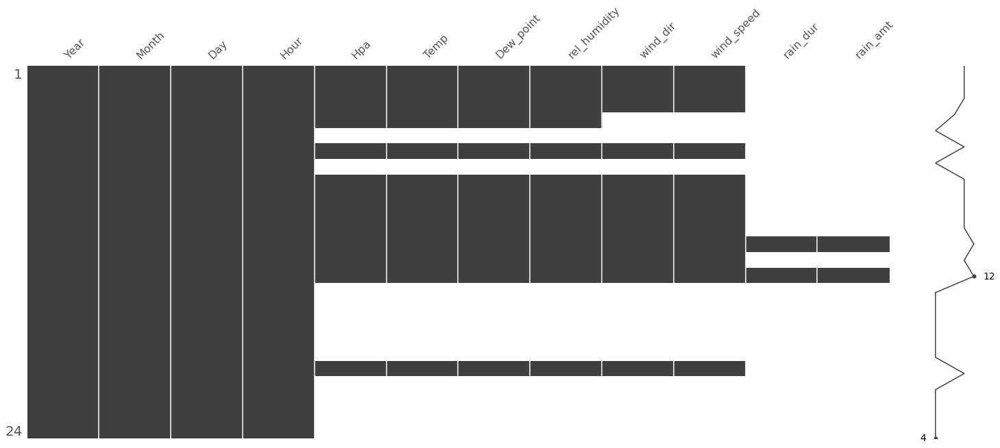

In [35]:
import missingno as msno

# filter the data for a particular day 15 and month of May in the year
year = 2013
month = 5
day = 15
filtered_df2 = sorted_df[(sorted_df['Year'] == year) & (sorted_df['Month'] == month) & (sorted_df['Day'] == day)]

# visualize the missingness of the filtered data
msno.matrix(filtered_df2)


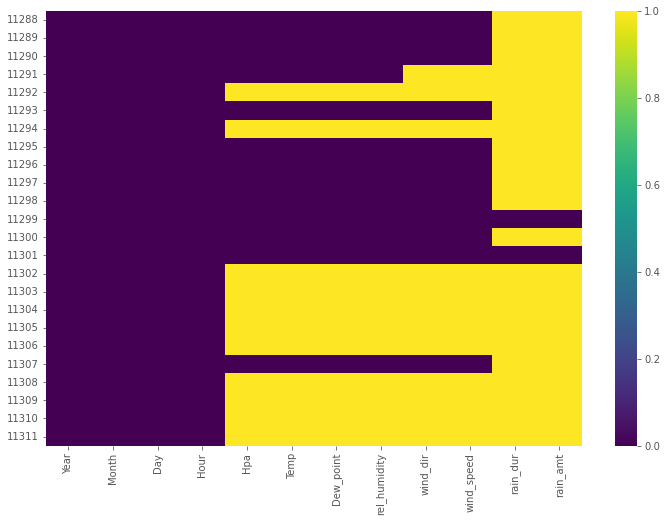

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create heatmap of missingness
sns.heatmap(filtered_df2.isnull(), cmap='viridis')

# Show plot
plt.show()

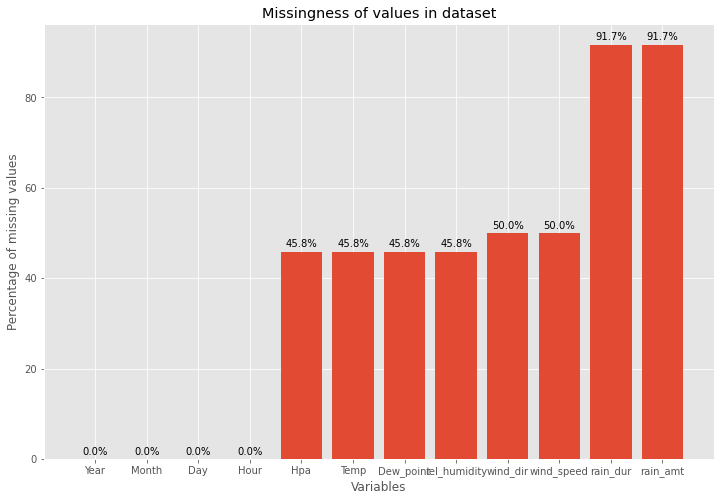

In [37]:
import matplotlib.pyplot as plt

# Calculate percentage of missing values for each variable
missing_percent = filtered_df2.isnull().sum() / len(filtered_df2) * 100

# Create bar chart of missingness
plt.bar(missing_percent.index, missing_percent.values)

# Add data labels to bars
for i, v in enumerate(missing_percent.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Set axis labels and title
plt.xlabel('Variables')
plt.ylabel('Percentage of missing values')
plt.title('Missingness of values in dataset')

# Show plot
plt.show()


## Observation
There were 50.0% missingness of values in wind speed and 45.8% in both Hpa, Temp and relative humidity on the 15th of May 2013 and that sugggest there was a technical issue with the instrument of measuring Hpa, relative humidity and Temp at a particular hours of the day with a variation of about 5%.

### Missingness of Data for a particular Day 15 in May in 2014 and its visualization

<AxesSubplot:>

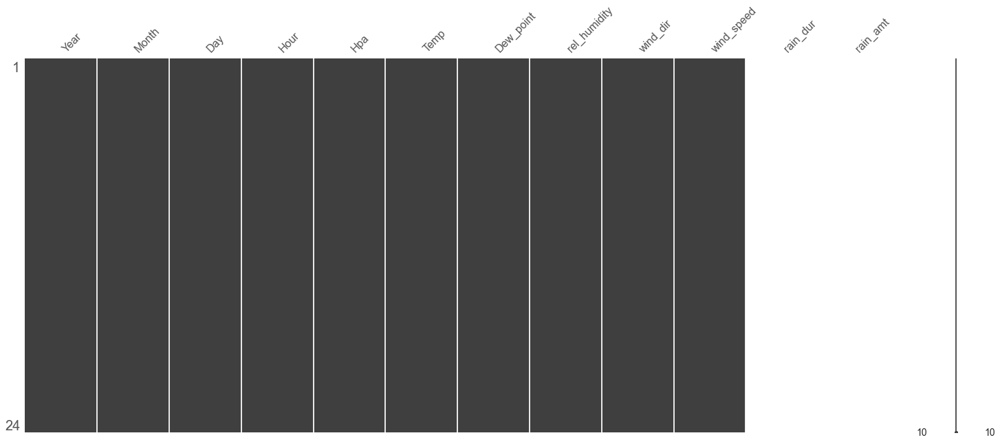

In [482]:
import missingno as msno

# filter the data for a particular day 15 and month of May in the year
year = 2014
month = 5
day = 15
filtered_df3 = sorted_df[(sorted_df['Year'] == year) & (sorted_df['Month'] == month) & (sorted_df['Day'] == day)]

# visualize the missingness of the filtered data
msno.matrix(filtered_df3)


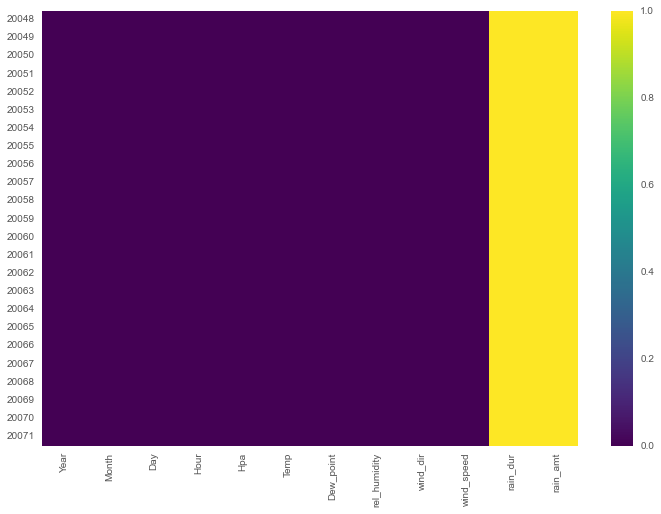

In [486]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create heatmap of missingness
sns.heatmap(filtered_df3.isnull(), cmap='viridis')

# Show plot
plt.show()

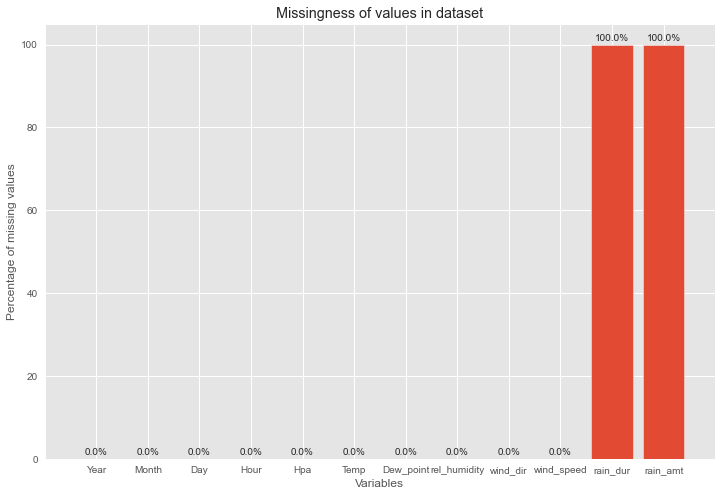

In [483]:
import matplotlib.pyplot as plt

# Calculate percentage of missing values for each variable
missing_percent = filtered_df3.isnull().sum() / len(filtered_df3) * 100

# Create bar chart of missingness
plt.bar(missing_percent.index, missing_percent.values)

# Add data labels to bars
for i, v in enumerate(missing_percent.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Set axis labels and title
plt.xlabel('Variables')
plt.ylabel('Percentage of missing values')
plt.title('Missingness of values in dataset')

# Show plot
plt.show()


## Observation
There were no missingness of values in wind speed, Hpa, Temp and relative humidity on the 15th of May 2014 and that sugggest there was no technical issue with the instrument of measuring Hpa, relative humidity and Temp within the hours of the day.

### Missingness of Data for the month of May in 2012 and its visualization

<AxesSubplot:>

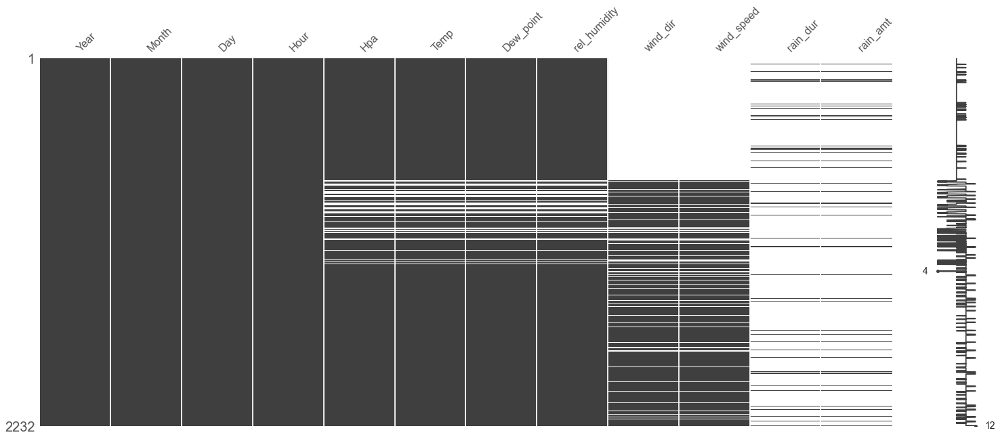

In [487]:
# filter the data for a particular year 2012 and month of May
year = '2012'
month = 5
filtered_df5 = sorted_df[(sorted_df['Year'] == year) | (sorted_df['Month'] == month)]

# visualize the missingness of the filtered data
msno.matrix(filtered_df5)


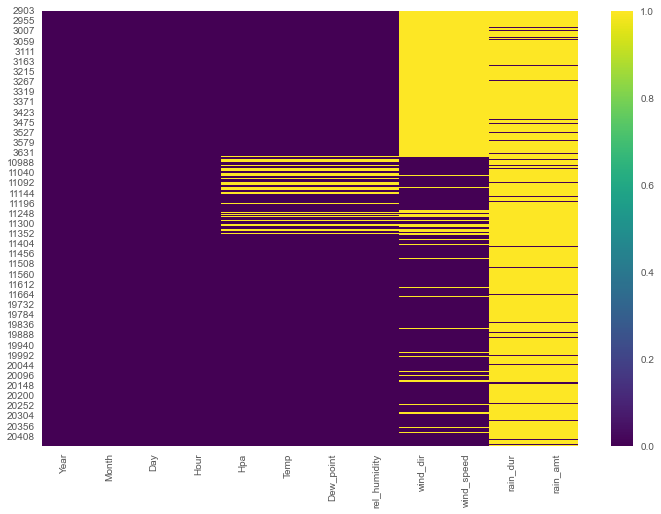

In [488]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create heatmap of missingness
sns.heatmap(filtered_df5.isnull(), cmap='viridis')

# Show plot
plt.show()


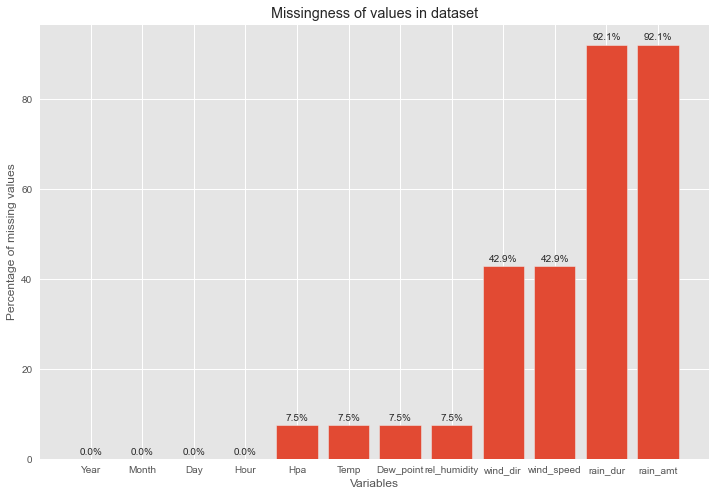

In [489]:
import matplotlib.pyplot as plt

# Calculate percentage of missing values for each variable
missing_percent = filtered_df5.isnull().sum() / len(filtered_df5) * 100

# Create bar chart of missingness
plt.bar(missing_percent.index, missing_percent.values)

# Add data labels to bars
for i, v in enumerate(missing_percent.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Set axis labels and title
plt.xlabel('Variables')
plt.ylabel('Percentage of missing values')
plt.title('Missingness of values in dataset')

# Show plot
plt.show()


## Observation
There were 42.9% missingness of values in wind speed and 7.5% in both Hpa, Temp and relative humidity on the 15th of May 2012 and that sugggest there was a technical issue with the instrument of measuring wind speed for majority of the hours in the day with a variation of about 35.4%.

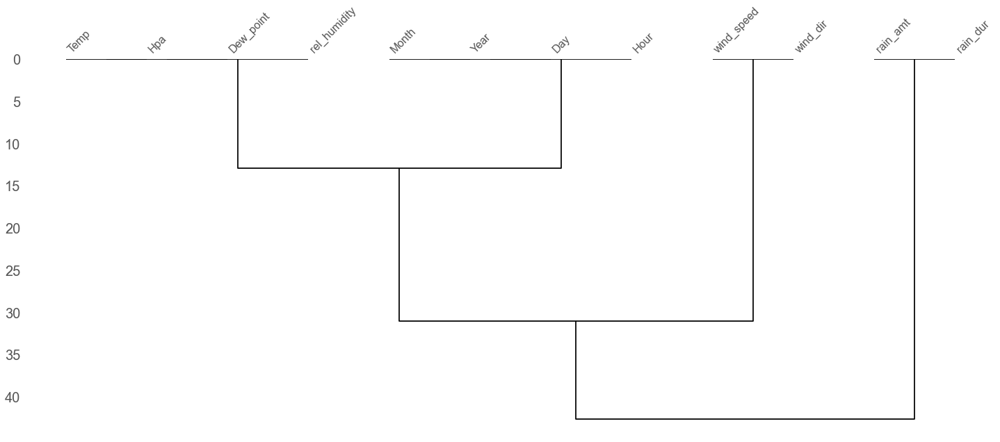

In [491]:
import missingno as msno

# Create dendrogram of missingness patterns
msno.dendrogram(filtered_df5)

# Show plot
plt.show()


A dendrogram is a tree diagram that shows the hierarchical relationship between objects. In this case, the dendrogram shows the hierarchical relationship between the variables in filtered_df5 based on their missingness patterns.

The dendrogram is constructed by first calculating the pairwise correlation between variables based on their missingness patterns. Variables that have similar missingness patterns are grouped together, and variables that have dissimilar missingness patterns are separated. The resulting groups and separations are then visualized in a tree-like structure called a dendrogram.

The height of each branch in the dendrogram represents the degree of dissimilarity between the variables it connects. The longer the branch, the more dissimilar the variables. The variables at the bottom of the dendrogram are the most dissimilar, while the variables at the top are the most similar.

By visualizing the missingness patterns in this way, you can gain insights into the underlying structure of your data and identify groups of variables that are likely to be related. This can be useful for imputing missing values and performing other data cleaning tasks.



### Missingness of Data for the month of May in 2013 and its visualization

<AxesSubplot:>

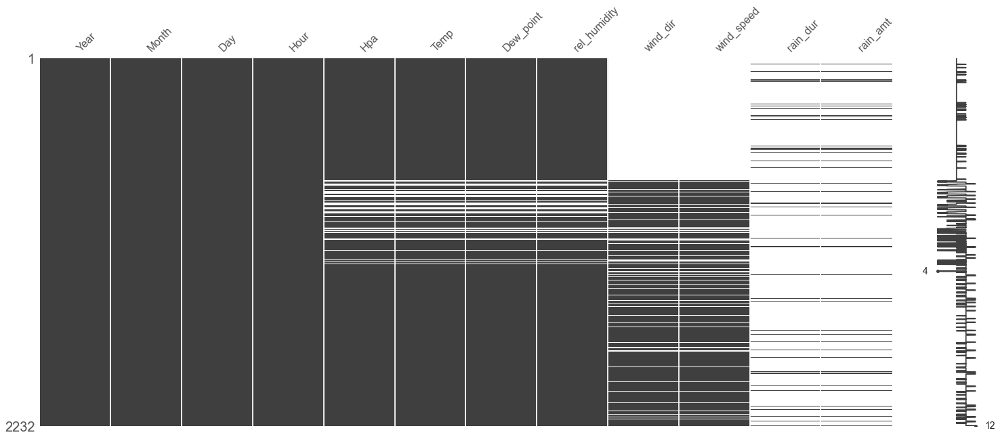

In [492]:
# filter the data for a particular year 2013 or month of May
year = '2013'
month = 5
filtered_df6 = sorted_df[(sorted_df['Year'] == year) | (sorted_df['Month'] == month)]

# visualize the missingness of the filtered data
msno.matrix(filtered_df6)


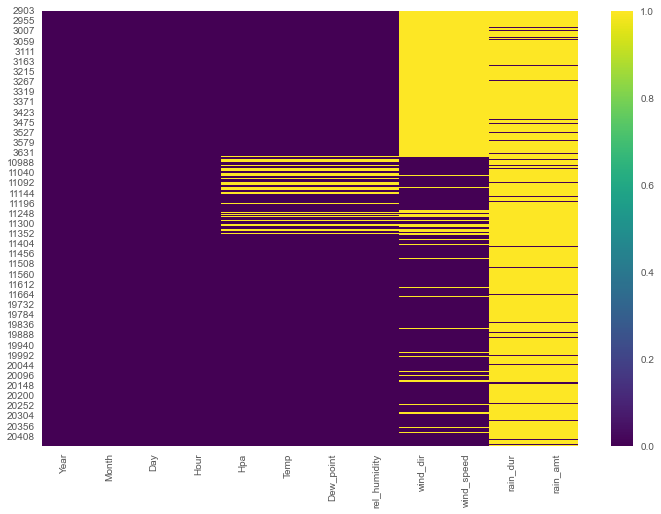

In [493]:
# Create heatmap of missingness
sns.heatmap(filtered_df6.isnull(), cmap='viridis')

# Show plot
plt.show()

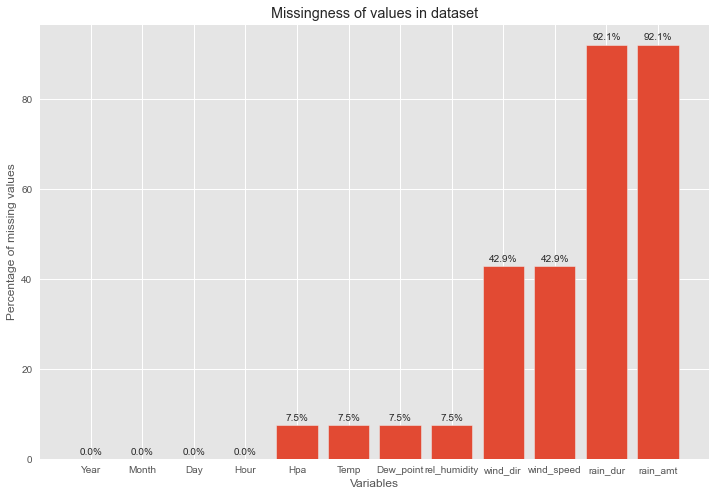

In [494]:
import matplotlib.pyplot as plt

# Calculate percentage of missing values for each variable
missing_percent = filtered_df6.isnull().sum() / len(filtered_df6) * 100

# Create bar chart of missingness
plt.bar(missing_percent.index, missing_percent.values)

# Add data labels to bars
for i, v in enumerate(missing_percent.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Set axis labels and title
plt.xlabel('Variables')
plt.ylabel('Percentage of missing values')
plt.title('Missingness of values in dataset')

# Show plot
plt.show()


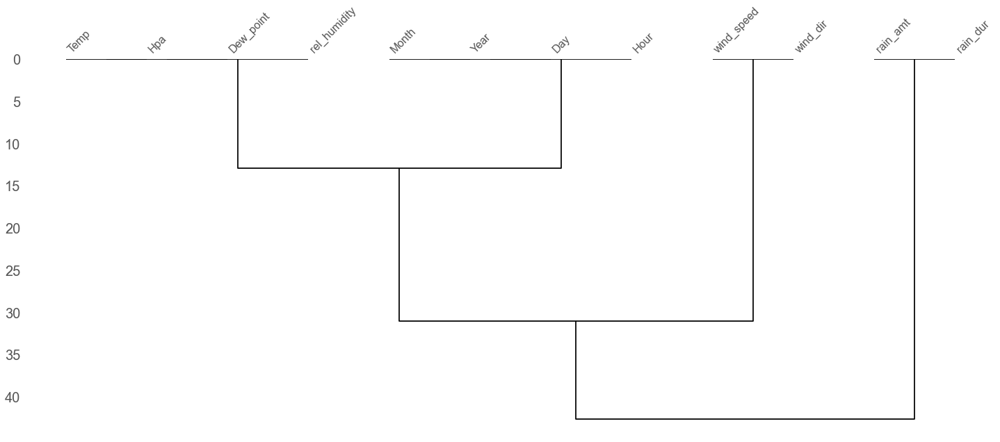

In [495]:
import missingno as msno

# Create dendrogram of missingness patterns
msno.dendrogram(filtered_df6)

# Show plot
plt.show()


## Observation
There were 42.9% missingness of values in wind speed and 7.5% in both Hpa, Temp and relative humidity on May 2013 and that sugggest there was a technical issue with the instrument of measuring wind speed in most of the hours of the month cummulatively with a variation of about 35.4%.

### Missingness of Data for the month of May in 2014 and its visualization

<AxesSubplot:>

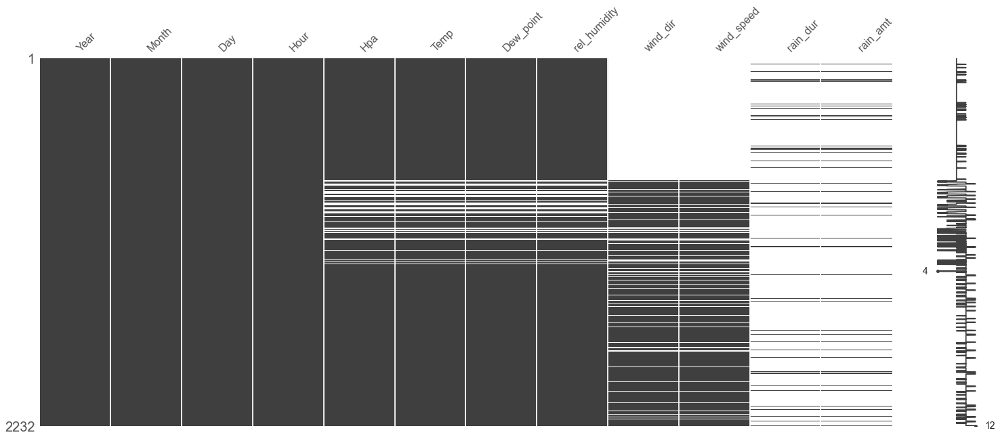

In [496]:
# filter the data for a particular year 2014 or month of May
year = '2014'
month = 5
filtered_df7 = sorted_df[(sorted_df['Year'] == year) | (sorted_df['Month'] == month)]

# visualize the missingness of the filtered data
msno.matrix(filtered_df7)


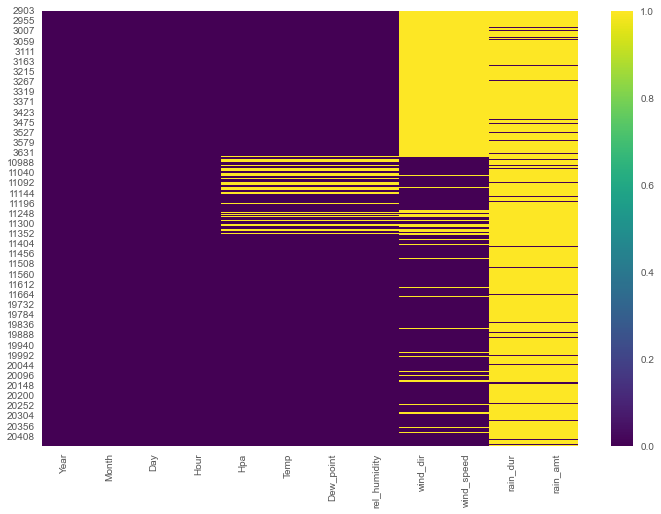

In [497]:
# Create heatmap of missingness
sns.heatmap(filtered_df7.isnull(), cmap='viridis')

# Show plot
plt.show()

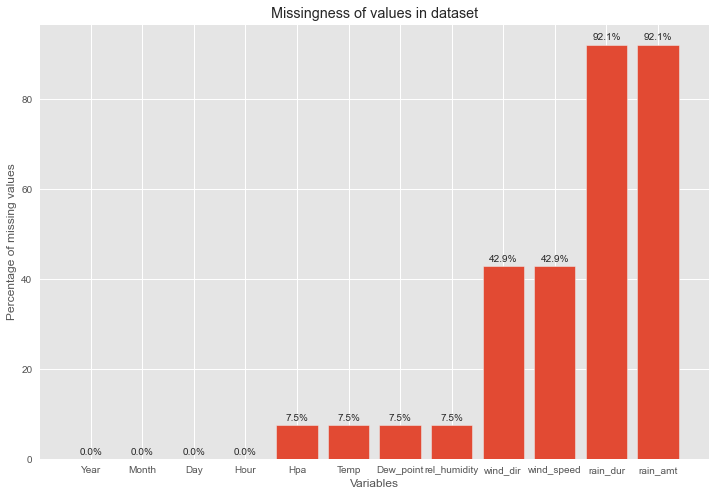

In [498]:
import matplotlib.pyplot as plt

# Calculate percentage of missing values for each variable
missing_percent = filtered_df7.isnull().sum() / len(filtered_df7) * 100

# Create bar chart of missingness
plt.bar(missing_percent.index, missing_percent.values)

# Add data labels to bars
for i, v in enumerate(missing_percent.values):
    plt.text(i, v + 1, f'{v:.1f}%', ha='center')

# Set axis labels and title
plt.xlabel('Variables')
plt.ylabel('Percentage of missing values')
plt.title('Missingness of values in dataset')

# Show plot
plt.show()


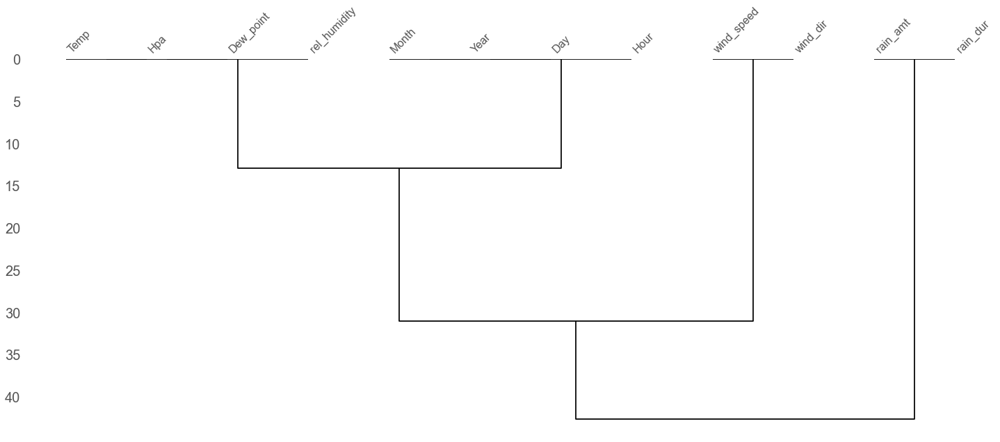

In [499]:
import missingno as msno

# Create dendrogram of missingness patterns
msno.dendrogram(filtered_df7)

# Show plot
plt.show()


## Observation
There was a similar pattern in May 2014 as we have 42.9% missingness of values in wind speed and 7.5% in both Hpa, Temp and relative humidity and that sugggest there was a technical issue with the instrument of measuring wind speed in most of the hours of the month cummulatively with a variation of about 35.4%.

## Trends of variables: Hpa, Temp, Relative humidity & Wind speed

### Hpa Trend for a Month - May in 2014

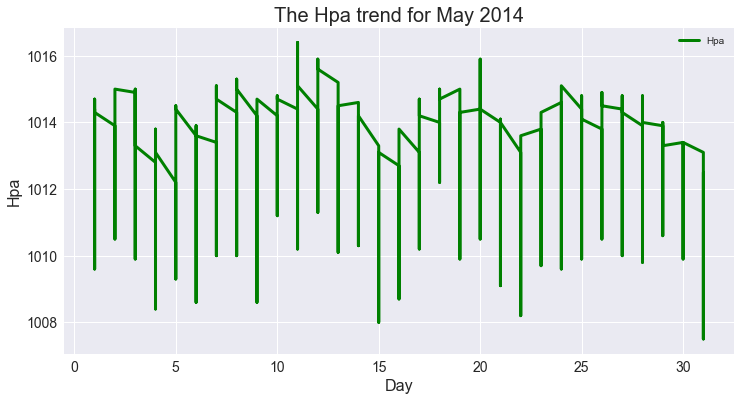

In [426]:
import matplotlib.pyplot as plt

# select rows where month is May and year is 2014
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014)]

plt.style.use('seaborn')
# line plot - the Hpa for May 2014
df_filtered.plot(x='Day', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for May 2014', fontsize=20)
plt.xlabel('Day', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


## Observation
The trend of Hpa for the month of May 2014 shows that there was an upward and downward movement with the lowest point to be 504atm on the 31st of May while the highest point is 1018atm on 11th of May. 

### Hpa Trend for a Day - 15 in the month of May 2014

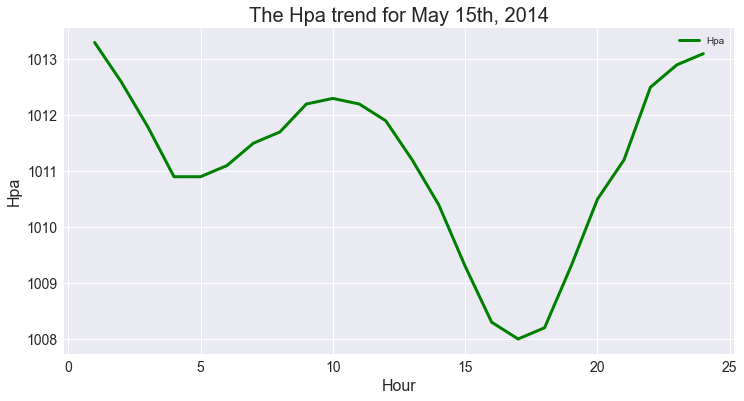

In [420]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2014, and day is 15
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15)]

plt.style.use('seaborn')
# line plot - the Hpa for May 15th, 2014
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for May 15th, 2014', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


## Observation
The trend of Hpa on 15th of May 2014 shows that it begins with a downward movement at 1013.5atm from the hour of 1:00hr to 4:00hr at 1010.8atm and then continue a steady movement to hit maximum point at 1012.39atm at the hour of 10:00hr before a decreasing trend till it hit a bottom 1008atm at the hour of 13:00hr before a sharp upward increase. 

### Hpa Trend by Month in 2014

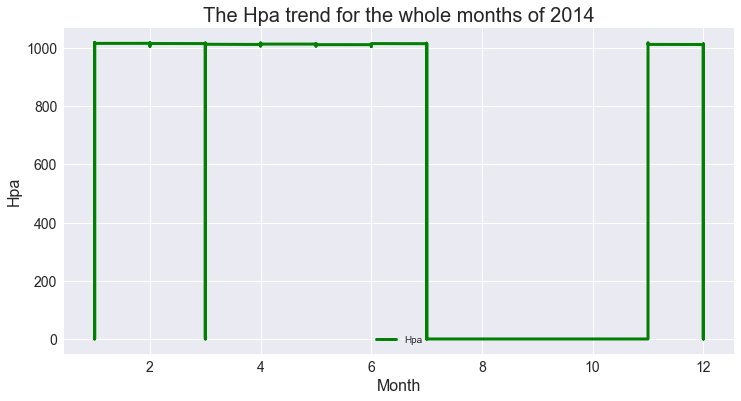

In [421]:
import matplotlib.pyplot as plt

# select rows where year is 2014
df_filtered = df.loc[df['Year'] == 2014]

plt.style.use('seaborn')
# line plot - the Hpa for the whole months of 2014
df_filtered.plot(x='Month', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for the whole months of 2014', fontsize=20)
plt.xlabel('Month', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


## Observation
The trend of Hpa for 2014 shows that there was an upward movement in January from 0atm to 1005atm which was steady till March and experince a fall in the same month before it surged to maintain a steady movement till July where its now experienced it lowest at 0atm from July till November; that shows that there were missing values and the abnormality of the values show that there was a technical issue with the instrument.

### Hpa Trend for a Month - May in 2013

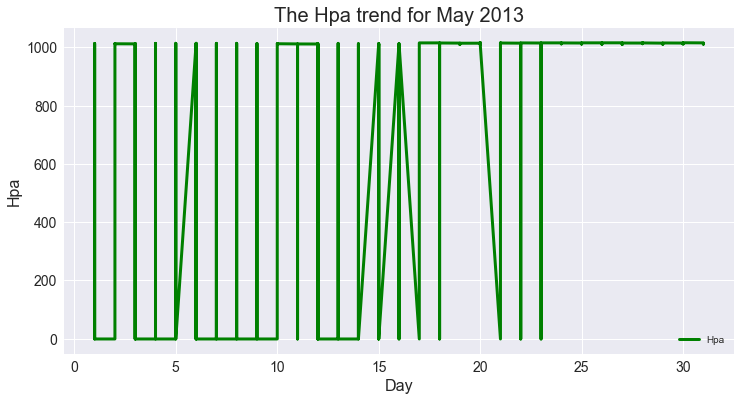

In [423]:
import matplotlib.pyplot as plt

# select rows where month is May and year is 2013
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2013)]

plt.style.use('seaborn')
# line plot - the Hpa for May 2013
df_filtered.plot(x='Day', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for May 2013', fontsize=20)
plt.xlabel('Day', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()

## Observation
The trend of Hpa for the month of May 2013 shows that there was an upward from 1st of May from 0atm to 1004atm and the trend continue like that till 24th of May with a 1004.89atm steady movement through the remainder of the month. 

### Hpa Trend for a Day - 15 in the month of May 2013

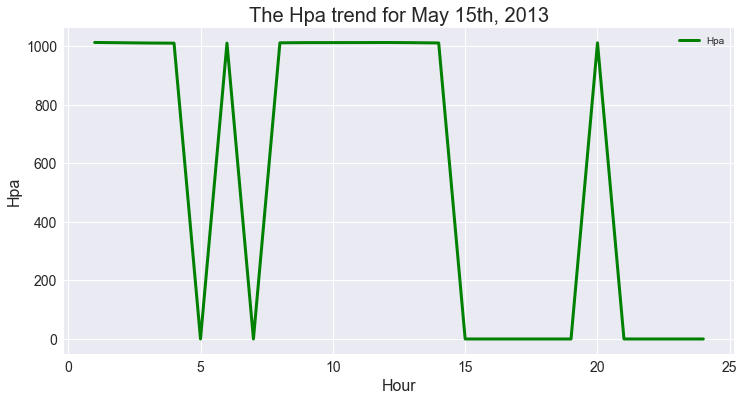

In [429]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2013, and day is 15
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2013) & (df['Day'] == 15)]

plt.style.use('seaborn')
# line plot - the Hpa for May 15th, 2013
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for May 15th, 2013', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


## Observation
There was a steady movement from 1005atm between the hours of 1:00hr to 4:00hr, then a sharp fall at 5:00hr to maintain the Hpa and saw another sharp fall at 7:00hr. Afterwards, a sharp increase from 8:00hr till 14:00hr after mainting the Hpa of about 1001.29atm and then decrease to 0atm which was steady till 19:00hr before it seen a sharp increase at 20:00hr and then lowest again at 21:00 till 24:00hrs. The points where it was lowest are points of missing data points for those hours.

### Hpa Trend by Month in the Year 2013

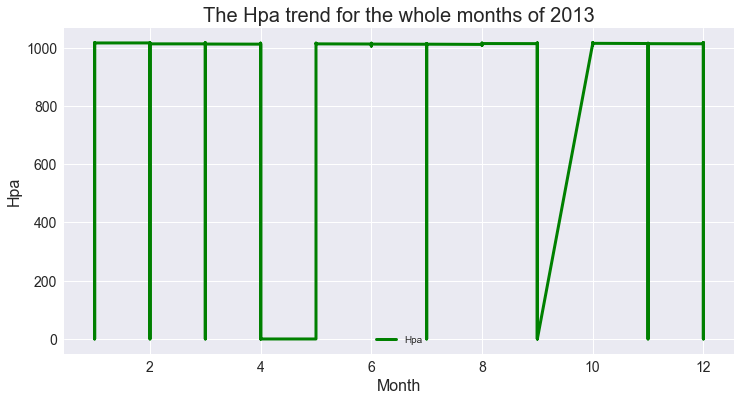

In [425]:
import matplotlib.pyplot as plt

# select rows where year is 2013
df_filtered = df.loc[df['Year'] == 2013]

plt.style.use('seaborn')
# line plot - the Hpa for the whole months of 2013
df_filtered.plot(x='Month', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for the whole months of 2013', fontsize=20)
plt.xlabel('Month', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()

## Observation
There was an upward increase from 1005atm at the month of January to February, then a sharp decline at April to maintain the Hpa and saw another sharp fall at July. Afterwards, a steady movement from July till September after mainting the Hpa of about 1001.29atm and then decrease to 0atm at September before it seen a sharp increase at September and then lowest again at November till December. The points where it was the lowest are points of missing data points for those months

### Hpa Trend for a Month - May in 2012

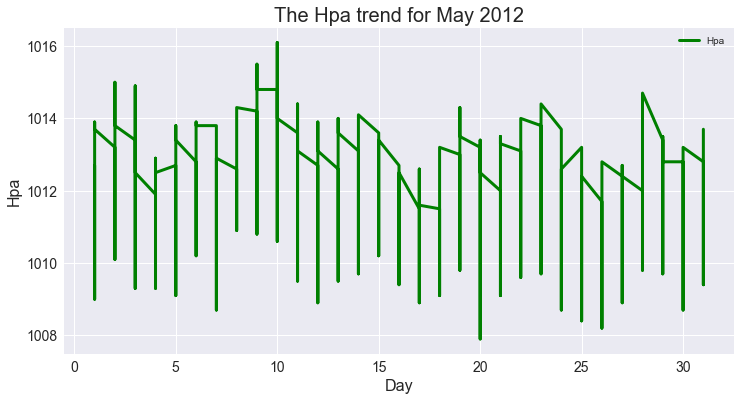

In [427]:
import matplotlib.pyplot as plt

# select rows where month is May and year is 2012
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2012)]

plt.style.use('seaborn')
# line plot - the Hpa for May 2012
df_filtered.plot(x='Day', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for May 2012', fontsize=20)
plt.xlabel('Day', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


## Observation
There was an upward increase from 1009atm on the 1st of May, 2021 to 1013.89atm, with a continous upward and downward movement. it experience it lowest on the 20th of May, 2012 with a value of Hpa at 1008atm while it highest was on the 10th of May, 2012 with a value of 1016.98atm.

### Hpa Trend for a Day - 15 in the month of May 2012

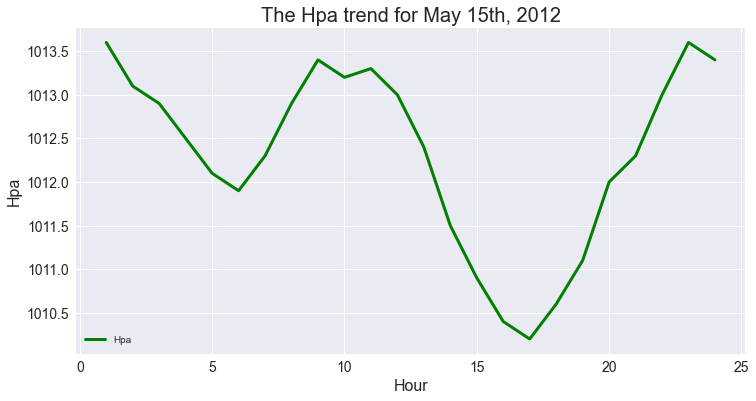

In [428]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2012, and day is 15
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2012) & (df['Day'] == 15)]

plt.style.use('seaborn')
# line plot - the Hpa for May 15th, 2012
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for May 15th, 2012', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


## Observation
There was an downward movement from 1013.7atm at the hour of 1:00hr to 1012.56atm at the hour of 6:00hr, then a sharp increase happened at 6:00hr with an upward trend and then experienced it lowest at 17:00hr with Hpa value of 1005atm, then continue an upward trend to its highest at 23:00hr with a value of 1013.6atm.

### Hpa Trend for the whole month of the Year 2012

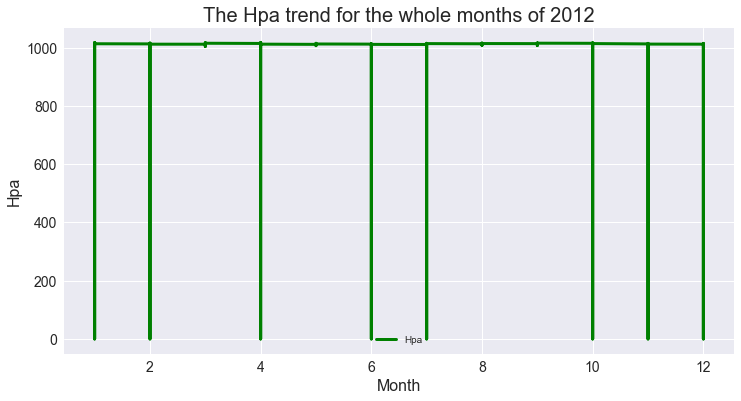

In [430]:
# select rows where year is 2012
df_filtered = df.loc[df['Year'] == 2012]

plt.style.use('seaborn')
# line plot - the Hpa for the whole months of 2012
df_filtered.plot(x='Month', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend for the whole months of 2012', fontsize=20)
plt.xlabel('Month', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()

## Observation
There was an upward increase from 1002atm at the month of January to February, then a sharp decline at February to maintain the Hpa till April at value of 1001atm and saw another sharp fall at June to a value of 0atm. Afterwards, it continues in that pattern. The points where it was the lowest are points of missing data points for those months

In [30]:
# statiscal description of without missing dataframe
df.describe()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
count,24579.000000,24579.000000,24579.00000,24579.000000,21532.000000,21532.000000,21532.000000,21532.000000,12492.000000,12492.000000,1718.000000,1718.000000
mean,2012.986615,6.387933,15.78266,12.492494,1012.924067,26.518521,22.867764,82.459038,162.425552,0.895805,27.917346,3.618335
std,0.802252,3.497451,8.88359,6.921909,2.099394,3.492710,1.608676,16.198726,111.725108,0.552354,17.881091,6.389056
min,2012.000000,1.000000,1.00000,1.000000,1005.200000,15.300000,12.000000,25.000000,10.000000,0.300000,1.000000,0.100000
25%,2012.000000,3.000000,8.00000,6.000000,1011.500000,23.800000,22.200000,70.000000,50.000000,0.500000,12.000000,0.400000
50%,2013.000000,6.000000,16.00000,12.000000,1013.000000,25.300000,23.100000,90.000000,170.000000,0.700000,23.500000,1.200000
75%,2014.000000,9.000000,23.00000,18.000000,1014.400000,29.300000,23.900000,96.000000,250.000000,1.200000,42.000000,3.800000
max,2014.000000,12.000000,31.00000,24.000000,1020.000000,37.000000,27.600000,100.000000,360.000000,13.200000,60.000000,55.100000


## Dealing with Missing values in all the features of the Dataset

In [31]:
from sklearn.impute import KNNImputer

In [32]:
## Using KNN Imputer to imput missing values
impute_knn = KNNImputer(n_neighbors = 5)
imputed_df_knn = impute_knn.fit_transform(df)

In [33]:
# Convert the imputed data array back into a DataFrame
imputed_df = pd.DataFrame(imputed_df_knn, columns = df.columns) 

In [34]:
# check the head
imputed_df.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012.0,1.0,1.0,1.0,1014.9,24.4,23.0,92.0,192.0,0.54,39.6,2.32
1,2012.0,1.0,1.0,2.0,1014.5,24.3,23.0,93.0,168.0,0.46,39.6,2.32
2,2012.0,1.0,1.0,3.0,1013.7,23.8,23.2,96.0,182.0,0.42,57.0,1.80
3,2012.0,1.0,1.0,4.0,1012.9,23.6,23.1,97.0,138.0,0.38,60.0,4.30
4,2012.0,1.0,1.0,5.0,1013.3,23.5,23.1,98.0,216.0,0.42,60.0,9.80


In [35]:
# check the tail
imputed_df.tail()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
24574,2014.0,12.0,31.0,20.0,1014.02,26.42,22.48,79.4,166.0,0.78,45.0,5.58
24575,2014.0,12.0,31.0,21.0,1014.88,25.32,22.50,84.8,136.0,0.62,47.2,6.52
24576,2014.0,12.0,31.0,22.0,1015.58,24.60,22.42,88.0,242.0,0.52,38.0,3.64
24577,2014.0,12.0,31.0,23.0,1015.94,23.84,22.32,91.6,206.0,0.50,38.0,3.64
24578,2014.0,12.0,31.0,24.0,1015.34,23.84,22.70,93.6,210.0,0.44,38.0,3.64


In [36]:
# checking if there is missing values
imputed_df.isnull().sum()

Year            0
Month           0
Day             0
Hour            0
Hpa             0
Temp            0
Dew_point       0
rel_humidity    0
wind_dir        0
wind_speed      0
rain_dur        0
rain_amt        0
dtype: int64

There are no missing NULL values in the dataset, we are now ready for Exploratory Data Analysis

## Exploratory Data Analysis And Visualization of without Missing values Dataframe
- Univariate Analysis
- Bivariate Analysis
- Multivariate Analysis

### Univariate Analysis
- checking a feature of the dataset and its visuals

In [37]:
# Descriptive statistical analysis of atmospheric presure(Hpa) 
imputed_df['Hpa'].describe()

count    24579.000000
mean      1012.902575
std          2.040349
min       1005.200000
25%       1011.500000
50%       1012.980000
75%       1014.300000
max       1020.000000
Name: Hpa, dtype: float64

<AxesSubplot:xlabel='Hpa'>

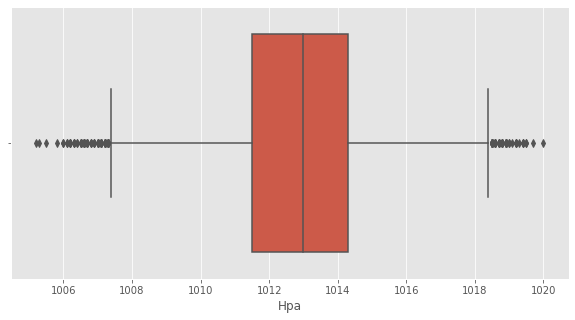

In [38]:
fig = plt.figure(figsize =(10, 5))

# Creating a Boxplot
sns.boxplot(data = imputed_df, x = 'Hpa')

<AxesSubplot:xlabel='Hpa', ylabel='Count'>

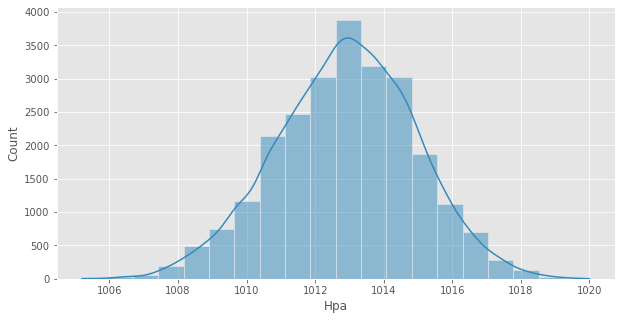

In [39]:
# creating an histogram plot
fig = plt.figure(figsize =(10, 5))
sns.histplot(data = imputed_df, x= 'Hpa', bins=20, kde=True)

## Observation
It seen that the average Hpa across the year is 1012.903, while the median is 1012.98 with a minimum of 1005.2 and a maximum of 1020. The Histogram shows the normal distribution of Hpa across the year 2012 to 2014 with a mode of 1003.2.

In [40]:
# Descriptive statistical analysis for temperature(Temp) 
imputed_df['Temp'].describe()

count    24579.000000
mean        26.496137
std          3.420946
min         15.300000
25%         23.800000
50%         25.300000
75%         29.200000
max         37.000000
Name: Temp, dtype: float64

<AxesSubplot:xlabel='Temp'>

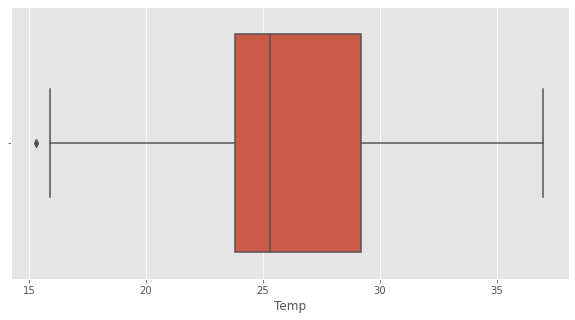

In [41]:
fig = plt.figure(figsize =(10, 5))

# Creating a Boxplot
sns.boxplot(data = imputed_df, x = 'Temp')

<AxesSubplot:xlabel='Temp', ylabel='Count'>

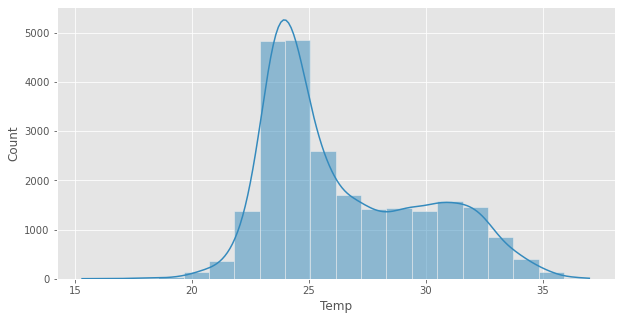

In [42]:
# creating an histogram plot
fig = plt.figure(figsize =(10, 5))
sns.histplot(data = imputed_df, x= 'Temp', bins=20, kde=True)

## Observation
It seen that the average Temp across the year is 24.962, while the median is 25.3 with a minimum of 15.3 and a maximum of 37. The Histogram shows the normal distribution of Temp across the year 2012 to 2014 with a bimodal of 23 and 24 which is rightly skewed.

In [43]:
# Descriptive statistical analysis for relative humidity(rel_humidity) 
imputed_df['rel_humidity'].describe()

count    24579.000000
mean        82.843598
std         15.864097
min         25.000000
25%         70.000000
50%         90.000000
75%         96.000000
max        100.000000
Name: rel_humidity, dtype: float64

<AxesSubplot:xlabel='rel_humidity'>

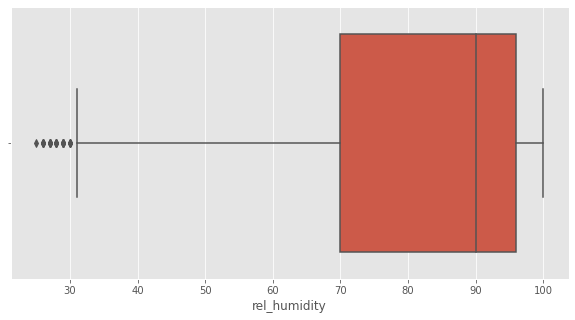

In [44]:
fig = plt.figure(figsize =(10, 5))

# Creating a Boxplot
sns.boxplot(data = imputed_df, x = 'rel_humidity')

<AxesSubplot:xlabel='rel_humidity', ylabel='Count'>

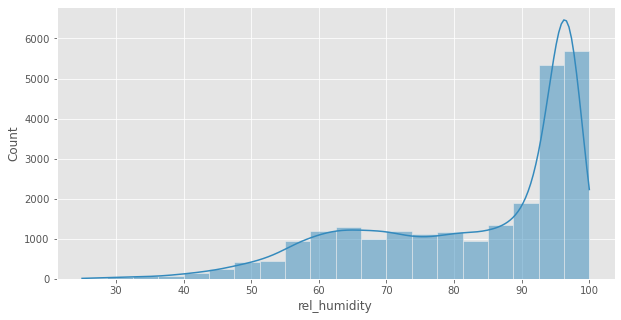

In [45]:
fig = plt.figure(figsize =(10, 5))
sns.histplot(data = imputed_df, x= 'rel_humidity', bins = 20, kde=True)

## Observation
It seen that the average Relative humidity across the year is 82.84%, while the median is 90% with a minimum of 25% and a maximum of 100%. The Histogram shows the normal distribution of Relative humidity across the year 2012 to 2014 is skewed to the left with a mode of 100%

In [46]:
# Descriptive statistical analysis for wind speed(wind_speed) 
imputed_df['wind_speed'].describe()

count    24579.000000
mean         0.832642
std          0.480177
min          0.300000
25%          0.460000
50%          0.700000
75%          1.100000
max         13.200000
Name: wind_speed, dtype: float64

<AxesSubplot:xlabel='wind_speed'>

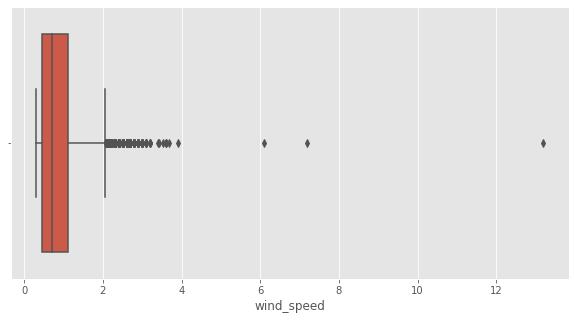

In [47]:
fig = plt.figure(figsize =(10, 5))

# Creating a Boxplot
sns.boxplot(data = imputed_df, x = 'wind_speed')

<AxesSubplot:xlabel='wind_speed', ylabel='Count'>

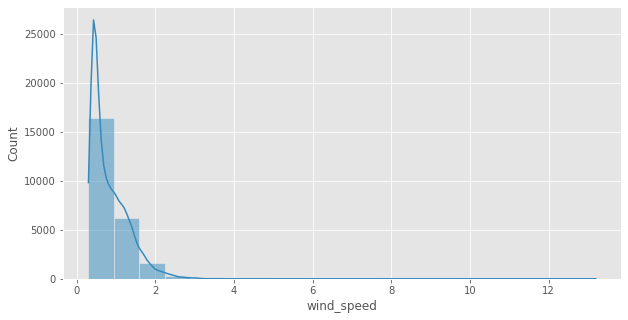

In [48]:
fig = plt.figure(figsize =(10, 5))
sns.histplot(data = imputed_df, x= 'wind_speed', bins = 20, kde=True)

## Observation
It seen that the average Wind speed across the year is 0.83m/s, while the median is 0.7m/s with a minimum of 0.3m/s and a maximum of 13.2m/s. The Histogram shows the normal distribution of has inbalance data points because of the missing values across the year 2012 to 2014, hence, the bell shape has contours and slightly skewed to the right with a mode of 1m/s.

### Bivariate Analysis
- comparing two features or variables and their visuals.

In [49]:
# Average Hpa by year
hpa_yr = imputed_df['Hpa'].groupby(imputed_df.Year).mean()
hpa_yr

Year
2012.0    1012.717504
2013.0    1012.866757
2014.0    1013.135988
Name: Hpa, dtype: float64

<AxesSubplot:xlabel='Year', ylabel='Hpa'>

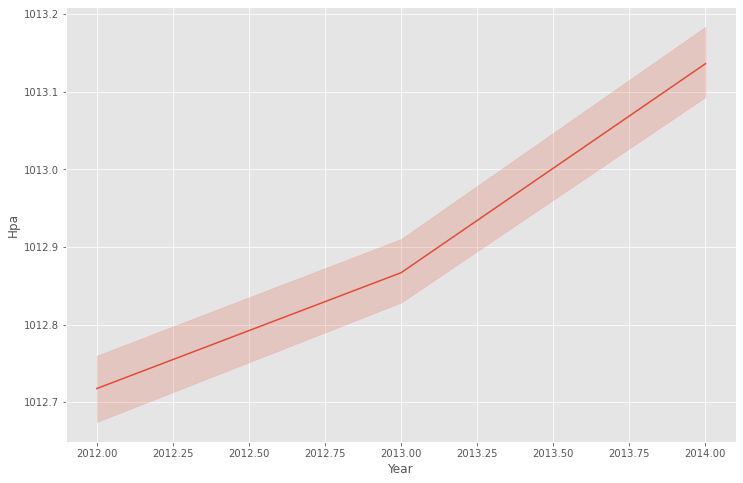

In [50]:
# visualizing Hpa by Year
sns.lineplot(data = imputed_df, x = "Year", y = "Hpa")

## Observation
There was an upward increase from the year 2012 with a value of 1012.73atm to 2013 with a value of 1012.79atm, then a further sharp steady increase till the year 2014 with a value of 1013.14atm

In [51]:
# average Hpa by Month
imputed_df['Hpa'].groupby(imputed_df.Month).mean()

Month
1.0     1014.325925
2.0     1012.935184
3.0     1013.233504
4.0     1012.714315
5.0     1012.203746
6.0     1011.312034
7.0     1012.082079
8.0     1012.860534
9.0     1013.422686
10.0    1013.720243
11.0    1012.824401
12.0    1013.070818
Name: Hpa, dtype: float64

<AxesSubplot:xlabel='Month', ylabel='Hpa'>

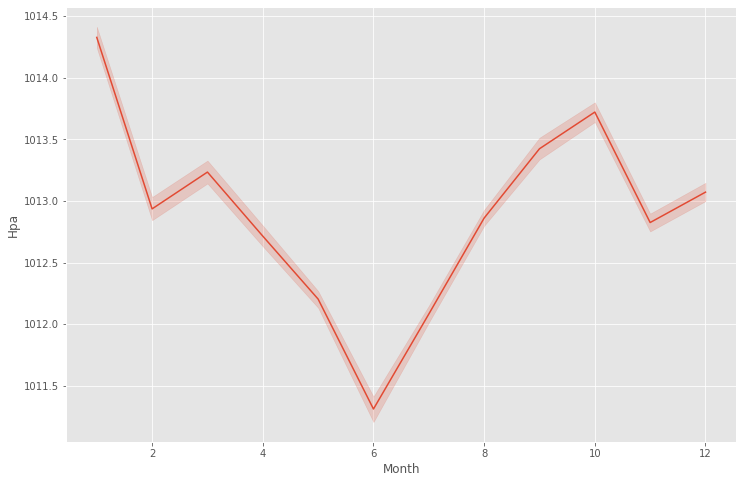

In [52]:
# Visualizing average Hpa by Month
sns.lineplot(data= imputed_df, x="Month", y="Hpa")

## Observation
There was a decline from the month of January with a value of 1014.45atm to February with a value of 1012.89atm, then a little rise to the month of March with a value of 1013.25. it further saw a sharp steady decline till the month of June with a value of 1011.24atm which was the lowest and the a smooth steady increase from June till October at a value of 1013.58. later, saw a decline from October to Novermber with a difference of 1.03atm before it went up in December.

In [54]:
# average Hpa by Day
imputed_df['Hpa'].groupby(imputed_df.Day).mean()

Day
1.0     1012.874070
2.0     1012.911704
3.0     1012.839019
4.0     1012.832458
5.0     1012.892971
6.0     1012.943985
7.0     1012.799794
8.0     1012.832741
9.0     1012.709519
10.0    1012.816405
11.0    1012.792252
12.0    1012.751944
13.0    1012.753283
14.0    1012.711139
15.0    1012.749735
16.0    1012.793750
17.0    1012.813714
18.0    1012.932725
19.0    1012.967509
20.0    1013.110920
21.0    1012.934706
22.0    1012.815147
23.0    1012.855956
24.0    1013.006379
25.0    1012.986201
26.0    1013.035166
27.0    1013.229000
28.0    1013.226587
29.0    1013.091590
30.0    1012.904922
31.0    1013.107354
Name: Hpa, dtype: float64

<AxesSubplot:xlabel='Day', ylabel='Hpa'>

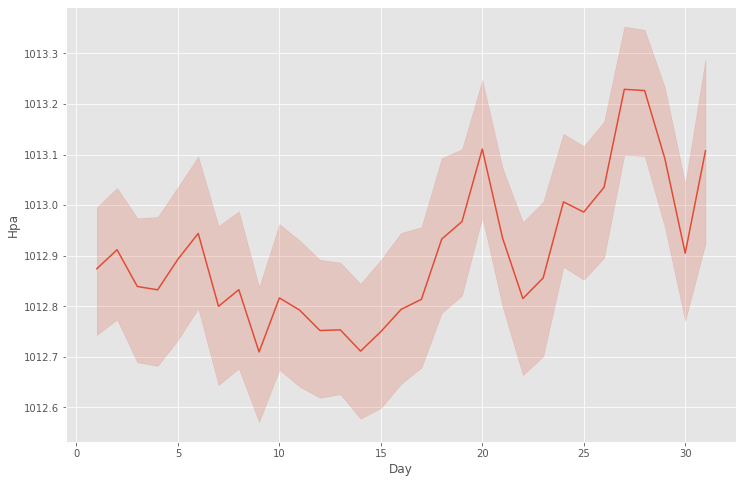

In [55]:
# Visualizing average Hpa by Day
sns.lineplot(data= imputed_df, x="Day", y="Hpa")

## Observation
This experienced it lowest with an Hpa value of 1012.4atm at of Day 9 and it highest at Day 27 with a value of 1013.25atm

In [56]:
# average Hpa by MST
imputed_df['Hpa'].groupby(imputed_df['Hour']).mean()

Hour
1.0     1014.117719
2.0     1013.534800
3.0     1012.948020
4.0     1012.547305
5.0     1012.457580
6.0     1012.668410
7.0     1013.085815
8.0     1013.725912
9.0     1014.356059
10.0    1014.632812
11.0    1014.467734
12.0    1013.902476
13.0    1013.046699
14.0    1012.038127
15.0    1011.078751
16.0    1010.496794
17.0    1010.377537
18.0    1010.716031
19.0    1011.403092
20.0    1012.233763
21.0    1013.129384
22.0    1013.916301
23.0    1014.350605
24.0    1014.420842
Name: Hpa, dtype: float64

<AxesSubplot:xlabel='Hour', ylabel='Hpa'>

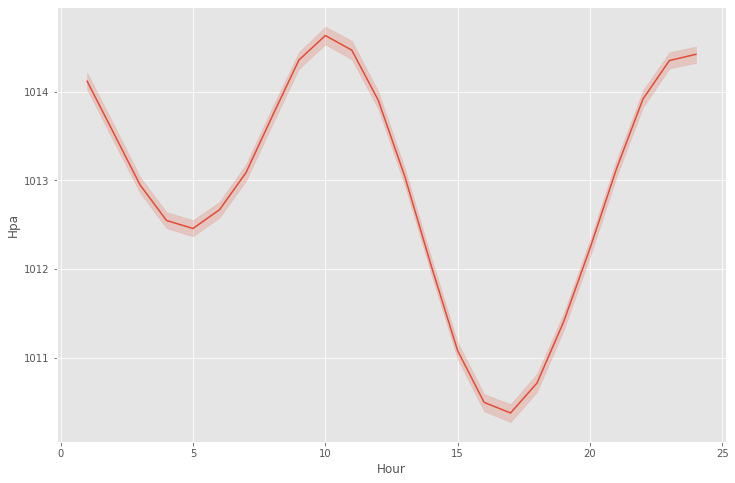

In [57]:
# Visualizing average Hpa by Hour
sns.lineplot(data= imputed_df, x= 'Hour', y="Hpa")

## Observation
It has two minimum points at 5:00hr with an Hpa value of 1012.5atm and at 17:00hr with a value of 505.2atm. The maximuum point of Hpa with a value of 1014.5atm occured at 10:00hr.

In [58]:
# Pivot the dataframe to a wide-form representation:
df_wide = pd.pivot_table(imputed_df, index = "Year", columns = "Month", values = "Hpa")
df_wide.head()

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Year,,,,,,,,,,,,
2012.0,1013.108333,1012.039367,1012.638575,1012.821667,1011.881586,1011.267005,1012.254973,1013.170811,1013.706103,1013.347415,1012.725495,1012.688441
2013.0,1014.423892,1013.187024,1013.308710,1012.131000,1012.129382,1011.259167,1012.082500,1012.728898,1013.124444,1014.254570,1012.378333,1013.349489
2014.0,1015.446075,1013.609821,1013.753226,1013.190278,1012.600269,1011.377222,1011.908763,1012.678674,1013.734074,1013.420442,1013.365480,1013.179185


<AxesSubplot:xlabel='Year', ylabel='4.0'>

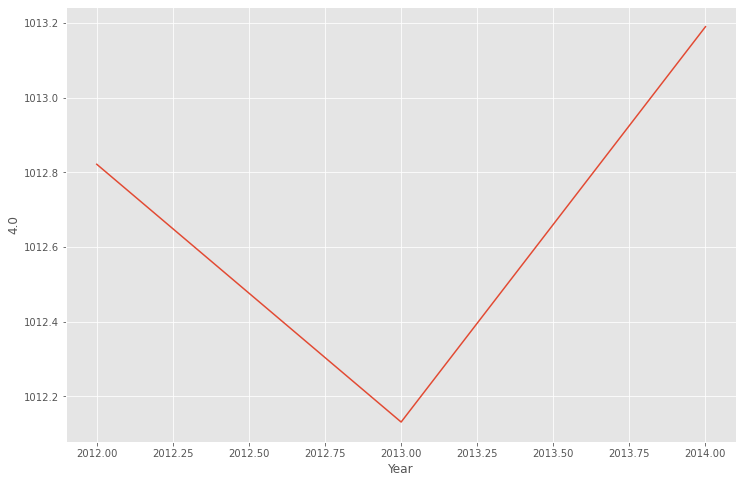

In [59]:
# checking the trend in May
sns.lineplot(data=df_wide[4]) # 5 ==> May

## Observation
It has a minimum point at 2013 with an Hpa value of 1011.5atm and experienced an upward trend till its maximuum point of Hpa with a value of 1013.19atm occured in 2014.

In [60]:
# Pivot the dataframe to a wide-form representation:
df_wide1 = pd.pivot_table(imputed_df, index = "Month", columns = "Year", values = "Hpa")
df_wide1

Year,2012.0,2013.0,2014.0
Month,,,
1.0,1013.108333,1014.423892,1015.446075
2.0,1012.039367,1013.187024,1013.609821
3.0,1012.638575,1013.308710,1013.753226
4.0,1012.821667,1012.131000,1013.190278
5.0,1011.881586,1012.129382,1012.600269
6.0,1011.267005,1011.259167,1011.377222
7.0,1012.254973,1012.082500,1011.908763
8.0,1013.170811,1012.728898,1012.678674
9.0,1013.706103,1013.124444,1013.734074


<AxesSubplot:xlabel='Month'>

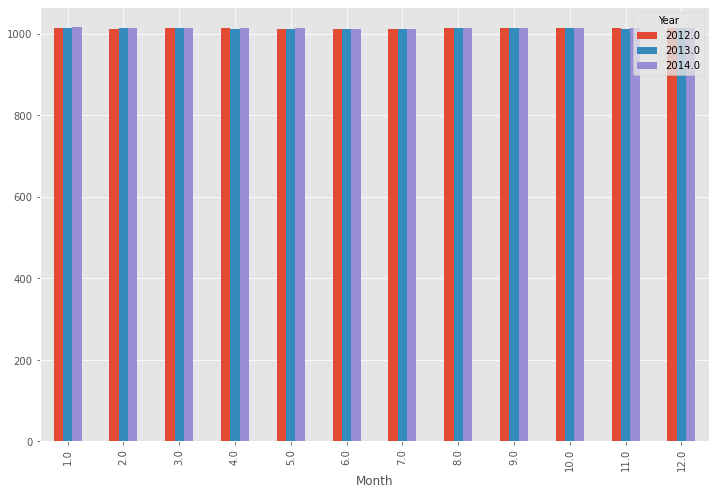

In [61]:
df_wide1.plot.bar()

<AxesSubplot:xlabel='Year'>

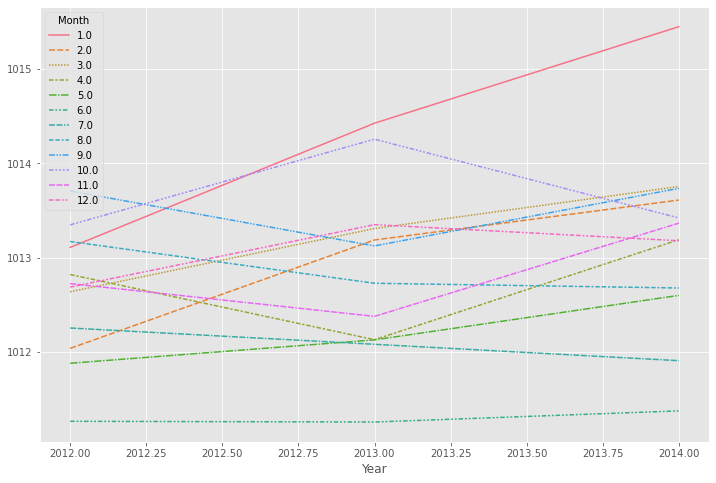

In [62]:
# plots a separate line for each month:
sns.lineplot(data=df_wide, legend='auto')

## Observation
The month of January from 2012 to 2014 had the highest Hpa while the month of June had the lowest Hpa compared to every other months.Though there was a slight variation that between the months for each year.

In [63]:
# Pivot the dataframe to a wide-form representation:
df_wide2 = pd.pivot_table(imputed_df, index = "Day", columns = "Month", values = "Hpa")
df_wide2

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Day,,,,,,,,,,,,
1.0,1013.786111,1014.589577,1012.593056,1012.591667,1012.051944,1011.394444,1012.131667,1012.621111,1013.283333,1014.151163,1013.191148,1012.690278
2.0,1013.891667,1014.101389,1012.513889,1012.637500,1012.256944,1011.033333,1012.195278,1012.856389,1013.476389,1015.102083,1012.598592,1013.002778
3.0,1014.411471,1013.420000,1013.051389,1013.548611,1012.095556,1010.241667,1011.393333,1012.370000,1013.067500,1014.900000,1013.305556,1013.037500
4.0,1013.756944,1013.223611,1013.923611,1013.401389,1011.400556,1011.020833,1011.151111,1012.201429,1013.213611,1014.341667,1013.922222,1012.918056
5.0,1013.505556,1013.426389,1013.641667,1013.480556,1011.685000,1010.872222,1010.854444,1012.891667,1013.552333,1014.739583,1014.157778,1012.633889
6.0,1013.901389,1012.965000,1013.074722,1013.626389,1011.881111,1010.985714,1010.804722,1013.646667,1013.979167,1014.095833,1013.903611,1012.566944
7.0,1014.568056,1012.309722,1012.851389,1013.240556,1012.383611,1010.002083,1010.901667,1013.306944,1014.025000,1014.064583,1012.890278,1012.997818
8.0,1014.870833,1012.241667,1013.204167,1013.151389,1012.505278,1009.741667,1011.670556,1012.818333,1014.408333,1013.808333,1012.450556,1012.970526
9.0,1014.277778,1012.729167,1012.785278,1013.084167,1012.514444,1010.120833,1011.705278,1012.539143,1014.122917,1013.827083,1012.316667,1012.467500


<AxesSubplot:xlabel='Day'>

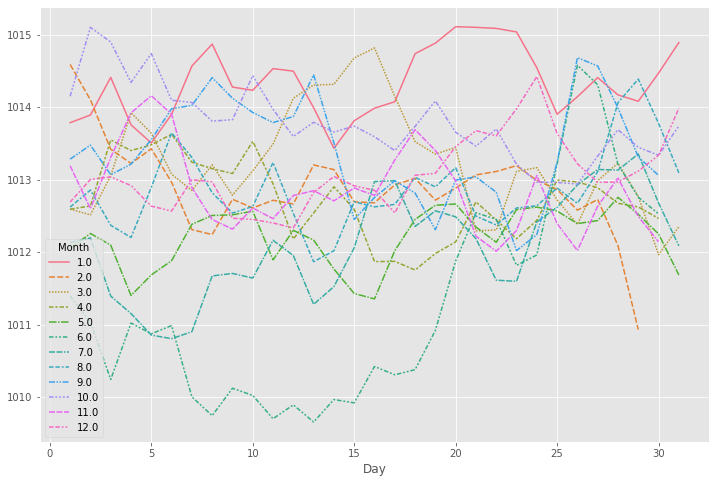

In [64]:
# plots a separate line for each month:
sns.lineplot(data=df_wide2, legend='auto')

### Observation
- The wind speed experience the lowest in the month of June(month number 6) with a point of about 1010.49 atm at Day 13 and the highest in the month of January and October(month number 1 & 10) with a point of 1015.11 atm at Day 2 and 20 respectively compared to every other days of the months.

In [65]:
# Hpa by temp
imputed_df['Hpa'].groupby(imputed_df.Temp).mean().sort_values()

Temp
37.00    1007.30
31.94    1007.80
32.46    1008.20
29.90    1008.22
36.90    1008.50
          ...   
25.30    1015.78
27.96    1015.82
26.22    1016.44
19.10    1016.60
28.24    1016.64
Name: Hpa, Length: 942, dtype: float64

<AxesSubplot:xlabel='Hpa', ylabel='Temp'>

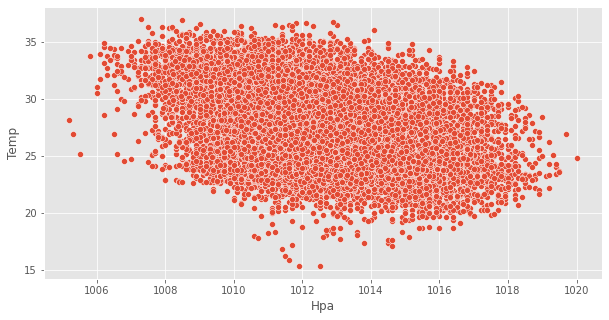

In [66]:
# scatter plot of atmospheric pressure by temperature
fig = plt.figure(figsize =(10, 5))
sns.scatterplot(data= imputed_df, x="Hpa", y="Temp")

<AxesSubplot:xlabel='Hpa', ylabel='Temp'>

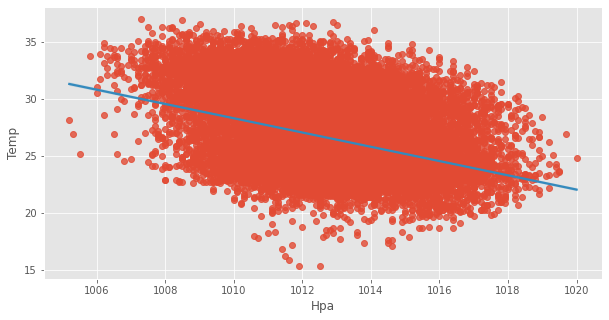

In [67]:
# regression plot of atmospheric pressure by temperature
fig = plt.figure(figsize =(10, 5))
sns.regplot(data = imputed_df, x="Hpa", y="Temp", line_kws={"color": "C1"})

## Observation
This shows a negative correlation between Temp and Hpa for each of the year 2012 to 2014. That means that the higher the temperature the lower the Atmospheric pressure and vice versa.

In [68]:
# Hpa by relative humidity
imputed_df['rel_humidity'].groupby(imputed_df.Hpa).mean().sort_values()

Hpa
1005.80    46.000000
1006.30    50.666667
1009.34    52.200000
1006.10    55.500000
1008.96    56.400000
             ...    
1012.92    97.320000
1010.48    97.400000
1013.56    97.500000
1014.58    97.600000
1013.60    97.800000
Name: rel_humidity, Length: 661, dtype: float64

<AxesSubplot:xlabel='Hpa', ylabel='rel_humidity'>

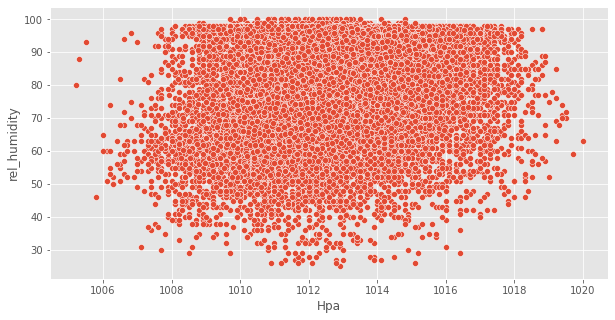

In [69]:
# scatter plot of atmospheric pressure by relative humidity
fig = plt.figure(figsize =(10, 5))
sns.scatterplot(data= imputed_df, x="Hpa", y="rel_humidity")

<AxesSubplot:xlabel='Hpa', ylabel='rel_humidity'>

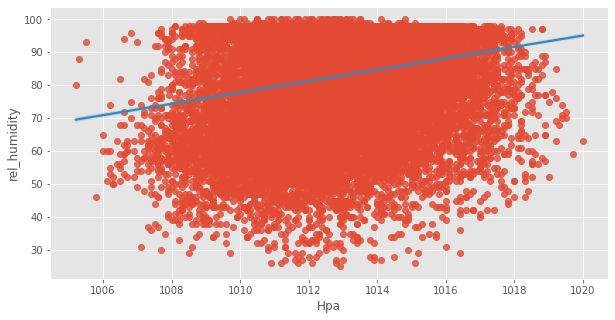

In [70]:
# regression plot of atmospheric pressure by relative humidity
fig = plt.figure(figsize =(10, 5))
sns.regplot(data= imputed_df, x="Hpa", y="rel_humidity", line_kws={"color": "C1"})

## Observation
This shows a slightly positive correlation between Relative humidity and Hpa for each of the year 2012 to 2014. That means the higher the relative humidity the higher the Hpa and vice versa.

In [71]:
# Hpa by wind speed
imputed_df['wind_speed'].groupby(imputed_df.Hpa).mean().sort_values()

Hpa
1013.68    0.34
1011.90    0.34
1012.36    0.36
1012.46    0.38
1010.22    0.38
           ... 
1009.82    1.84
1019.70    2.00
1019.30    2.00
1020.00    2.40
1010.68    3.68
Name: wind_speed, Length: 661, dtype: float64

<AxesSubplot:xlabel='Hpa', ylabel='wind_speed'>

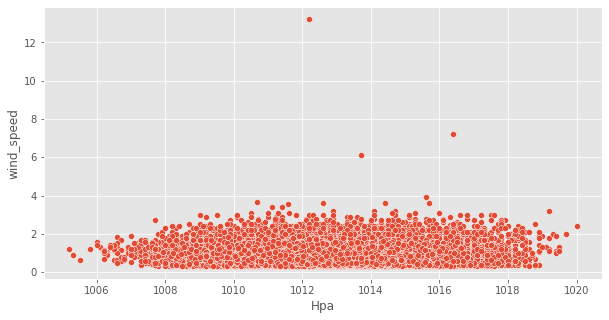

In [72]:
# scatter plot of atmospheric pressure by wind speed
fig = plt.figure(figsize =(10, 5))
sns.scatterplot(data= imputed_df, x="Hpa", y="wind_speed")

<AxesSubplot:xlabel='Hpa', ylabel='wind_speed'>

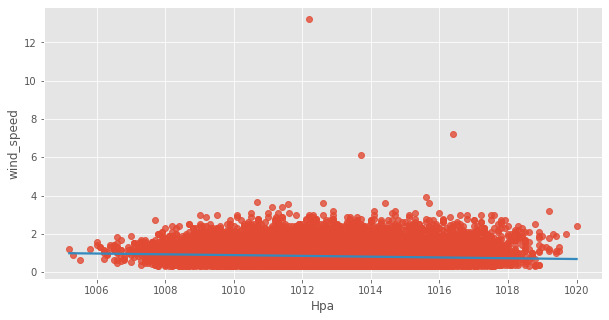

In [73]:
# regression plot of atmospheric pressure by wind speed
fig = plt.figure(figsize =(10, 5))
sns.regplot(data= imputed_df, x="Hpa", y="wind_speed", line_kws={"color": "C1"})

## Observation
This shows a slightly negative correlation between Wind speed and Hpa for each of the year 2012 to 2014. That means that the higher the wind speed the lower the Atmospheric pressure and vice versa.

In [74]:
# Average Temperature by year
temp_yr = imputed_df['Temp'].groupby(imputed_df.Year).mean()
temp_yr

Year
2012.0    26.169720
2013.0    26.550950
2014.0    26.774462
Name: Temp, dtype: float64

<AxesSubplot:xlabel='Year', ylabel='Temp'>

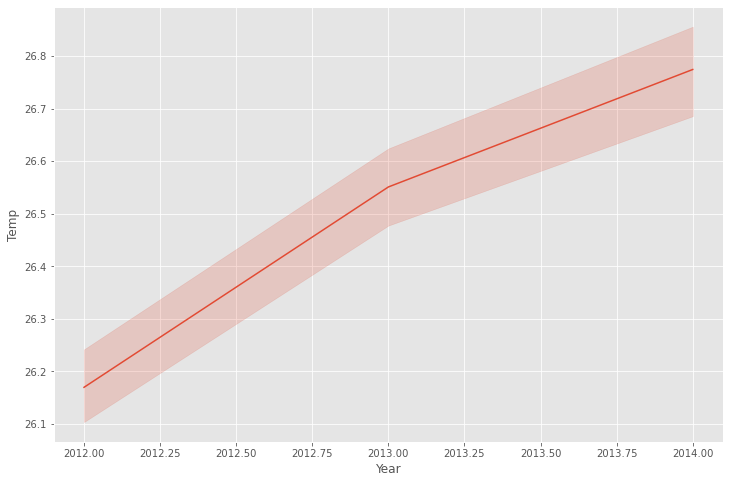

In [75]:
# visualizing Temperature by Year
sns.lineplot(data = imputed_df, x = "Year", y = "Temp")

## Observation
This shows an upward trend from 2012 to 2013 with a value of 26.55 degree celsius, and then a further increasing trend from 2013 to 2014 with a value of 26.75 degree celsius.

In [76]:
# average Temperature by Month
imputed_df['Temp'].groupby(imputed_df.Month).mean()

Month
1.0     25.690727
2.0     26.479774
3.0     27.276147
4.0     27.154778
5.0     27.238943
6.0     27.268125
7.0     26.537437
8.0     26.486322
9.0     25.901445
10.0    25.796984
11.0    26.167303
12.0    25.833045
Name: Temp, dtype: float64

<AxesSubplot:xlabel='Month', ylabel='Temp'>

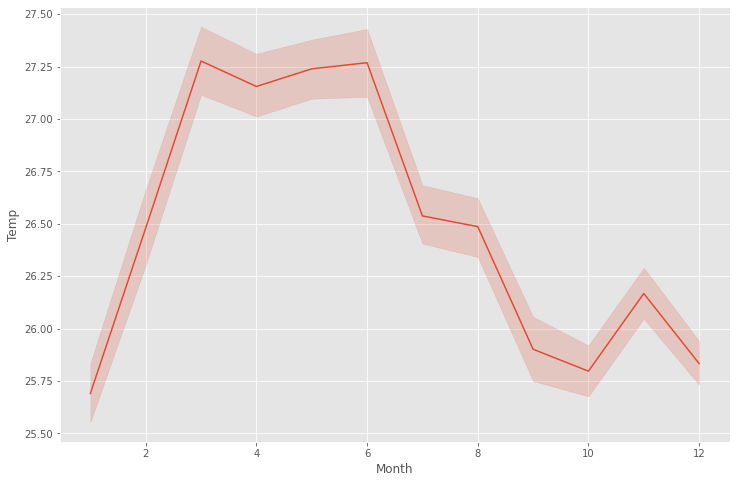

In [77]:
# Visualizing average Hpa by Month
sns.lineplot(data= imputed_df, x="Month", y="Temp")

## Observation
The month of January commenced an upward trend at avvalue of 25.55 degree celsius, then seen a downward trend from June with a value of 27.25 degrees celsius to 25.85 degrees celsius in October between 2012 and 2014.

In [78]:
# average Temp by Day
imputed_df['Temp'].groupby(imputed_df.Day).mean()

Day
1.0     26.317132
2.0     26.385483
3.0     26.397656
4.0     26.404869
5.0     26.428913
6.0     26.299773
7.0     26.506245
8.0     26.427799
9.0     26.469772
10.0    26.212025
11.0    26.601416
12.0    26.410985
13.0    26.558056
14.0    26.602574
15.0    26.659545
16.0    26.442066
17.0    26.381013
18.0    26.467326
19.0    26.651833
20.0    26.580348
21.0    26.519534
22.0    26.701716
23.0    26.785392
24.0    26.531084
25.0    26.549289
26.0    26.586748
27.0    26.645732
28.0    26.463437
29.0    26.330974
30.0    26.616875
31.0    26.410263
Name: Temp, dtype: float64

<AxesSubplot:xlabel='Day', ylabel='Temp'>

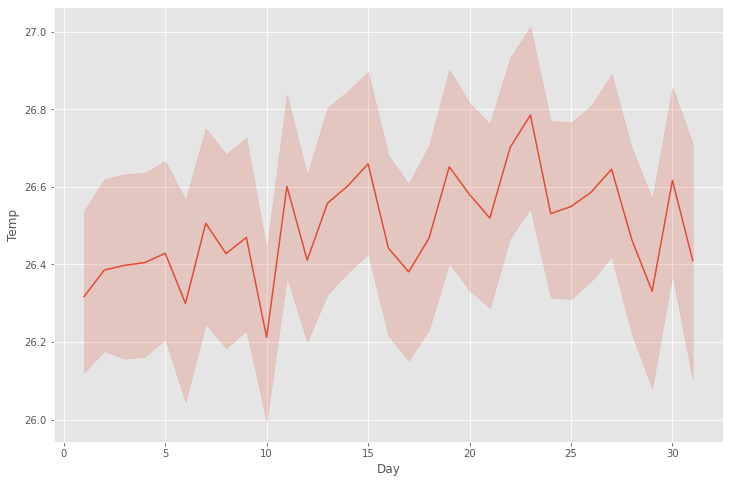

In [79]:
# Visualizing average Temp by Day
sns.lineplot(data= imputed_df, x="Day", y="Temp")

## Observation
This shows that the minimum temp is Day 10 at 26.22 degrees celsius while the maximum temperature 26.7 degrees celsius at Day 23.

In [80]:
# average Temperature by MST
imputed_df['Temp'].groupby(imputed_df['Hour']).mean()

Hour
1.0     23.969727
2.0     23.719727
3.0     23.562029
4.0     23.433105
5.0     23.338790
6.0     23.234654
7.0     23.161366
8.0     23.594888
9.0     25.232898
10.0    27.145273
11.0    28.999336
12.0    30.249708
13.0    30.990547
14.0    31.274224
15.0    31.234361
16.0    30.697615
17.0    29.961329
18.0    28.946628
19.0    27.527339
20.0    26.284223
21.0    25.529658
22.0    24.996947
23.0    24.584434
24.0    24.252615
Name: Temp, dtype: float64

<AxesSubplot:xlabel='Hour', ylabel='Temp'>

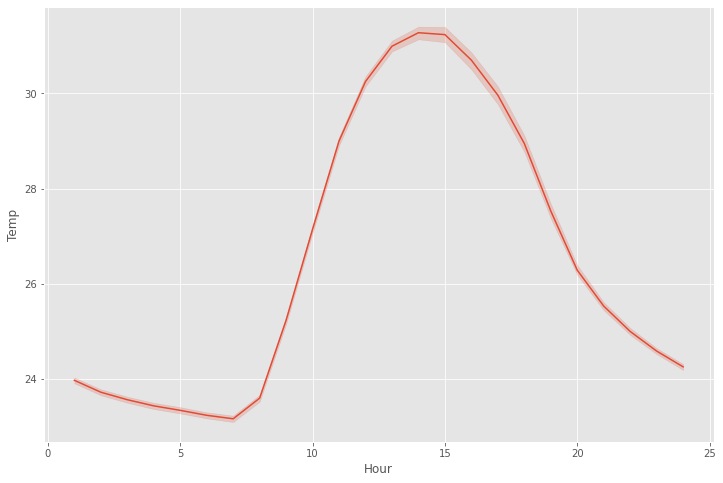

In [81]:
# Visualizing average Temperature by Hour
sns.lineplot(data= imputed_df, x= 'Hour', y="Temp")

## Observation
The minimum Hpa is 22 degrees celsius at 7:00hr while the maximum Hpa is 31.5 degree celsius at 13:00hr

In [82]:
# Pivot the dataframe to a wide-form representation:
df_wide3 = pd.pivot_table(imputed_df, index = "Year", columns = "Month", values = "Temp")
df_wide3.head()

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Year,,,,,,,,,,,,
2012.0,25.576532,26.590475,26.492876,26.656417,26.904032,26.506701,25.982715,26.404595,25.604695,25.841840,26.105112,25.570887
2013.0,26.063405,26.157857,27.509919,27.436111,27.377177,27.163750,26.432446,26.470027,26.173472,25.682527,26.261028,25.869812
2014.0,25.434247,26.687202,27.825645,27.371806,27.435618,27.580833,27.197151,26.586602,25.843704,25.924767,26.126977,26.068567


<AxesSubplot:xlabel='Year', ylabel='5.0'>

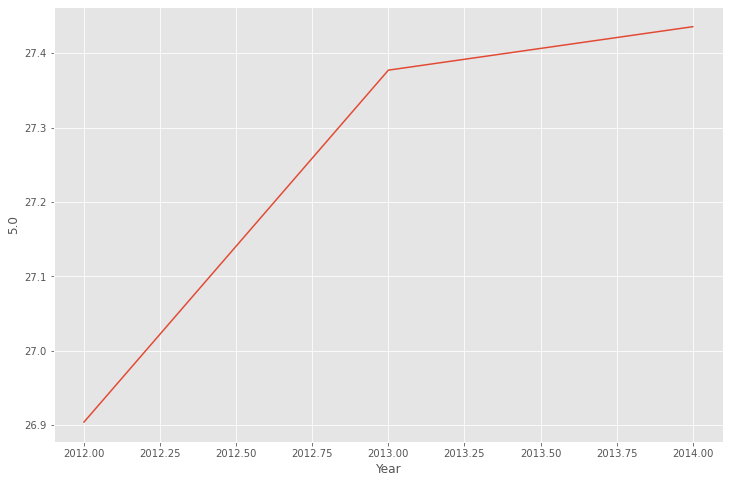

In [83]:
# checking the trend in May
sns.lineplot(data=df_wide3[5]) # 5 ==> May

In [84]:
# Pivot the dataframe to a wide-form representation:
df_wide4 = pd.pivot_table(imputed_df, index = "Month", columns = "Year", values = "Temp")
df_wide4

Year,2012.0,2013.0,2014.0
Month,,,
1.0,25.576532,26.063405,25.434247
2.0,26.590475,26.157857,26.687202
3.0,26.492876,27.509919,27.825645
4.0,26.656417,27.436111,27.371806
5.0,26.904032,27.377177,27.435618
6.0,26.506701,27.163750,27.580833
7.0,25.982715,26.432446,27.197151
8.0,26.404595,26.470027,26.586602
9.0,25.604695,26.173472,25.843704


<AxesSubplot:xlabel='Month'>

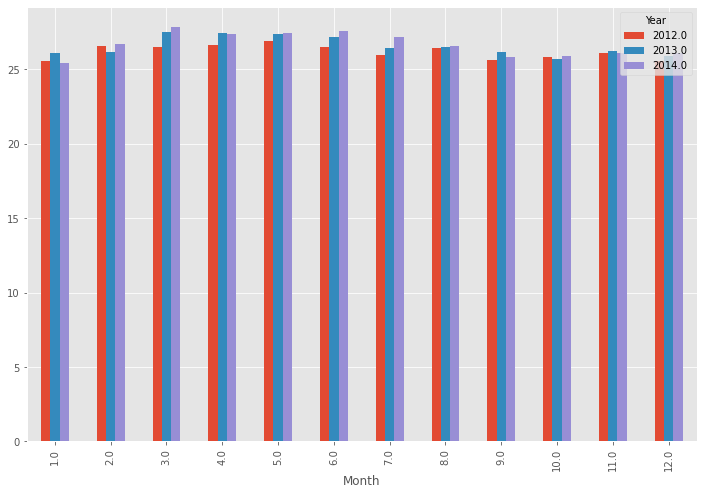

In [85]:
df_wide4.plot.bar()

<AxesSubplot:xlabel='Month'>

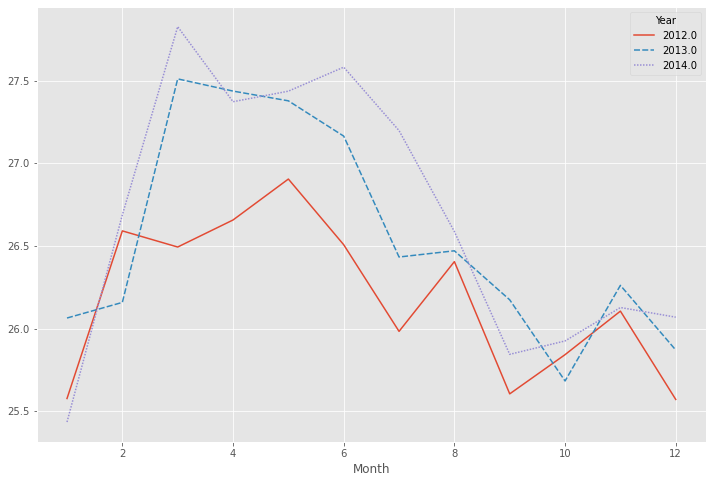

In [86]:
# plots a separate line for each month:
sns.lineplot(data=df_wide4, legend='auto')

## Observation
The Temp trend line for the year 2014 has the highest Temp of 27.85 degrees celsius in the month of March while it lowest Temp of 25.5 degree celsius in the month of October compared to the Temp trend line for 2012 and 2013.

In [87]:
# Pivot the dataframe to a wide-form representation:
df_wide5 = pd.pivot_table(imputed_df, index = "Day", columns = "Month", values = "Temp")
df_wide5

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Day,,,,,,,,,,,,
1.0,25.002778,25.993239,27.161111,27.419444,27.395833,26.676389,26.282500,25.815833,25.966667,25.320930,26.557377,25.844444
2.0,25.818056,25.294444,26.852778,27.537500,27.423333,26.240278,26.454167,25.831389,26.413611,26.493750,26.500000,25.804167
3.0,25.478824,25.707778,26.581944,26.694444,26.763333,27.068056,26.197778,26.672500,26.715000,26.641667,26.619444,25.661389
4.0,25.950000,25.619444,26.666389,27.228056,26.974167,26.640278,25.599167,27.180286,26.641944,25.954167,26.809722,25.466111
5.0,26.467222,26.408333,26.391667,26.880556,27.139722,27.176667,26.591111,27.015833,25.279000,24.756250,26.501667,25.789722
6.0,25.968056,26.543056,25.712778,26.808611,27.171944,27.563265,26.962222,25.816389,25.083333,25.289583,26.255000,26.084444
7.0,25.863889,26.518056,26.811111,27.355278,26.847500,28.893750,26.999444,25.670833,26.270833,24.139583,26.077778,26.570545
8.0,25.175000,26.712500,27.122222,27.273333,26.955000,29.002083,25.969167,25.969444,25.037500,25.879583,25.787778,26.470877
9.0,24.784722,26.677778,26.693889,26.801944,27.762778,27.170833,26.426944,26.254286,26.181250,26.250000,26.437500,26.253611


<AxesSubplot:xlabel='Day'>

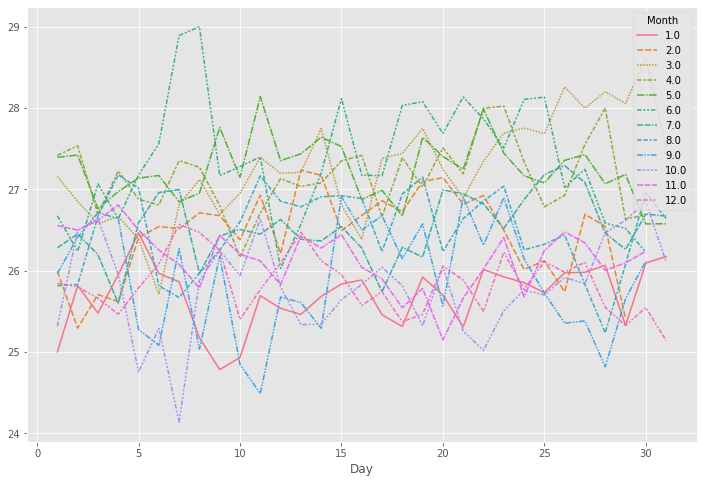

In [88]:
# plots a separate line for each month:
sns.lineplot(data=df_wide5, legend='auto')

### Observation
- The wind speed experience the lowest in the month of October(month number 10) with a point of about 24.18 degree celcius at Day 3 and the highest in the month of June(month number 6) with a point of 29 degree celcius at Day 6 compared to every other days of the months.

In [89]:
# Temp by relative humidity
round(imputed_df['rel_humidity'].groupby(imputed_df.Temp).mean().sort_values(), 2)

Temp
36.80    25.00
36.70    26.50
36.50    27.67
36.90    29.00
36.40    29.67
         ...  
16.80    98.00
16.20    98.00
15.90    98.00
22.38    98.00
15.30    98.00
Name: rel_humidity, Length: 942, dtype: float64

<AxesSubplot:xlabel='rel_humidity', ylabel='Temp'>

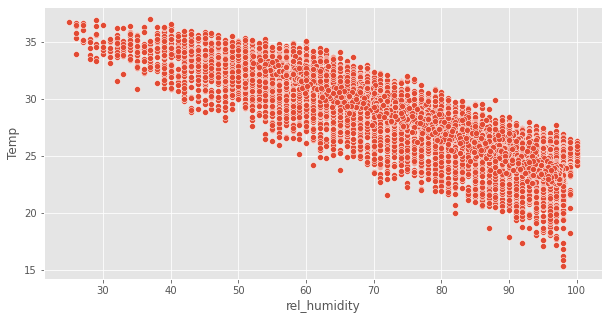

In [90]:
# scatter plot of relative humidity by temperature
fig = plt.figure(figsize =(10, 5))
sns.scatterplot(data= imputed_df, x="rel_humidity", y="Temp")

<AxesSubplot:xlabel='rel_humidity', ylabel='Temp'>

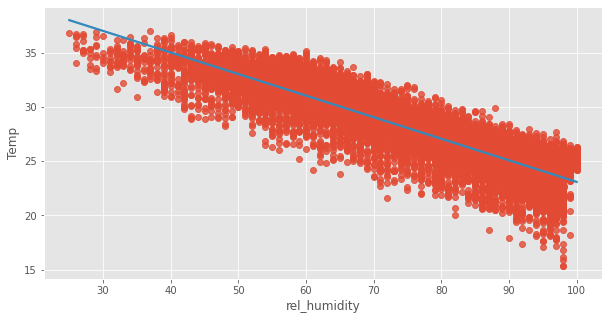

In [91]:
# regression plot of relative humidity by temperature
fig = plt.figure(figsize =(10, 5))
sns.regplot(data= imputed_df, x="rel_humidity", y="Temp", line_kws={"color": "C1"})

## Observation
There is a strong negative correlation between Temp and Relative humidity, which means that the higher the Temp the lower the Relative humidity and vice versa.

In [92]:
# Temp by wind speed
round(imputed_df['wind_speed'].groupby(imputed_df.Temp).mean().sort_values(), 2)

Temp
23.30    0.30
17.10    0.30
17.70    0.30
24.18    0.30
17.90    0.35
         ... 
36.10    2.10
36.70    2.20
36.60    2.50
36.80    2.80
31.74    2.90
Name: wind_speed, Length: 942, dtype: float64

<AxesSubplot:xlabel='wind_speed', ylabel='Temp'>

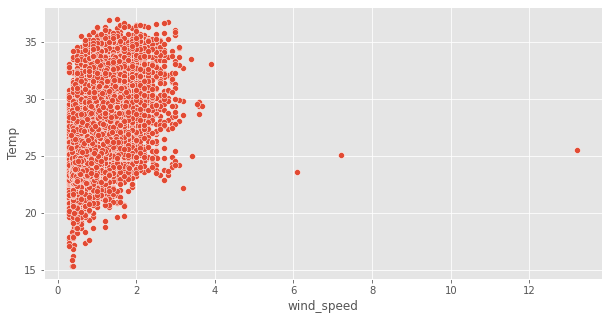

In [93]:
# scatter plot of wind speed by temperature
fig = plt.figure(figsize =(10, 5))
sns.scatterplot(data= imputed_df, x="wind_speed", y="Temp")

<AxesSubplot:xlabel='wind_speed', ylabel='Temp'>

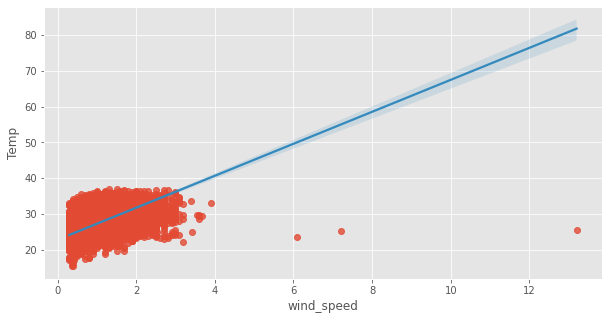

In [94]:
# scatter plot of wind speed by temperature
fig = plt.figure(figsize =(10, 5))
sns.regplot(data= imputed_df, x="wind_speed", y="Temp", line_kws={"color": "C1"})

## Observation
There is a strong positive correlation between Temp and Wind speed, which means that the higher the Temp the higher the Wind speed and vice versa.

In [95]:
# Average relative humidity by year
rel_hum_yr = round(imputed_df['rel_humidity'].groupby(imputed_df.Year).mean(), 2)
rel_hum_yr

Year
2012.0    83.91
2013.0    83.49
2014.0    81.00
Name: rel_humidity, dtype: float64

<AxesSubplot:xlabel='Year', ylabel='rel_humidity'>

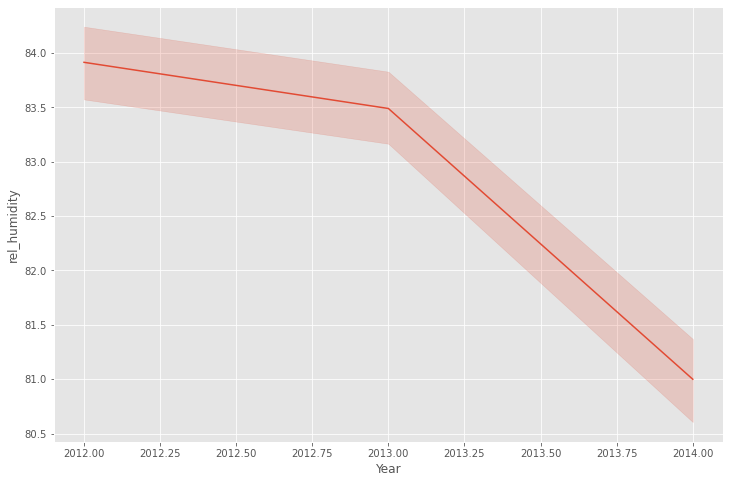

In [96]:
# visualizing Relative humidity by Year
sns.lineplot(data = imputed_df, x = "Year", y = "rel_humidity")

## Observation
The average Relative humidity experienced a steady downward trend from 2012 to 2014 at 83.9% to 81% respectively with a variance of 3.9%.

In [97]:
# Average relative humidity by Month
rel_hum_mth = round(imputed_df['rel_humidity'].groupby(imputed_df.Month).mean(), 2)
rel_hum_mth

Month
1.0     79.00
2.0     75.44
3.0     76.15
4.0     83.78
5.0     84.65
6.0     84.44
7.0     84.20
8.0     83.89
9.0     86.54
10.0    87.17
11.0    86.31
12.0    84.60
Name: rel_humidity, dtype: float64

<AxesSubplot:xlabel='Month', ylabel='rel_humidity'>

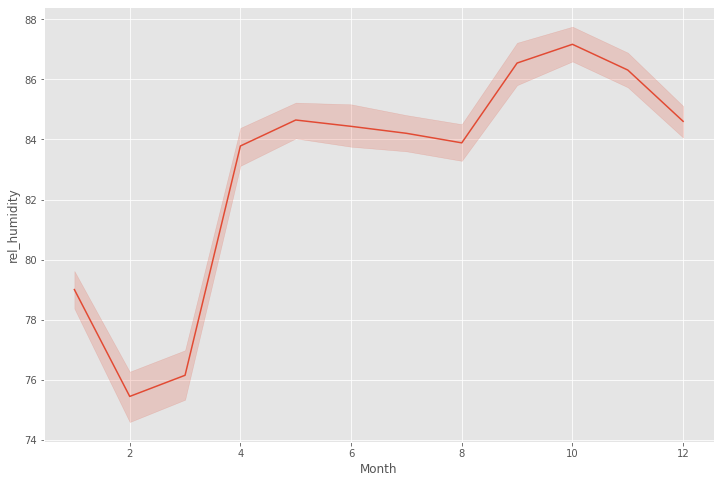

In [98]:
# visualizing Relative humidity by Month
sns.lineplot(data = imputed_df, x = "Month", y = "rel_humidity")

## Observation
The monthly average Relative humidity had its minimum based on the line trend at 75.6% in the month of February and its maximum at 87.1% in the month of October respectively with a variance of 11.5%.

In [99]:
# average Relative humidity by Day
round(imputed_df['rel_humidity'].groupby(imputed_df.Day).mean(), 2)

Day
1.0     83.94
2.0     83.78
3.0     83.89
4.0     83.15
5.0     83.01
6.0     82.82
7.0     82.47
8.0     83.06
9.0     82.47
10.0    83.84
11.0    82.30
12.0    83.53
13.0    82.53
14.0    82.78
15.0    82.89
16.0    83.65
17.0    83.60
18.0    83.32
19.0    81.66
20.0    81.69
21.0    82.31
22.0    82.01
23.0    81.55
24.0    82.65
25.0    82.37
26.0    82.47
27.0    82.14
28.0    82.62
29.0    83.91
30.0    82.96
31.0    82.76
Name: rel_humidity, dtype: float64

<AxesSubplot:xlabel='Day', ylabel='rel_humidity'>

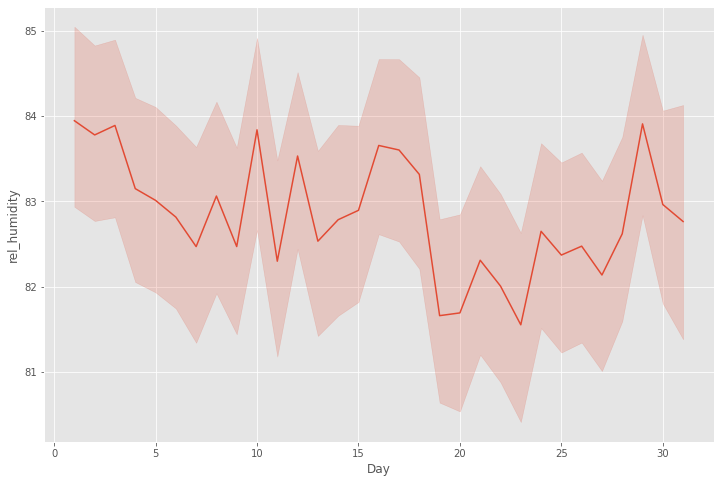

In [100]:
# Visualizing average relative humidity by Day
sns.lineplot(data= imputed_df, x="Day", y="rel_humidity")

## Observation
The daily average Relative humidity had its minimum based on the line trend at 81.6% in Day 23 and its maximum at 83.9% in Day 28 respectively with a variance of 2.3% between 2012 and 2014.

In [101]:
# average relative humidity by MST
imputed_df['rel_humidity'].groupby(imputed_df['Hour']).mean()

Hour
1.0     94.848148
2.0     95.501071
3.0     95.792195
4.0     95.951562
5.0     96.009561
6.0     96.066732
7.0     96.068683
8.0     94.930146
9.0     87.514537
10.0    78.480078
11.0    70.516211
12.0    65.280897
13.0    62.328320
14.0    61.637659
15.0    61.905756
16.0    64.399609
17.0    67.667644
18.0    72.283871
19.0    79.148141
20.0    85.256305
21.0    88.827175
22.0    91.082975
23.0    92.758789
24.0    93.943976
Name: rel_humidity, dtype: float64

<AxesSubplot:xlabel='Hour', ylabel='rel_humidity'>

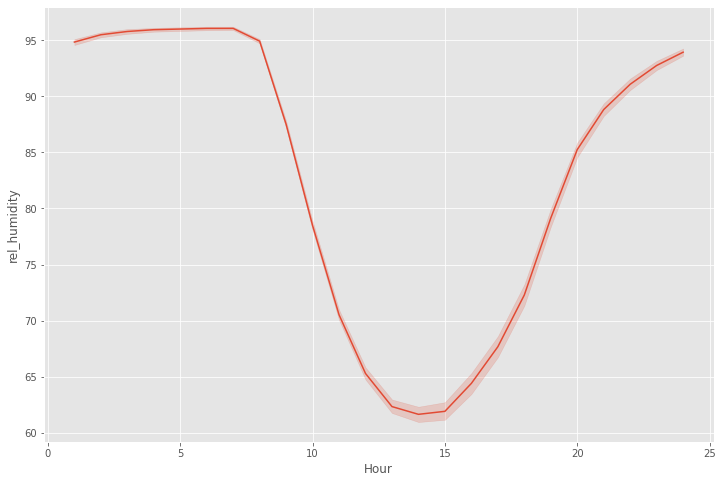

In [102]:
# Visualizing average relative humidity by Hour
sns.lineplot(data= imputed_df, x= 'Hour', y="rel_humidity")

## Observation
The hourly average Relative humidity had its minimum of 62.3% based on the line trend  at 14:00hr and its maximum of 96.8% at 3:00hr respectively with a variance of 34.5% between 2012 and 2014.

In [103]:
# Pivot the dataframe to a wide-form representation:
df_wide6 = pd.pivot_table(imputed_df, index = "Year", columns = "Month", values = "rel_humidity")
df_wide6.head()

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Year,,,,,,,,,,,,
2012.0,82.313710,78.355396,82.309140,84.085278,84.348118,84.860914,84.437097,82.979730,86.676056,85.861434,85.904153,85.876613
2013.0,79.078649,78.910119,76.818817,85.098611,85.531989,84.236111,84.431989,84.465054,86.224167,88.243280,85.661667,82.932258
2014.0,75.612903,68.968750,69.318011,82.163889,84.060484,84.519444,83.743548,84.218508,87.881481,87.570516,87.329661,85.018258


<AxesSubplot:xlabel='Year', ylabel='5.0'>

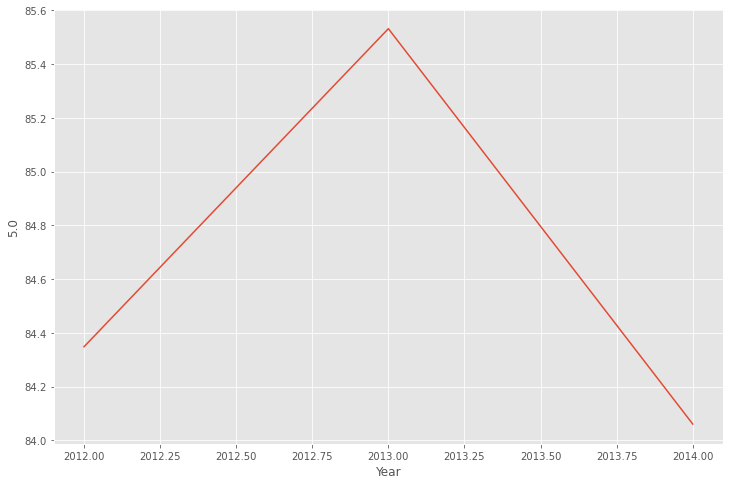

In [104]:
# checking the trend in May
sns.lineplot(data=df_wide6[5]) # 5 ==> May

## Observation
The Relative humidity had its maximum value of 85.52% based on the line trend in the year 2013 and its minimum value of 84.09% in the year 2014 respectively with a variance of 0.43%.

<AxesSubplot:xlabel='Year'>

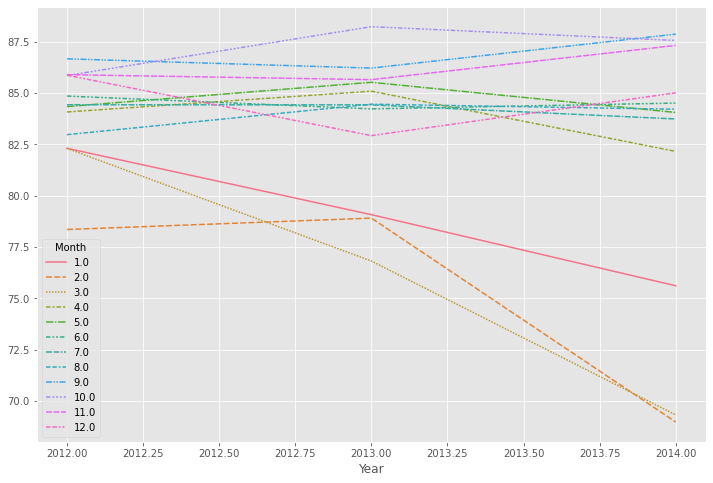

In [105]:
# plots a separate line for each month:
sns.lineplot(data=df_wide6, legend='auto')

## Observation
The month of October between 2012 and 2014 has the greatest value for Relative humidity with a value of 89.1% in the year 2013 and its lowest based on the line trend in the month of February with a value of 71% in the year 2014. 

In [106]:
# Pivot the dataframe to a wide-form representation:
df_wide7 = pd.pivot_table(imputed_df, index = "Month", columns = "Year", values = "rel_humidity")
df_wide7

Year,2012.0,2013.0,2014.0
Month,,,
1.0,82.313710,79.078649,75.612903
2.0,78.355396,78.910119,68.968750
3.0,82.309140,76.818817,69.318011
4.0,84.085278,85.098611,82.163889
5.0,84.348118,85.531989,84.060484
6.0,84.860914,84.236111,84.519444
7.0,84.437097,84.431989,83.743548
8.0,82.979730,84.465054,84.218508
9.0,86.676056,86.224167,87.881481


<AxesSubplot:xlabel='Month'>

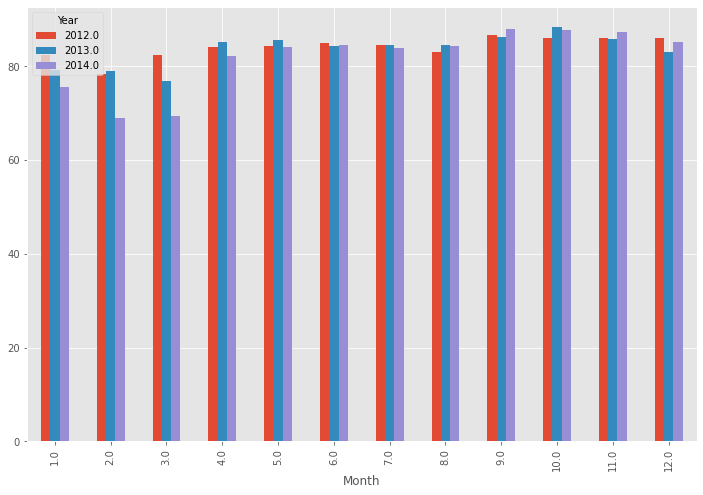

In [107]:
df_wide7.plot.bar()

<AxesSubplot:xlabel='Month'>

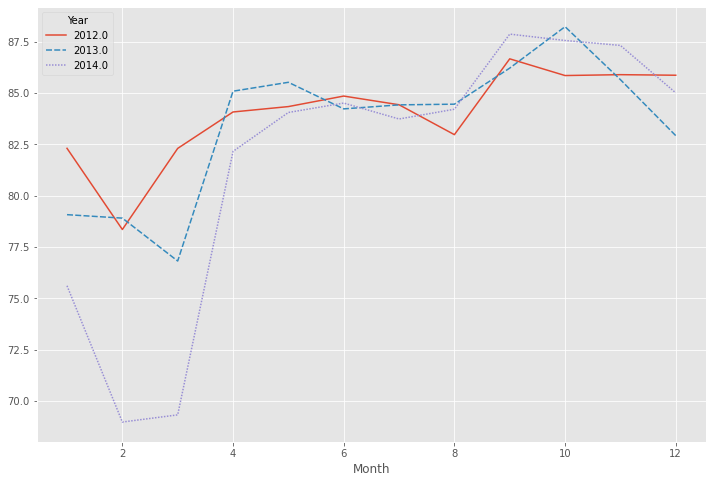

In [108]:
# plots a separate line for each month:
sns.lineplot(data=df_wide7, legend='auto')

## Observation
The month of October between 2012 and 2014 has the greatest value for Relative humidity with a value of 89.1% in the year 2013 and its lowest based on the line trend in the month of February with a value of 71% in the year 2014. 

In [109]:
# Pivot the dataframe to a wide-form representation:
df_wide8 = pd.pivot_table(imputed_df, index = "Day", columns = "Month", values = "rel_humidity")
df_wide8

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Day,,,,,,,,,,,,
1.0,86.652778,73.109859,76.777778,81.013889,84.986111,87.236111,86.069444,85.866667,86.358333,91.116279,82.498361,88.166667
2.0,85.305556,76.166667,77.916667,79.986111,85.122222,88.333333,84.416667,85.338889,85.908333,84.916667,83.929577,88.375000
3.0,85.788235,77.077778,81.180556,84.902778,86.211111,83.750000,84.088889,83.108333,84.050000,84.333333,84.416667,88.013889
4.0,81.152778,74.791667,75.633333,81.991667,85.783333,87.111111,87.741667,81.365714,84.247222,86.458333,83.694444,88.866667
5.0,77.713889,73.152778,74.416667,85.347222,86.608333,84.813889,84.755556,82.730556,89.876667,89.500000,84.072222,86.452778
6.0,78.291667,74.536111,77.263889,85.436111,85.363889,83.102041,84.016667,86.269444,89.187500,87.604167,84.722222,81.802778
7.0,79.375000,75.750000,76.138889,80.580556,85.497222,78.875000,85.505556,87.333333,83.333333,93.979167,85.833333,79.705455
8.0,83.402778,77.013889,74.763889,79.963889,85.755556,80.041667,86.425000,86.380556,91.270833,84.766667,88.372222,80.308772
9.0,86.250000,74.125000,74.216667,82.744444,82.869444,87.104167,84.516667,85.094286,83.208333,83.041667,86.180556,82.341667


<AxesSubplot:xlabel='Day'>

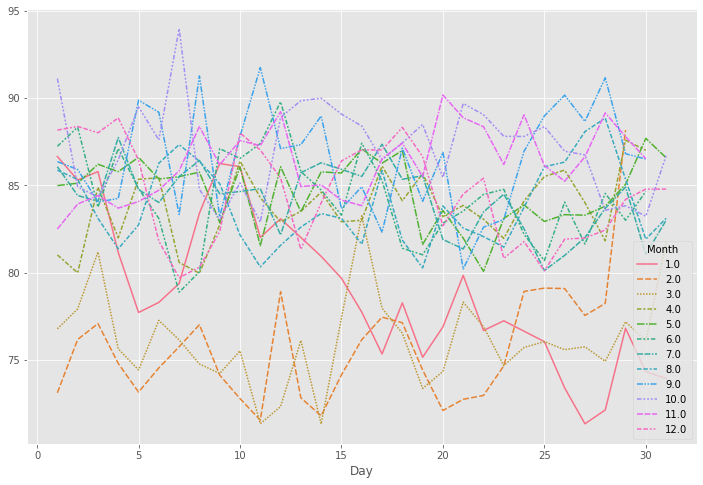

In [110]:
# plots a separate line for each month:
sns.lineplot(data=df_wide8, legend='auto')

### Observation
- The relative humidity experienced the lowest in the month of January, February and March respectively(month number 1, 2 & 3) with a point of about 30% in the Day 12, 14 and 27 respectively and the highest in the month of October(month number 10) with a point of about 93% compared to every other month.

<AxesSubplot:xlabel='wind_speed', ylabel='rel_humidity'>

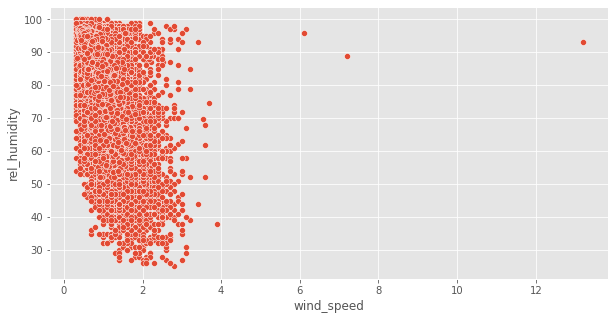

In [111]:
# scatter plot of wind speed by relative humidity
fig = plt.figure(figsize =(10, 5))
sns.scatterplot(data= imputed_df, x="wind_speed", y="rel_humidity")

<AxesSubplot:xlabel='wind_speed', ylabel='rel_humidity'>

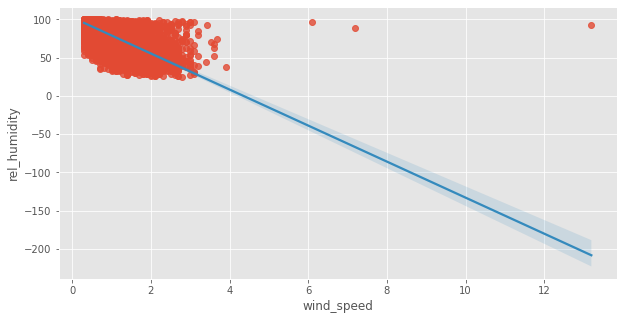

In [112]:
# scatter plot of wind speed by relative humidity
fig = plt.figure(figsize =(10, 5))
sns.regplot(data= imputed_df, x="wind_speed", y="rel_humidity", line_kws={"color": "C1"})

## Observation
There is a strong negative correlation between Relative humidity and Wind speed, which means that as Relative humidity increases the Wind speed decreases and vice versa.

In [113]:
# Average wind speed by year
win_speed_yr = round(imputed_df['wind_speed'].groupby(imputed_df.Year).mean(), 2)
win_speed_yr

Year
2012.0    0.80
2013.0    0.81
2014.0    0.89
Name: wind_speed, dtype: float64

<AxesSubplot:xlabel='Year', ylabel='wind_speed'>

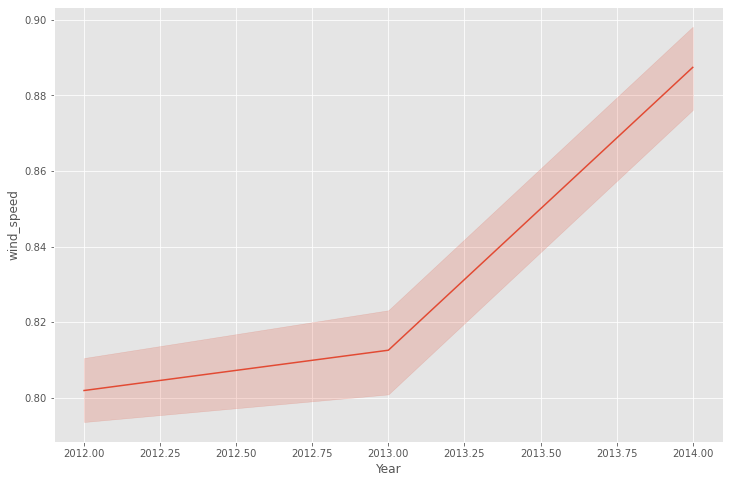

In [114]:
# visualizing wind speed by Year
sns.lineplot(data = imputed_df, x = "Year", y = "wind_speed")

## Observation
The wind speed had a steady upward trend from 0.805m/s in the year 2012 to a value of 0.884m/s in 2014.

In [115]:
# Average wind speed by Month
win_spd_mth = round(imputed_df['wind_speed'].groupby(imputed_df.Month).mean(), 2)
win_spd_mth

Month
1.0     0.98
2.0     0.99
3.0     0.95
4.0     0.80
5.0     0.77
6.0     0.73
7.0     0.71
8.0     0.76
9.0     0.76
10.0    0.80
11.0    0.79
12.0    0.90
Name: wind_speed, dtype: float64

<AxesSubplot:xlabel='Month', ylabel='wind_speed'>

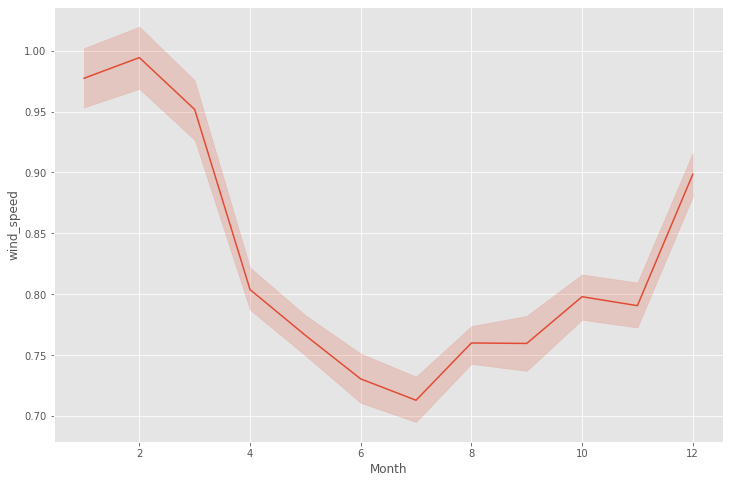

In [116]:
# visualizing wind speed by Month
sns.lineplot(data = imputed_df, x = "Month", y = "wind_speed")

## Observation
The month of October between the year 2012 and 2014 has the greatest value for Wind speed with a value of 0.9m/s in the month of February while its lowest based on the line trend was in the month of July with a value of 0.72m/s. 

In [117]:
# average wind speed by Day
round(imputed_df['wind_speed'].groupby(imputed_df.Day).mean(), 2)

Day
1.0     0.83
2.0     0.82
3.0     0.80
4.0     0.87
5.0     0.86
6.0     0.85
7.0     0.80
8.0     0.80
9.0     0.84
10.0    0.85
11.0    0.88
12.0    0.81
13.0    0.83
14.0    0.82
15.0    0.81
16.0    0.81
17.0    0.80
18.0    0.83
19.0    0.84
20.0    0.86
21.0    0.85
22.0    0.83
23.0    0.81
24.0    0.80
25.0    0.82
26.0    0.85
27.0    0.85
28.0    0.85
29.0    0.83
30.0    0.85
31.0    0.87
Name: wind_speed, dtype: float64

<AxesSubplot:xlabel='Day', ylabel='wind_speed'>

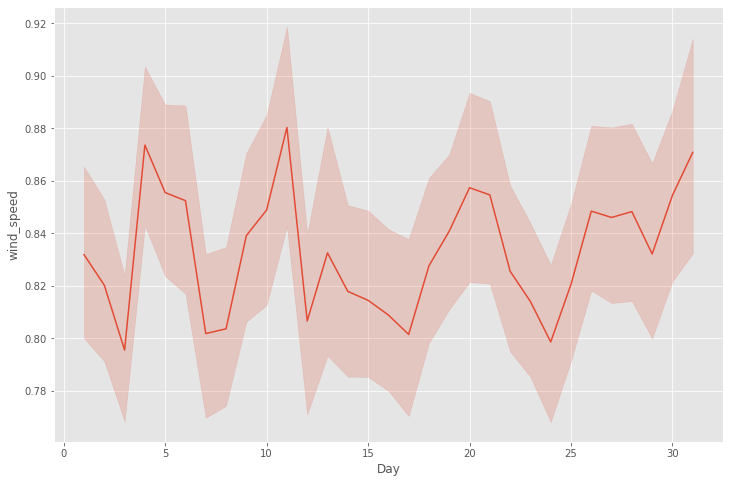

In [118]:
# Visualizing average wind speed by Day
sns.lineplot(data= imputed_df, x="Day", y="wind_speed")

## Observation
The Day 3 has the minimum average wind speed with a value of 0.788m/s and a maximum with a value of 0.88m/s on Day 12 from 2012 to 2014.

In [119]:
# average wind speed by Hour
imputed_df['wind_speed'].groupby(imputed_df['Hour']).mean()

Hour
1.0     0.510195
2.0     0.513009
3.0     0.510420
4.0     0.513906
5.0     0.534107
6.0     0.537541
7.0     0.533561
8.0     0.602693
9.0     0.897776
10.0    1.009629
11.0    1.145781
12.0    1.286452
13.0    1.378223
14.0    1.355415
15.0    1.357580
16.0    1.284516
17.0    1.190205
18.0    1.035288
19.0    0.826849
20.0    0.702424
21.0    0.623245
22.0    0.563464
23.0    0.539102
24.0    0.532262
Name: wind_speed, dtype: float64

<AxesSubplot:xlabel='Hour', ylabel='wind_speed'>

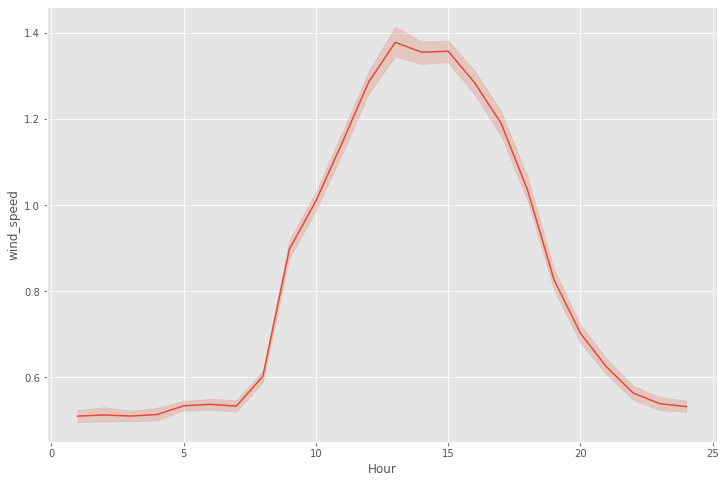

In [120]:
# Visualizing average relative humidity by Hour
sns.lineplot(data= imputed_df, x= 'Hour', y="wind_speed")

## Observation
The maximum average value of wind speed is 1.37m/s at the hour of 13:00hr and its minimum average value of wind speed is 0.35m/s at the hour of 1:00hr

In [121]:
# Pivot the dataframe to a wide-form representation:
df_wide9 = pd.pivot_table(imputed_df, index = "Year", columns = "Month", values = "wind_speed")
df_wide9.head()

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Year,,,,,,,,,,,,
2012.0,0.878656,0.933496,0.809301,0.76000,0.745215,0.739391,0.714892,0.761784,0.753427,0.816752,0.806262,0.858360
2013.0,0.917297,0.966756,0.860054,0.83075,0.731075,0.726833,0.696505,0.755672,0.760472,0.779839,0.779889,0.955914
2014.0,1.135618,1.084673,1.185726,0.82100,0.822849,0.732000,0.727930,0.762956,0.791852,0.797445,0.787994,0.880253


<AxesSubplot:xlabel='Year', ylabel='5.0'>

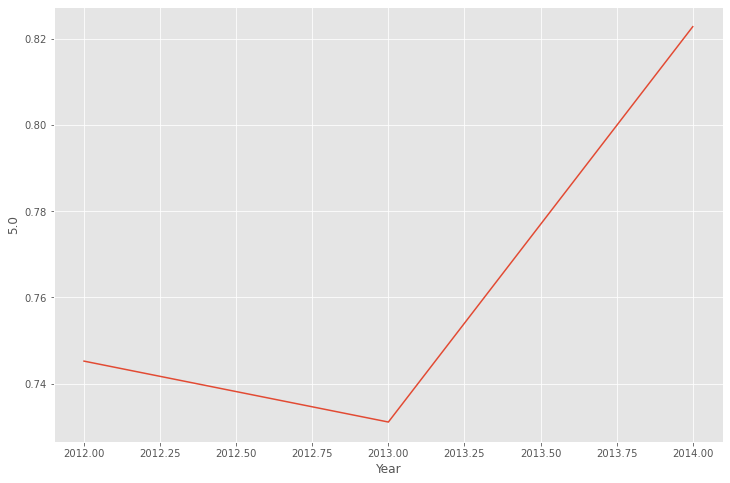

In [122]:
# checking the trend in May
sns.lineplot(data=df_wide9[5]) # 5 ==> May

## Observation
The wind speed for the month of May experienced it minimum in 2013 with a value of 0.72m/s and its maximum in 2014 with a value of 0.824m/s

<AxesSubplot:xlabel='Year'>

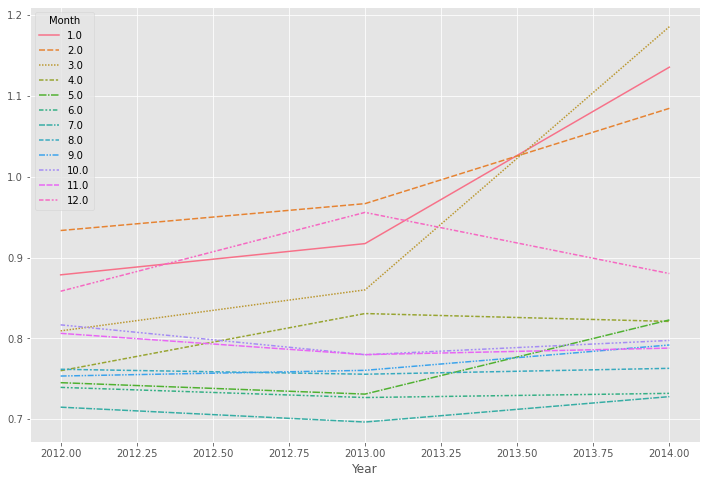

In [123]:
# plots a separate line for each month:
sns.lineplot(data=df_wide9, legend='auto')

### Observation
- The wind speed experience the lowest in the month of May(month number 5) with a point of 0.68m/s in the year 2013 and the highest in the month of March(month number 3) with a point of 1.19m/s compared to every other years.

In [124]:
# Pivot the dataframe to a wide-form representation:
df_wide10 = pd.pivot_table(imputed_df, index = "Month", columns = "Year", values = "wind_speed")
df_wide10

Year,2012.0,2013.0,2014.0
Month,,,
1.0,0.878656,0.917297,1.135618
2.0,0.933496,0.966756,1.084673
3.0,0.809301,0.860054,1.185726
4.0,0.760000,0.830750,0.821000
5.0,0.745215,0.731075,0.822849
6.0,0.739391,0.726833,0.732000
7.0,0.714892,0.696505,0.727930
8.0,0.761784,0.755672,0.762956
9.0,0.753427,0.760472,0.791852


<AxesSubplot:xlabel='Month'>

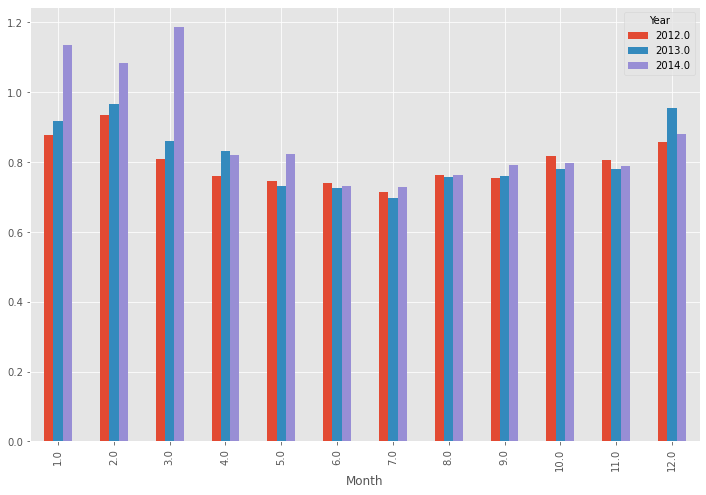

In [125]:
df_wide10.plot.bar()

<AxesSubplot:xlabel='Month'>

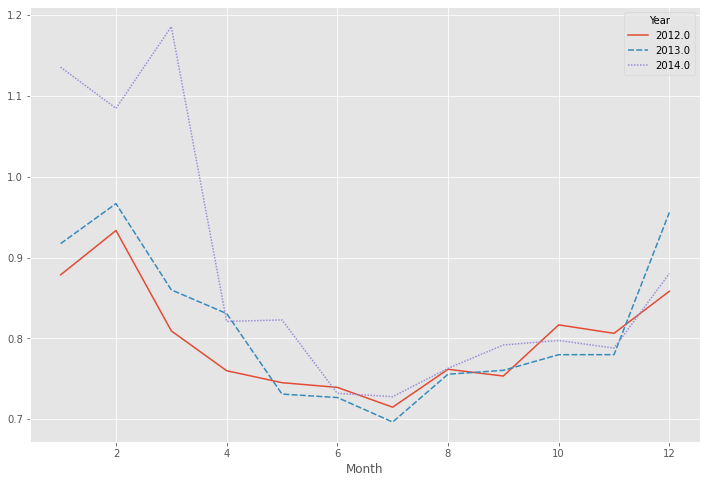

In [126]:
# plots a separate line for each month:
sns.lineplot(data=df_wide10, legend='auto')

### Observation
- The wind speed experience the lowest in the month of July(month number 7) with a point of 0.5m/s in the year 2012 and the highest in the month of February(month number 2) with a point of 0.9m/s compared to every other month for 2012.

- The wind speed experience the lowest in the month of July(month number 7) with a point of 0.7m/s in the year 2013 and the highest in the month of February(month number 2) with a point of 0.95m/s compared to every other month for 2013.

- The wind speed experience the lowest in the month of July(month number 7) with a point of 0.7m/s in the year 2014 and the highest in the month of March(month number 3) with a point of 1.19m/s compared to every other month for 2014.

In [127]:
# Pivot the dataframe to a wide-form representation:
df_wide11 = pd.pivot_table(imputed_df, index = "Day", columns = "Month", values = "wind_speed")
df_wide11

Month,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
Day,,,,,,,,,,,,
1.0,0.977778,1.156056,0.939722,0.836944,0.718333,0.743056,0.703056,0.760000,0.858889,0.612558,0.909836,0.694444
2.0,0.819167,0.924167,0.867222,0.818056,0.833611,0.781944,0.812500,0.853333,0.708611,0.770000,0.864507,0.773611
3.0,0.752059,0.836667,0.786667,0.780278,0.752500,0.775833,0.815000,0.826944,0.791944,0.763333,0.815833,0.835556
4.0,0.917500,0.967500,0.946667,0.806944,0.779444,0.753889,0.788333,0.902286,0.900556,0.858333,0.858611,0.999444
5.0,0.852222,0.984167,1.005556,0.814167,0.787500,0.705278,0.728056,0.926944,0.900000,0.865833,0.851389,0.856111
6.0,0.983333,1.011389,0.927778,0.818889,0.837222,0.716735,0.662222,0.876111,0.901667,0.880833,0.740278,0.855556
7.0,0.893056,0.952500,0.965278,0.820833,0.745278,0.772917,0.691667,0.699444,0.782083,0.695417,0.654444,0.926182
8.0,0.739444,0.901667,1.032222,0.833889,0.783889,0.812083,0.715833,0.649722,0.685000,0.768750,0.766667,0.932632
9.0,0.743333,1.055278,0.984167,0.842778,0.842222,0.824583,0.760000,0.749429,0.834167,0.795833,0.724722,0.889444


<AxesSubplot:xlabel='Day'>

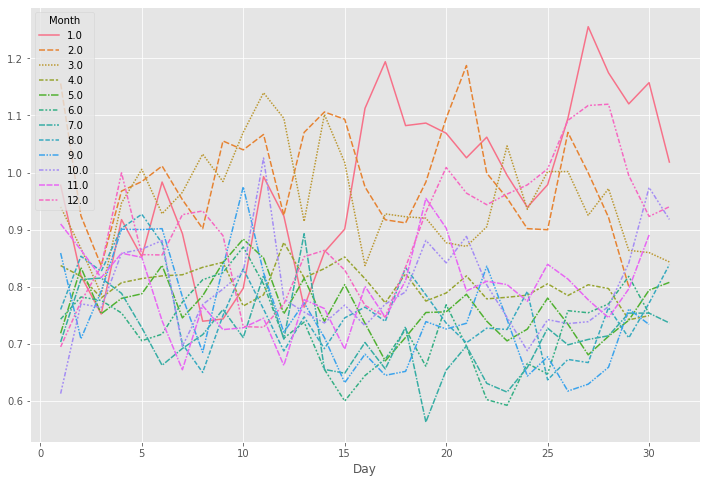

In [128]:
# plots a separate line for each month:
sns.lineplot(data=df_wide11, legend='auto')

### Observation
- The wind speed experience the lowest in the month of September(month number 9) with a point of 0.4m/s at Day 18 and the highest in the month of January(month number 1) with a point of 1.27m/s at Day 27 compared to every other Days and month of the year.

## Seasonal Variation of the Parameters: Hpa, Temp, Rel_Humidity and Wind Speed

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Create datetime column from Year, Month, Day, and Hour columns
df['datetime'] = pd.to_datetime(df[['Year', 'Month', 'Day', 'Hour']])

# Set datetime column as index
df.set_index('datetime', inplace=True)

### Date seasonal variation for the parameters

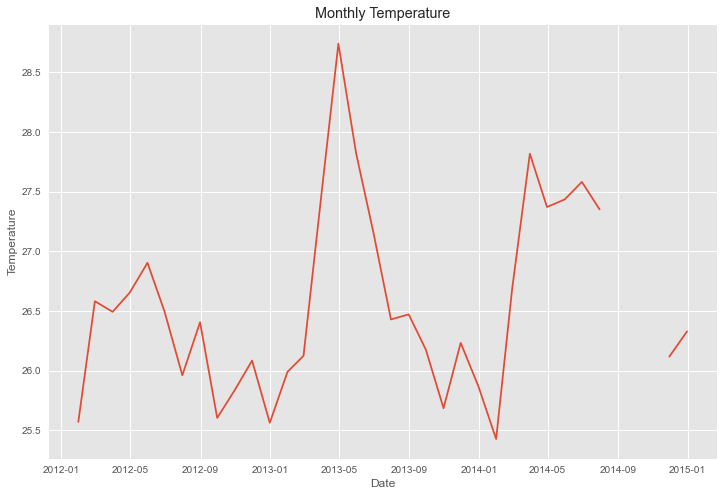

In [521]:
## Monthly seasonal variation for Temp
# Resample data to monthly frequency
monthly_data = df['Temp'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Monthly Temperature')
plt.show()


## Observation
The Temperature seasonal trend has its maximum point of 28.8 degrees celsius in May 2013 and its minimum point of 25.4 degrees celsius in February 2014.

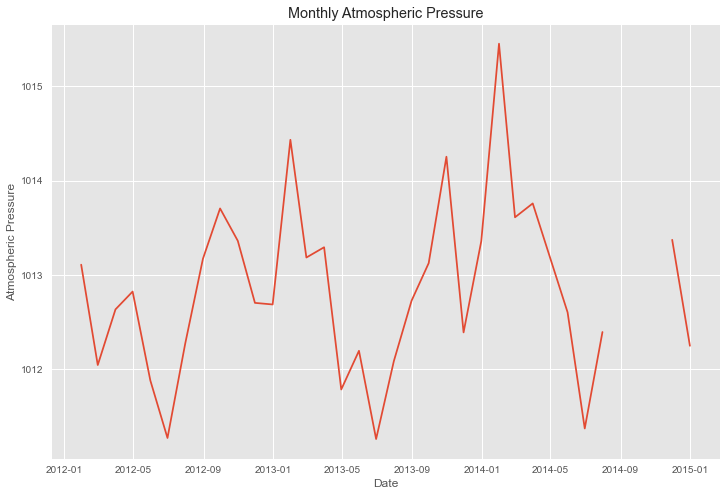

In [512]:
# Monthly seasonal variation for Hpa
# Resample data to monthly frequency
monthly_data = df['Hpa'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Atmospheric Pressure')
plt.title('Monthly Atmospheric Pressure')
plt.show()


## Observation
The maximum average value of the atmospheric presure is 1015.5atm in the month February 2014 and its minimum average value of the atmospheric pressure is 1003atm in the month of June 2013.

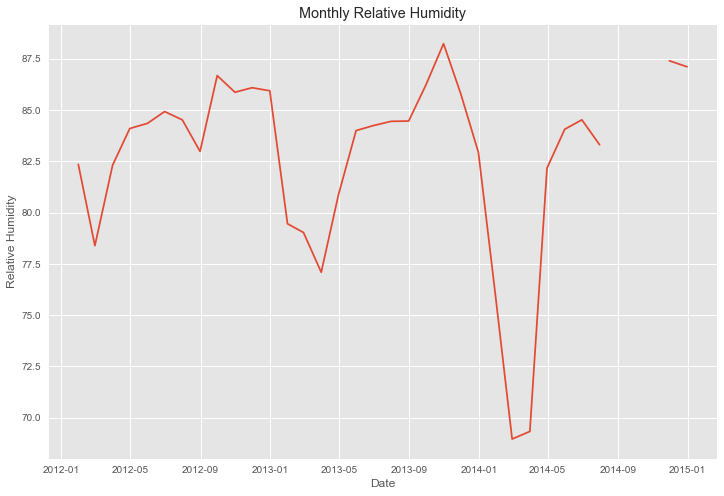

In [514]:
# Monthly seasonal variation for Relative humidity
# Resample data to monthly frequency
monthly_data = df['rel_humidity'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Relative Humidity')
plt.title('Monthly Relative Humidity')
plt.show()


## Observation
The maximum average value of the relative humidity is 88.5% in the month November 2013 and its minimum average value of the relative humidity is 69.5% in the month of March 2014.

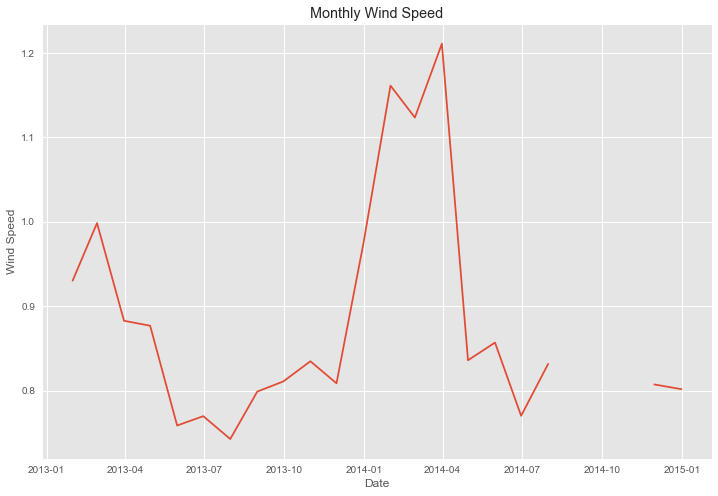

In [515]:
# Monthly seasonal variation for Wind speed
# Resample data to monthly frequency
monthly_data = df['wind_speed'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Wind Speed')
plt.title('Monthly Wind Speed')
plt.show()


## Observation
The maximum average value of the wind speed is 1.21m/s in the month April 2014 and its minimum average value of the wind speed is 0.72m/s in the month of September 2013.

### Yearly Variation of the Paramters to check for seasonality

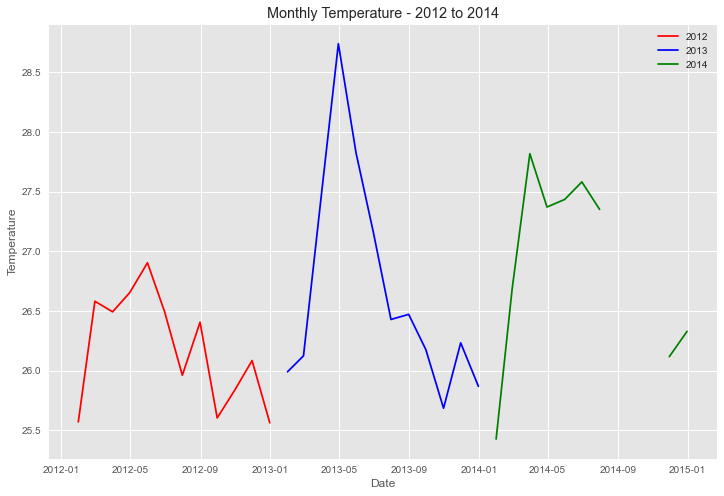

In [516]:
# Select only rows with index in 2012, 2013, and 2014
df_2012 = df.loc['2012']
df_2013 = df.loc['2013']
df_2014 = df.loc['2014']

# Resample data to monthly frequency
monthly_data_2012 = df_2012['Temp'].resample('M').mean()
monthly_data_2013 = df_2013['Temp'].resample('M').mean()
monthly_data_2014 = df_2014['Temp'].resample('M').mean()

# Plot monthly data for each year with different line colors
plt.plot(monthly_data_2012, color='red', label='2012')
plt.plot(monthly_data_2013, color='blue', label='2013')
plt.plot(monthly_data_2014, color='green', label='2014')

plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Monthly Temperature - 2012 to 2014')
plt.legend()
plt.show()


## Observation
The maximum average value of the Temperature is 28.8 degrees celsius which occur in the month May 2013 and its minimum average value of the Temperature is 25.35 degrees celsius in the month of February 2014.

### Yearly seasonal variation for Hpa

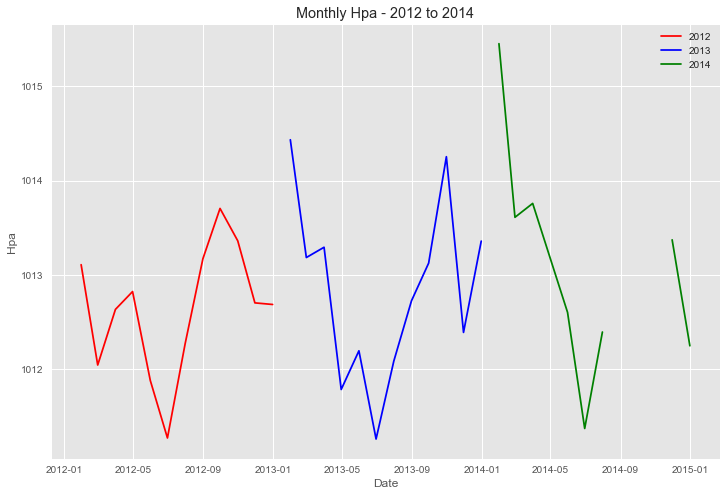

In [522]:
# Select only rows with index in 2012, 2013, and 2014
df_2012 = df.loc['2012']
df_2013 = df.loc['2013']
df_2014 = df.loc['2014']

# Resample data to monthly frequency
monthly_data_2012 = df_2012['Hpa'].resample('M').mean()
monthly_data_2013 = df_2013['Hpa'].resample('M').mean()
monthly_data_2014 = df_2014['Hpa'].resample('M').mean()

# Plot monthly data for each year with different line colors
plt.plot(monthly_data_2012, color='red', label='2012')
plt.plot(monthly_data_2013, color='blue', label='2013')
plt.plot(monthly_data_2014, color='green', label='2014')

plt.xlabel('Date')
plt.ylabel('Hpa')
plt.title('Monthly Hpa - 2012 to 2014')
plt.legend()
plt.show()


## Observation
There is a noticeable pattern for all the years, the month of July in 2012, 2013 and 2014 has the same average atmospheric pressure with a value of 1011.2atm.

### Yearly seasonal variation for Relative Humidity

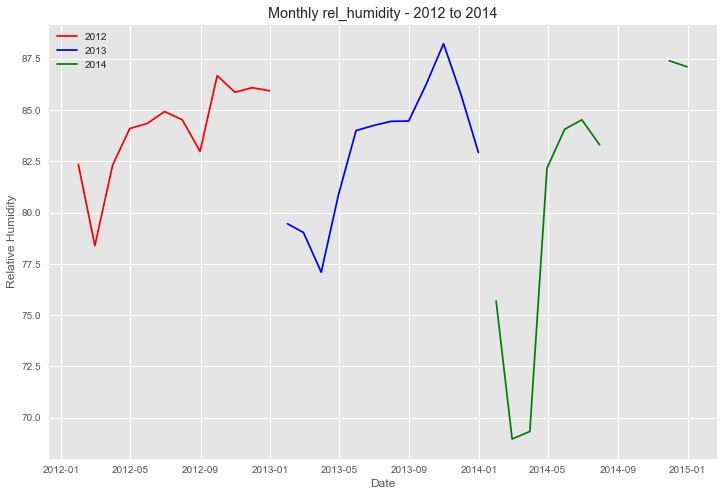

In [523]:
# Select only rows with index in 2012, 2013, and 2014
df_2012 = df.loc['2012']
df_2013 = df.loc['2013']
df_2014 = df.loc['2014']

# Resample data to monthly frequency
monthly_data_2012 = df_2012['rel_humidity'].resample('M').mean()
monthly_data_2013 = df_2013['rel_humidity'].resample('M').mean()
monthly_data_2014 = df_2014['rel_humidity'].resample('M').mean()

# Plot monthly data for each year with different line colors
plt.plot(monthly_data_2012, color='red', label='2012')
plt.plot(monthly_data_2013, color='blue', label='2013')
plt.plot(monthly_data_2014, color='green', label='2014')

plt.xlabel('Date')
plt.ylabel('Relative Humidity')
plt.title('Monthly rel_humidity - 2012 to 2014')
plt.legend()
plt.show()


## Observation
The maximum average value of the relative humidity is 88.5% in the month of November 2013 and its minimum average value of the relative humidity is 71.5% in the month of March 2014.

### Yearly seasonal variation for Wind Speed

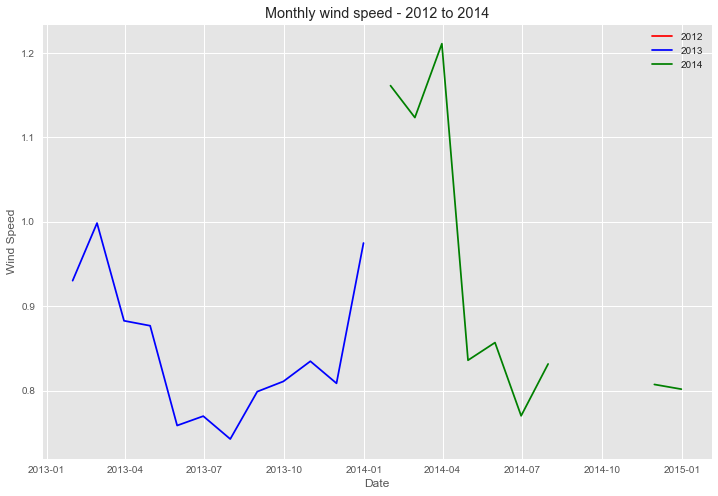

In [525]:
# Select only rows with index in 2012, 2013, and 2014
df_2012 = df.loc['2012']
df_2013 = df.loc['2013']
df_2014 = df.loc['2014']

# Resample data to monthly frequency
monthly_data_2012 = df_2012['wind_speed'].resample('M').mean()
monthly_data_2013 = df_2013['wind_speed'].resample('M').mean()
monthly_data_2014 = df_2014['wind_speed'].resample('M').mean()

# Plot monthly data for each year with different line colors
plt.plot(monthly_data_2012, color='red', label='2012')
plt.plot(monthly_data_2013, color='blue', label='2013')
plt.plot(monthly_data_2014, color='green', label='2014')

plt.xlabel('Date')
plt.ylabel('Wind Speed')
plt.title('Monthly wind speed - 2012 to 2014')
plt.legend()
plt.show()


## Observation
The maximum average value of the wind speed is 1.21m/s in the month of April 2014 and its minimum average value of the relative humidity is 0.75m/s in the month of August 2013.

## Distribution of the average of Hpa, Temp, Relative humidity and Wind speed over Hours in a Day

#### - The trend of Hpa between the hours of 1 and 6

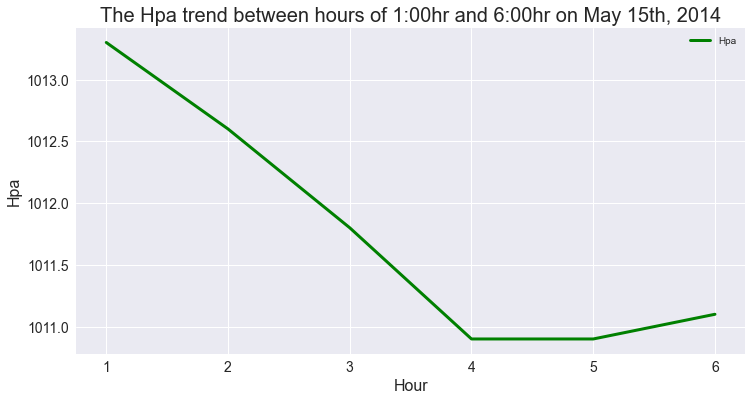

In [439]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2014, and day is 15 between hours of 1 and 6
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 1) & (df['Hour'] <= 6)]

plt.style.use('seaborn')
# line plot - the Hpa between hours of 1 and 6 on May 15th, 2014
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend between hours of 1:00hr and 6:00hr on May 15th, 2014', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


#### - The trend of Hpa between the hours of 7 and 12

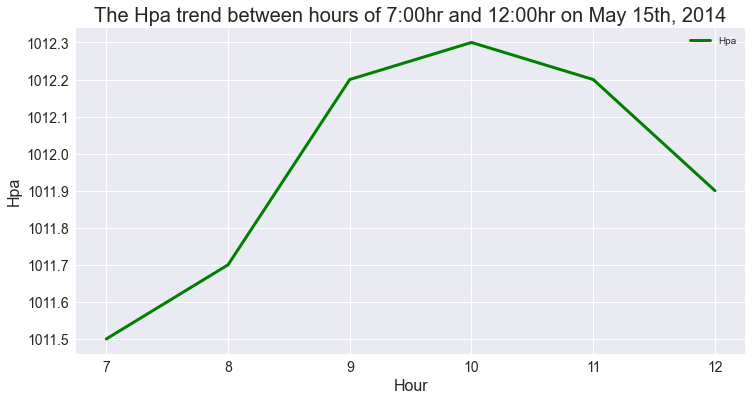

In [438]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2014, and day is 15 between hours of 7 and 12
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 7) & (df['Hour'] <= 12)]

plt.style.use('seaborn')
# line plot - the Hpa between hours of 7 and 12 on May 15th, 2014
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend between hours of 7:00hr and 12:00hr on May 15th, 2014', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


#### - The trend of Hpa between the hours of 13 and 18

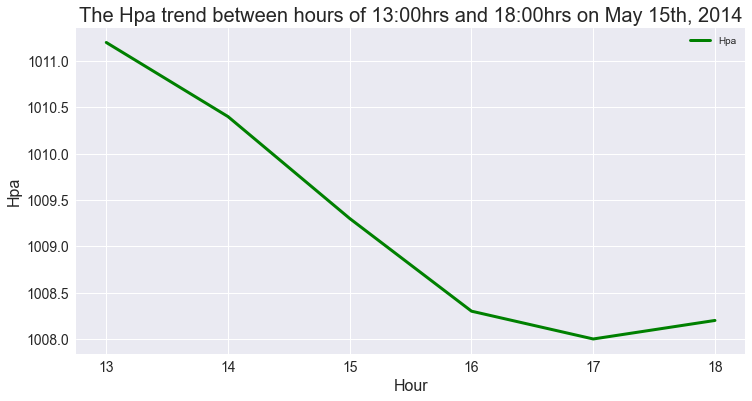

In [436]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2014, and day is 15 between hours of 13 and 18
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 13) & (df['Hour'] <= 18)]

plt.style.use('seaborn')
# line plot - the Hpa between hours of 13 and 18 on May 15th, 2014
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend between hours of 13:00hrs and 18:00hrs on May 15th, 2014', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


#### - The trend of Hpa between the hours of 19 and 24

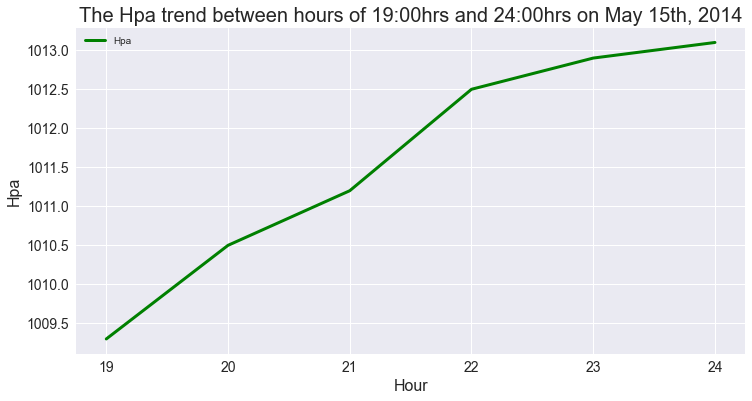

In [437]:
import matplotlib.pyplot as plt

# select rows where month is May, year is 2014, and day is 15 between hours of 19 and 24
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 19) & (df['Hour'] <= 24)]

plt.style.use('seaborn')
# line plot - the Hpa between hours of 19 and 24 on May 15th, 2014
df_filtered.plot(x='Hour', y='Hpa', color='green', linewidth=3, figsize=(12,6))

# modify ticks size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# title and labels
plt.title('The Hpa trend between hours of 19:00hrs and 24:00hrs on May 15th, 2014', fontsize=20)
plt.xlabel('Hour', fontsize=16)
plt.ylabel('Hpa', fontsize=16)

plt.show()


### Multivariate Analysis
- it is comparing two or more features or variables and their visuals

In [152]:
# correlation of features
imputed_df.corr()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
Year,1.000000,-0.036475,0.010701,-0.000857,0.082098,0.071047,-0.042783,-0.073286,-0.071439,0.071090,-0.067347,-0.105994
Month,-0.036475,1.000000,0.019519,-0.000896,-0.046145,-0.070067,0.316387,0.187238,-0.011071,-0.101427,-0.062229,-0.059701
Day,0.010701,0.019519,1.000000,0.001217,0.040386,0.018139,-0.000180,-0.018676,0.002655,0.005969,0.018216,0.096189
Hour,-0.000857,-0.000896,0.001217,1.000000,-0.113124,0.330249,0.107077,-0.275933,0.033200,0.164621,-0.024132,0.068873
Hpa,0.082098,-0.046145,0.040386,-0.113124,1.000000,-0.373818,-0.267905,0.221930,-0.179625,-0.086968,0.014345,-0.130485
Temp,0.071047,-0.070067,0.018139,0.330249,-0.373818,1.000000,0.012667,-0.921007,0.049453,0.628231,-0.248800,0.104600
Dew_point,-0.042783,0.316387,-0.000180,0.107077,-0.267905,0.012667,1.000000,0.359585,0.232574,-0.304674,-0.147061,-0.090344
rel_humidity,-0.073286,0.187238,-0.018676,-0.275933,0.221930,-0.921007,0.359585,1.000000,0.055752,-0.712519,0.218854,-0.117725
wind_dir,-0.071439,-0.011071,0.002655,0.033200,-0.179625,0.049453,0.232574,0.055752,1.000000,-0.187190,0.022903,0.051120
wind_speed,0.071090,-0.101427,0.005969,0.164621,-0.086968,0.628231,-0.304674,-0.712519,-0.187190,1.000000,-0.193284,0.103826


<AxesSubplot:>

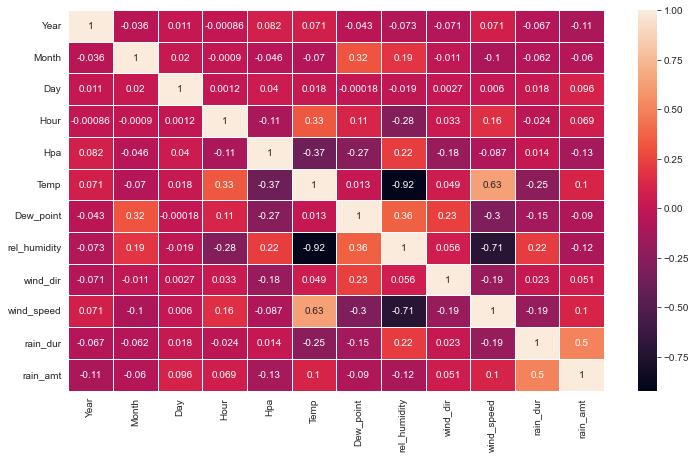

In [153]:
corel = imputed_df.corr()
fig, ax = plt.subplots(figsize=(12, 7))
sns.heatmap(corel, linewidths = 0.5, annot = True)

<AxesSubplot:>

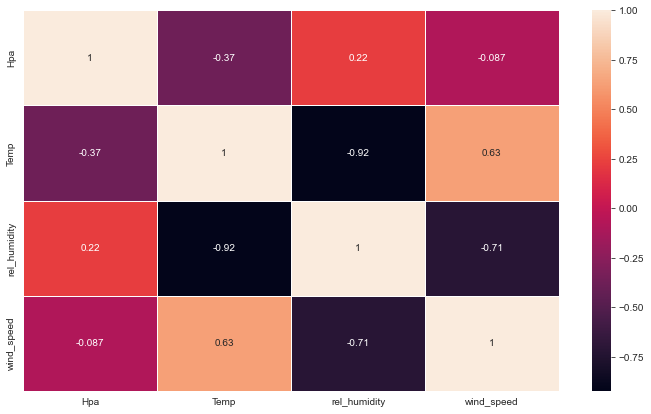

In [154]:
# Correlating the four parameters or features- Hpa, Temp, rel_humidity and wind_speed
corel = imputed_df[['Hpa', 'Temp', 'rel_humidity', 'wind_speed']].corr()
fig, ax = plt.subplots(figsize=(12, 7))
sns.heatmap(corel, linewidths = 0.5, annot = True)

## Observation
This shows the correlation between the selected features. There is a high positive correlation between wind speed and Temp with a value of 0.63, which means that the higher the temperature the higher the wind speed and vice versa. Also, there is a negative correlation of -0.71 between relative humidity and wind speed, that means that the higher the relative humidity the lower the wind speed and vice versa.

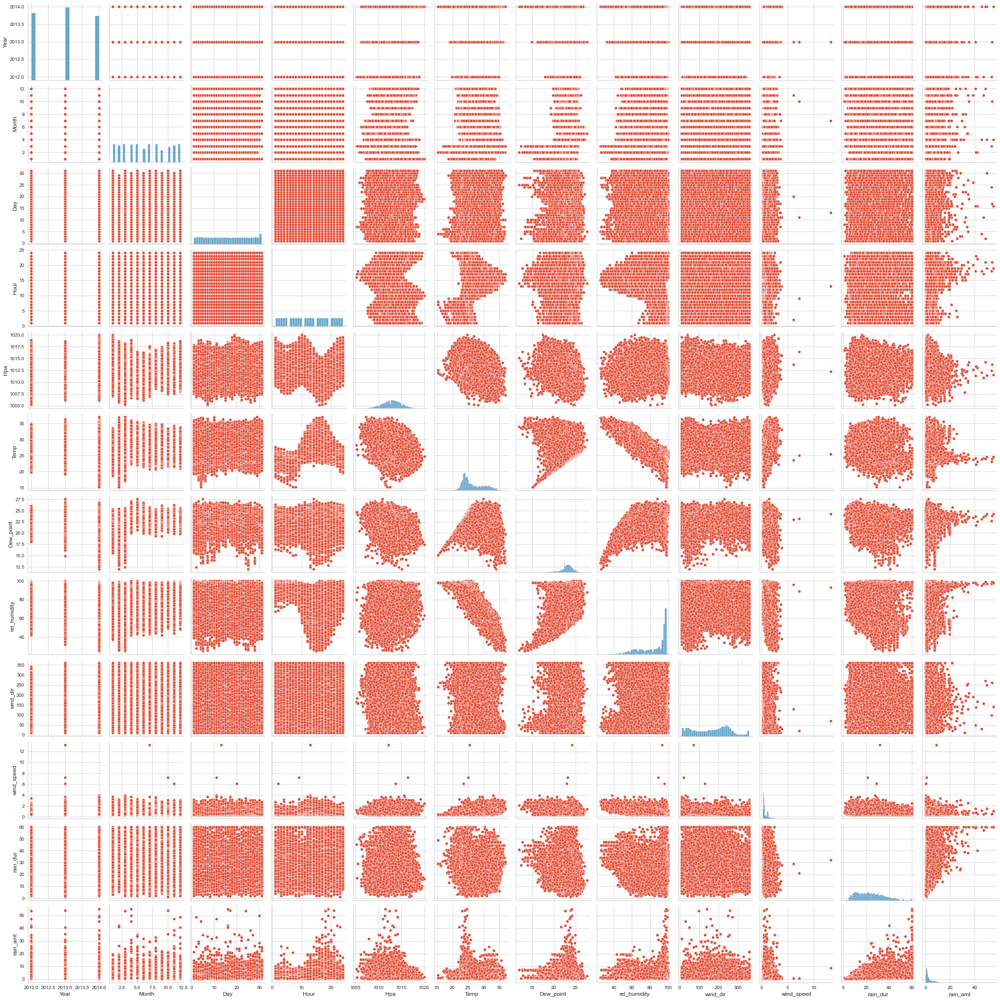

In [155]:
# pairplot of all the features
sns.pairplot(imputed_df)

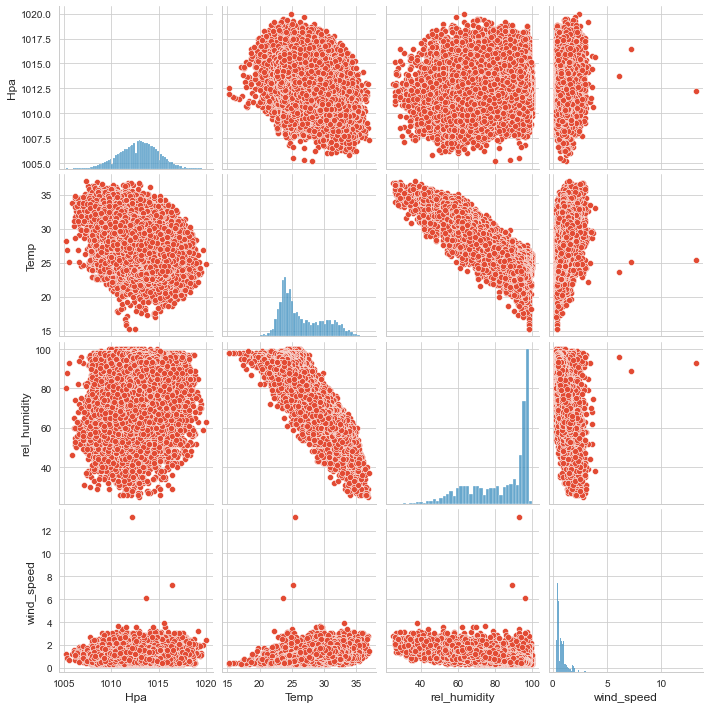

In [156]:
# pairplot of selected features:
sns.pairplot(imputed_df[['Hpa', 'Temp', 'rel_humidity', 'wind_speed']])

## Observation
This is a pairplot of Hpa, Temp, Relative humidity and Wind speed, which show the distribution and correlation that does exist between each pairs of the features

<Figure size 14400x8640 with 0 Axes>

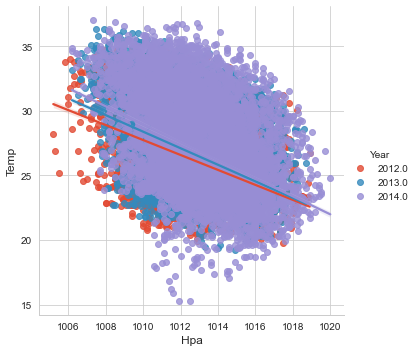

In [157]:
# visualizing Year and Temp apartment by Atmospheric Pressure
plt.figure(figsize = (200, 120))
sns.lmplot(x = 'Hpa', y = 'Temp', data = imputed_df, hue = 'Year')

## Observation
This shows a negative correlation between Temp and Hpa for each of the year 2012 to 2014. That means that the higher the temperature the lower the Atmospheric pressure and vice versa.

## Picking a complete parameter of a day and take a sample and make it a missing value, and then predict the missing values

In [102]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Filter data for Hpa parameter with no missing values
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 1) & (df['Hour'] <= 24) & df['Hpa'].notnull()]

# Extract some data points and assume they are missing
df_missing = df_filtered.sample(10)
df_filtered.loc[df_missing.index, 'Hpa'] = None

In [84]:
# Split data into training and test sets
train = df_filtered.dropna()
test = df_missing.drop(columns=['Hpa'])

In [85]:
# Train linear regression model
model = LinearRegression()
model.fit(train.drop(columns=['Hpa']), train['Hpa'])

LinearRegression()

In [86]:
# Predict missing values
predictions = model.predict(test)

In [88]:
# Compare predicted values with actual values
print('Predicted values:', predictions)
print('.....................................................................')
print('Actual values:', df_missing['Hpa'])

Predicted values: [1012.08530371 1012.45354257 1012.39785293 1012.00861263 1010.09826693
 1008.68271123 1012.24873653 1007.87051014 1012.84656559 1014.00581294]
.....................................................................
Actual values: datetime
2014-05-15 12:00:00    1011.9
2014-05-15 01:00:00    1013.3
2014-05-15 02:00:00    1012.6
2014-05-15 06:00:00    1011.1
2014-05-15 14:00:00    1010.4
2014-05-15 18:00:00    1008.2
2014-05-15 09:00:00    1012.2
2014-05-15 17:00:00    1008.0
2014-05-15 23:00:00    1012.9
2014-05-15 03:00:00    1011.8
Name: Hpa, dtype: float64


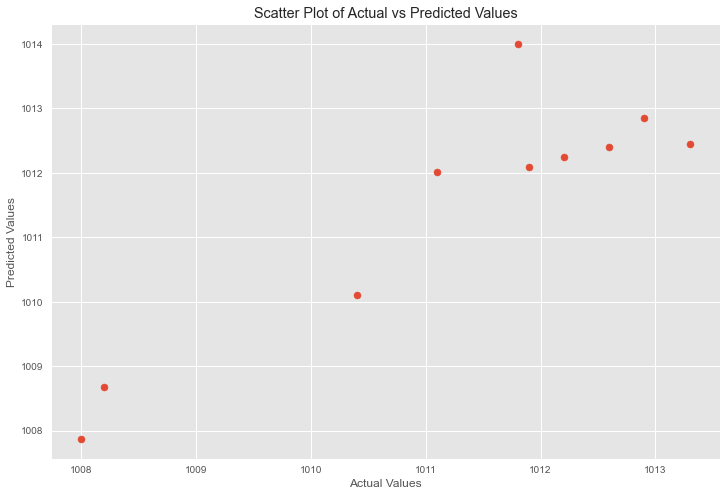

In [90]:
# Create scatter plot of actual vs predicted values
plt.scatter(df_missing['Hpa'], predictions)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs Predicted Values')
plt.show()

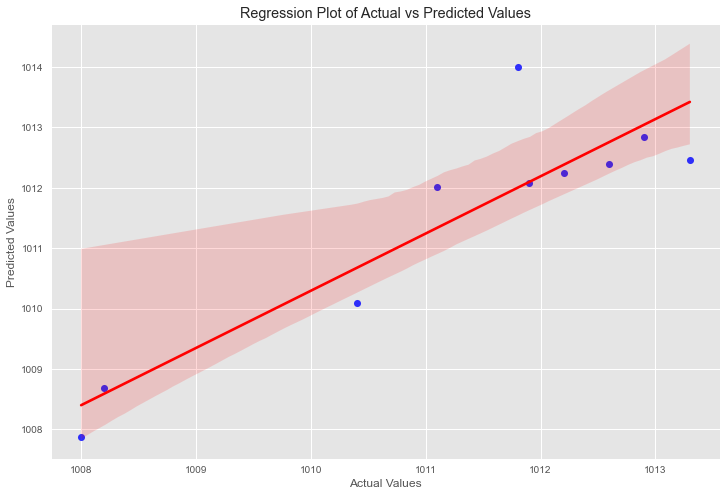

<Figure size 720x576 with 0 Axes>

Pearsons correlation: 0.904


In [93]:
from scipy.stats import pearsonr

# Create regression plot of actual vs predicted values
sns.regplot(x=df_missing['Hpa'], y=predictions, color='blue', line_kws={'color': 'red'}, scatter_kws={'s': 50})
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Regression Plot of Actual vs Predicted Values')
plt.figure(figsize=(10, 8))
plt.show()

corr, _ = pearsonr(x=df_missing['Hpa'], y=predictions)
print('Pearsons correlation: %.3f' % corr)

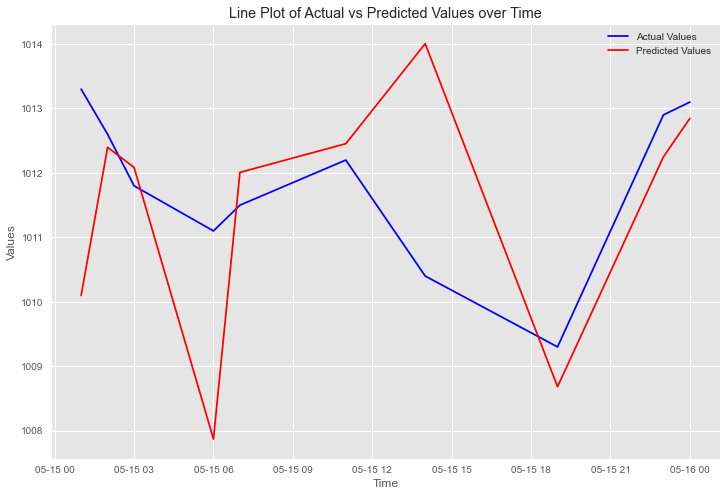

In [103]:
# Create line plot of actual vs predicted values over time
sns.lineplot(x=df_missing.index, y=df_missing['Hpa'], color='blue', label='Actual Values')
sns.lineplot(x=df_missing.index, y=predictions, color='red', label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Line Plot of Actual vs Predicted Values over Time')
plt.legend()
plt.show()


In [89]:
# Calculate metrics to evaluate performance
mse = mean_squared_error(df_missing['Hpa'], predictions)
mae = mean_absolute_error(df_missing['Hpa'], predictions)
rmse = np.sqrt(mse)
r2 = r2_score(df_missing['Hpa'], predictions)

print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Mean Squared Error: 0.6828929813008678
Mean Absolute Error: 0.5364438883150683
Root Mean Squared Error: 0.8263733909685548
R2 Score: 0.7795981857407444


- **Mean Squared Error (MSE):** This measures the average of the squared differences between the predicted and actual values. A lower MSE value indicates better performance. In this case, the MSE is 0.68, which means that on average, the model's predictions are off by about 0.68 units squared.

- **Mean Absolute Error (MAE):** This measures the average of the absolute differences between the predicted and actual values. A lower MAE value indicates better performance. In this case, the MAE is 0.54, which means that on average, the model's predictions are off by about 0.54 units.

- **Root Mean Squared Error (RMSE):** This is the square root of the MSE and is another way to measure the average difference between the predicted and actual values. A lower RMSE value indicates better performance. In this case, the RMSE is 0.83, which means that on average, the model's predictions are off by about 0.83 units.

- **R2 Score:** This measures how well the model fits the data compared to a baseline model that always predicts the mean of the target variable. An R2 score of 1 indicates perfect fit, while a score of 0 indicates that the model does no better than always predicting the mean. In this case, the R2 score is 0.78, which means that the model is able to explain about 78% of the variance in the target variable.



In [94]:
# Filter data for Temp parameter with no missing values
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 1) & (df['Hour'] <= 24) & df['Hpa'].notnull()]

# Extract some data points and assume they are missing
df_missing = df_filtered.sample(10)
df_filtered.loc[df_missing.index, 'Temp'] = None

In [95]:
# Split data into training and test sets
train = df_filtered.dropna()
test = df_missing.drop(columns=['Temp'])

In [96]:
# Train linear regression model
model2 = LinearRegression()
model2.fit(train.drop(columns=['Temp']), train['Temp'])

LinearRegression()

In [97]:
# Predict missing values
predictions2 = model2.predict(test)

In [98]:
# Compare predicted values with actual values
print('Predicted values:', predictions2)
print('.....................................................................')
print('Actual values:', df_missing['Temp'])

Predicted values: [24.62327344 32.12754912 27.14504836 24.51077592 30.46272783 33.60198899
 25.05241288 24.55115238 25.51614262 26.98819997]
.....................................................................
Actual values: datetime
2014-05-15 06:00:00    24.4
2014-05-15 12:00:00    32.1
2014-05-15 09:00:00    26.8
2014-05-15 07:00:00    24.3
2014-05-15 18:00:00    30.2
2014-05-15 14:00:00    33.9
2014-05-15 08:00:00    24.9
2014-05-15 04:00:00    24.7
2014-05-16 00:00:00    25.5
2014-05-15 20:00:00    26.9
Name: Temp, dtype: float64


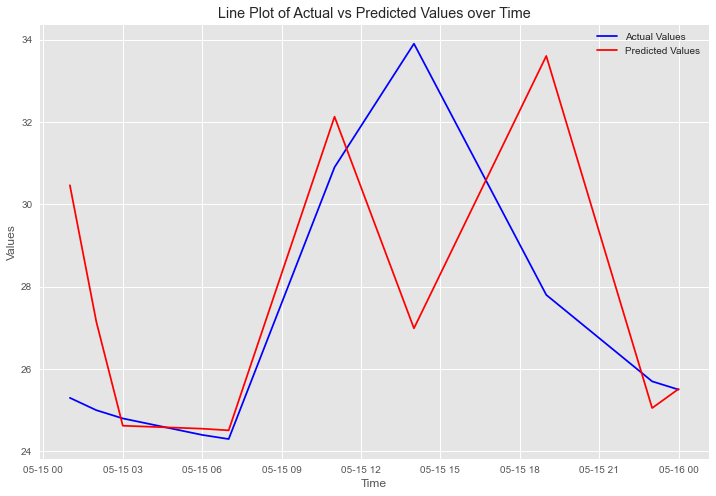

In [104]:
# Create line plot of actual vs predicted values over time
sns.lineplot(x=df_missing.index, y=df_missing['Temp'], color='blue', label='Actual Values')
sns.lineplot(x=df_missing.index, y=predictions2, color='red', label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Line Plot of Actual vs Predicted Values over Time')
plt.legend()
plt.show()

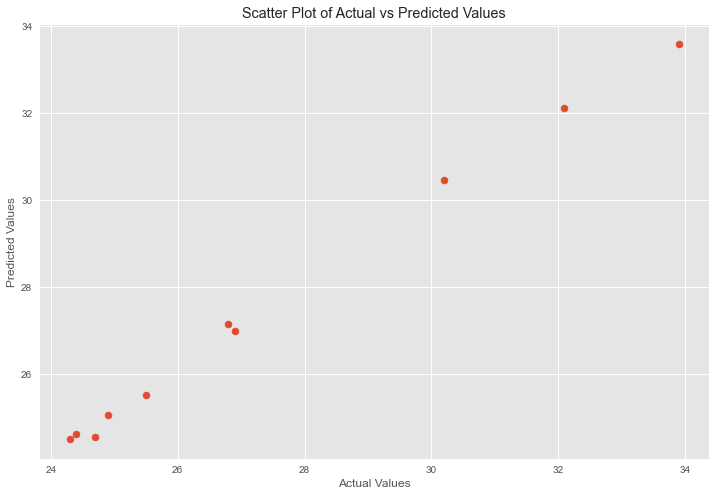

In [99]:
# Create scatter plot of actual vs predicted values
plt.scatter(df_missing['Temp'], predictions2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs Predicted Values')
plt.show()

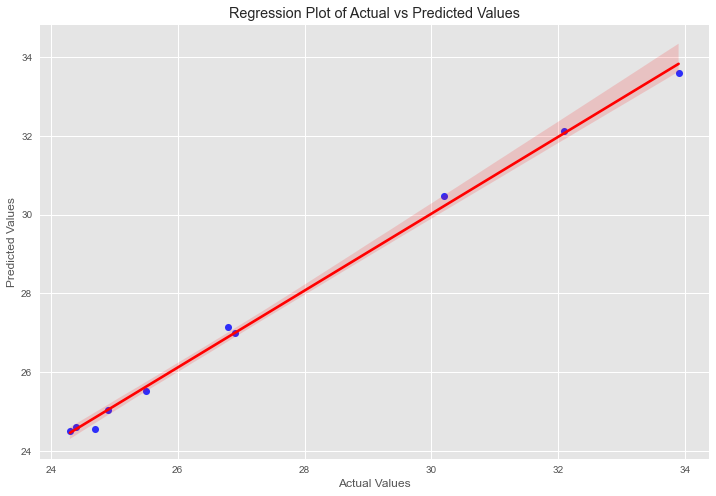

<Figure size 720x576 with 0 Axes>

Pearsons correlation: 0.999


In [100]:
from scipy.stats import pearsonr

# Create regression plot of actual vs predicted values
sns.regplot(x=df_missing['Temp'], y=predictions2, color='blue', line_kws={'color': 'red'}, scatter_kws={'s': 50})
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Regression Plot of Actual vs Predicted Values')
plt.figure(figsize=(10, 8))
plt.show()

corr, _ = pearsonr(x=df_missing['Temp'], y=predictions2)
print('Pearsons correlation: %.3f' % corr)

In [101]:
# Calculate metrics to evaluate performance
mse = mean_squared_error(df_missing['Temp'], predictions2)
mae = mean_absolute_error(df_missing['Temp'], predictions2)
rmse = np.sqrt(mse)
r2 = r2_score(df_missing['Temp'], predictions2)

print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Mean Squared Error: 0.042535643732861436
Mean Absolute Error: 0.17729887718209342
Root Mean Squared Error: 0.2062417119131371
R2 Score: 0.996081145029725


In [133]:
# Filter data for Relative Humidity parameter with no missing values
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 1) & (df['Hour'] <= 24) & df['Hpa'].notnull()]

# Extract some data points and assume they are missing
df_missing = df_filtered.sample(10)
df_filtered.loc[df_missing.index, 'rel_humidity'] = None

In [134]:
# Split data into training and test sets
train = df_filtered.dropna()
test = df_missing.drop(columns=['rel_humidity'])

In [135]:
# Train linear regression model
model3 = LinearRegression()
model3.fit(train.drop(columns=['rel_humidity']), train['rel_humidity'])

LinearRegression()

In [136]:
# Predict missing values
predictions3 = model3.predict(test)

In [137]:
# Compare predicted values with actual values
print('Predicted values:', predictions3)
print('.....................................................................')
print('Actual values:', df_missing['rel_humidity'])

Predicted values: [70.89261049 66.55702706 85.13349727 89.50633869 90.75895577 96.84273283
 60.9542851  91.83850334 71.26148224 99.81603742]
.....................................................................
Actual values: datetime
2014-05-15 11:00:00    71
2014-05-15 13:00:00    66
2014-05-15 09:00:00    84
2014-05-16 00:00:00    91
2014-05-15 21:00:00    92
2014-05-15 07:00:00    96
2014-05-15 15:00:00    61
2014-05-15 22:00:00    94
2014-05-15 18:00:00    71
2014-05-15 03:00:00    98
Name: rel_humidity, dtype: int64


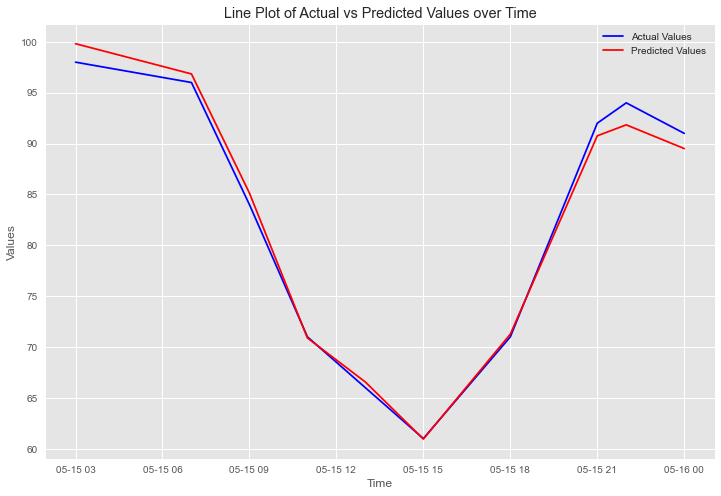

In [138]:
# Create line plot of actual vs predicted values over time
sns.lineplot(x=df_missing.index, y=df_missing['rel_humidity'], color='blue', label='Actual Values')
sns.lineplot(x=df_missing.index, y=predictions3, color='red', label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Line Plot of Actual vs Predicted Values over Time')
plt.legend()
plt.show()

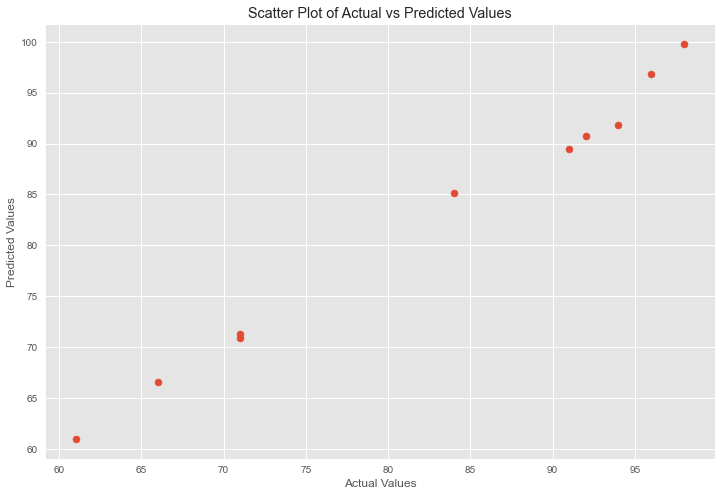

In [139]:
# Create scatter plot of actual vs predicted values
plt.scatter(df_missing['rel_humidity'], predictions3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs Predicted Values')
plt.show()

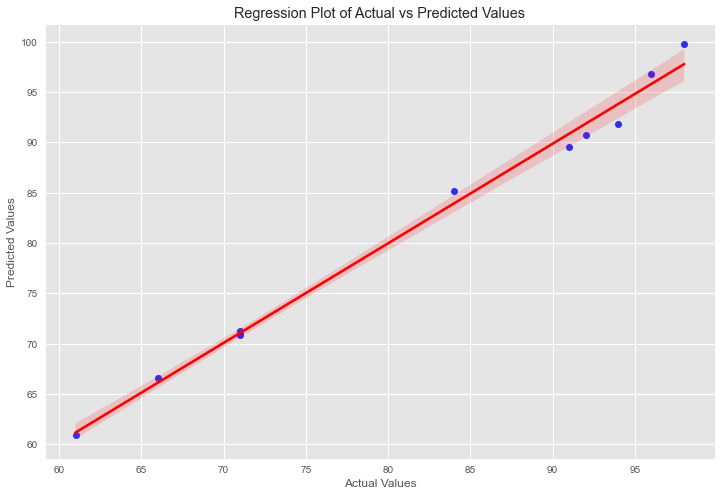

<Figure size 720x576 with 0 Axes>

Pearsons correlation: 0.996


In [140]:
from scipy.stats import pearsonr

# Create regression plot of actual vs predicted values
sns.regplot(x=df_missing['rel_humidity'], y=predictions3, color='blue', line_kws={'color': 'red'}, scatter_kws={'s': 50})
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Regression Plot of Actual vs Predicted Values')
plt.figure(figsize=(10, 8))
plt.show()

corr, _ = pearsonr(x=df_missing['rel_humidity'], y=predictions3)
print('Pearsons correlation: %.3f' % corr)

In [141]:
# Calculate metrics to evaluate performance
mse = mean_squared_error(df_missing['rel_humidity'], predictions3)
mae = mean_absolute_error(df_missing['rel_humidity'], predictions3)
rmse = np.sqrt(mse)
r2 = r2_score(df_missing['rel_humidity'], predictions3)

print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Mean Squared Error: 1.412856376653966
Mean Absolute Error: 0.9660083425340986
Root Mean Squared Error: 1.1886363517299838
R2 Score: 0.9917780704338107


In [142]:
# Filter data for Relative Wind Speed with no missing values
df_filtered = df.loc[(df['Month'] == 5) & (df['Year'] == 2014) & (df['Day'] == 15) & (df['Hour'] >= 1) & (df['Hour'] <= 24) & df['Hpa'].notnull()]

# Extract some data points and assume they are missing
df_missing = df_filtered.sample(10)
df_filtered.loc[df_missing.index, 'wind_speed'] = None

In [143]:
# Split data into training and test sets
train = df_filtered.dropna()
test = df_missing.drop(columns=['wind_speed'])

In [144]:
# Train linear regression model
model4 = LinearRegression()
model4.fit(train.drop(columns=['wind_speed']), train['wind_speed'])

LinearRegression()

In [145]:
# Predict missing values
predictions4 = model4.predict(test)

In [146]:
# Compare predicted values with actual values
print('Predicted values:', predictions4)
print('.....................................................................')
print('Actual values:', df_missing['wind_speed'])

Predicted values: [1.42647282 1.00093437 0.15577321 1.37134306 1.24811697 0.60711856
 1.09541697 1.33142222 0.9909836  0.97847172]
.....................................................................
Actual values: datetime
2014-05-15 18:00:00    2.4
2014-05-15 23:00:00    0.6
2014-05-15 04:00:00    0.4
2014-05-15 16:00:00    1.7
2014-05-15 17:00:00    2.3
2014-05-15 08:00:00    0.5
2014-05-15 11:00:00    1.4
2014-05-15 15:00:00    1.9
2014-05-15 12:00:00    0.6
2014-05-15 09:00:00    0.7
Name: wind_speed, dtype: float64


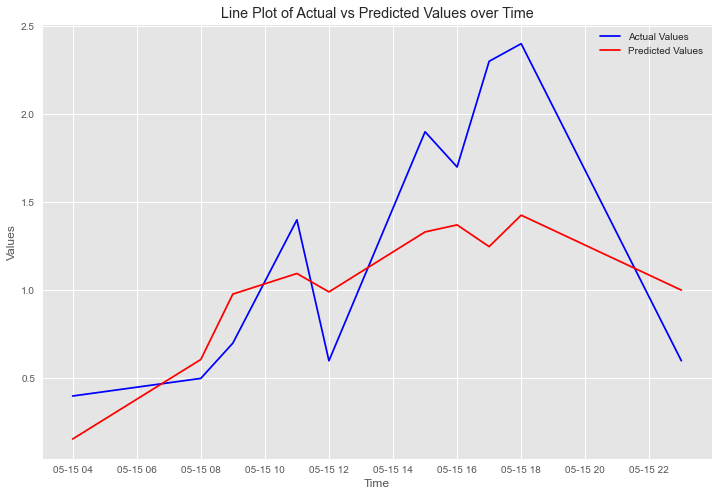

In [147]:
# Create line plot of actual vs predicted values over time
sns.lineplot(x=df_missing.index, y=df_missing['wind_speed'], color='blue', label='Actual Values')
sns.lineplot(x=df_missing.index, y=predictions4, color='red', label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Values')
plt.title('Line Plot of Actual vs Predicted Values over Time')
plt.legend()
plt.show()

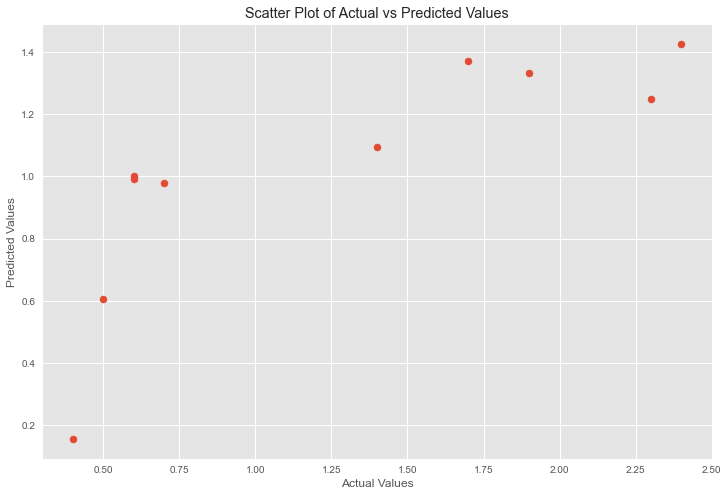

In [148]:
# Create scatter plot of actual vs predicted values
plt.scatter(df_missing['wind_speed'], predictions4)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs Predicted Values')
plt.show()

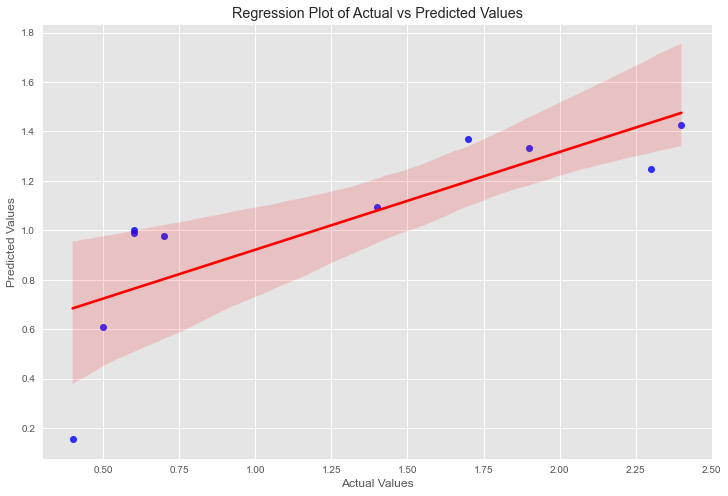

<Figure size 720x576 with 0 Axes>

Pearsons correlation: 0.795


In [149]:
from scipy.stats import pearsonr

# Create regression plot of actual vs predicted values
sns.regplot(x=df_missing['wind_speed'], y=predictions4, color='blue', line_kws={'color': 'red'}, scatter_kws={'s': 50})
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Regression Plot of Actual vs Predicted Values')
plt.figure(figsize=(10, 8))
plt.show()

corr, _ = pearsonr(x=df_missing['wind_speed'], y=predictions4)
print('Pearsons correlation: %.3f' % corr)

In [150]:
# Calculate metrics to evaluate performance
mse = mean_squared_error(df_missing['wind_speed'], predictions4)
mae = mean_absolute_error(df_missing['wind_speed'], predictions4)
rmse = np.sqrt(mse)
r2 = r2_score(df_missing['wind_speed'], predictions4)

print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)
print('Root Mean Squared Error:', rmse)
print('R2 Score:', r2)

Mean Squared Error: 0.30405641322302734
Mean Absolute Error: 0.4648963008824314
Root Mean Squared Error: 0.5514131057773539
R2 Score: 0.4476722738909583


These are different metrics used to evaluate the performance of a regression model. Here's a brief explanation of each one:

- **Mean Squared Error (MSE)**: This measures the average squared difference between the predicted and actual values. A lower MSE indicates better performance. In this case, the MSE value is 0.30405641322302734.

- **Mean Absolute Error (MAE)**: This measures the average absolute difference between the predicted and actual values. A lower MAE indicates better performance. In this case, the MAE value is 0.4648963008824314, as it means that the model is making more accurate predictions.

- **Root Mean Squared Error (RMSE)**: This is the square root of the MSE, and represents the standard deviation of the errors. A lower RMSE indicates better performance. In this case, the RMSE value is 0.5514131057773539.

- **R2 Score**: This is a measure of how well the model fits the data, and represents the proportion of variance in the dependent variable that is explained by the independent variables. A higher R2 score indicates better performance. The R2 score ranges from 0 to 1, with a value of 1 indicating a perfect fit. In this case, the R2 score is 0.4476722738909583, which means that the model explains 44.77% of the variance in the dependent variable. The R2 score is useful for evaluating the goodness of fit of a regression model, as it gives an indication of how well the model is able to capture the underlying patterns in the data. A higher R2 score indicates better performance, as it means that the model is better able to explain the variance in the dependent variable.


# Working with data without missing values

In [38]:
# Split data into two parts: one with missing values and one without
data_with_missing = df

# replaces positive and negative infinity values in data_with_missing with NaN (Not a Number) values.
data_with_missing.replace([np.inf, -np.inf], np.nan, inplace=True)

# drop the missing values and rename
dff = data_with_missing.dropna()

In [39]:
dff.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
8081,2013,1,1,6,1012.9,22.9,22.0,95.0,320.0,0.6,35.0,0.5
8114,2013,1,2,15,1012.0,27.3,24.6,85.0,110.0,0.5,17.0,1.6
8122,2013,1,2,23,1015.8,24.4,23.9,97.0,170.0,0.5,22.0,2.3
8124,2013,1,3,1,1015.6,24.0,23.6,98.0,320.0,0.5,60.0,7.4
8125,2013,1,3,2,1014.9,23.7,23.0,96.0,290.0,0.6,60.0,8.0


In [40]:
dff.tail()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
23910,2014,12,2,20,1012.6,25.8,24.3,91.0,50.0,2.3,19.0,1.9
23911,2014,12,2,21,1014.2,24.0,23.8,99.0,270.0,0.6,60.0,48.7
23912,2014,12,2,22,1014.8,24.0,23.8,99.0,70.0,0.5,55.0,6.2
23913,2014,12,2,23,1015.1,24.0,23.8,99.0,30.0,0.6,42.0,2.5
23931,2014,12,3,17,1010.5,24.9,24.1,95.0,50.0,2.2,24.0,27.9


In [41]:
dff.shape

(904, 12)

In [42]:
dff.isnull().sum()

Year            0
Month           0
Day             0
Hour            0
Hpa             0
Temp            0
Dew_point       0
rel_humidity    0
wind_dir        0
wind_speed      0
rain_dur        0
rain_amt        0
dtype: int64

In [43]:
dff.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Hpa', 'Temp', 'Dew_point',
       'rel_humidity', 'wind_dir', 'wind_speed', 'rain_dur', 'rain_amt'],
      dtype='object')

## Seasonal Variation of the Parameters in Data without Missing values : Hpa, Temp, Rel_Humidity and Wind Speed

In [44]:
# Create datetime column from Year, Month, Day, and Hour columns
dff['datetime'] = pd.to_datetime(dff[['Year', 'Month', 'Day', 'Hour']])

# Set datetime column as index
dff.set_index('datetime', inplace=True)

In [45]:
dff.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
datetime,,,,,,,,,,,,
2013-01-01 06:00:00,2013,1,1,6,1012.9,22.9,22.0,95.0,320.0,0.6,35.0,0.5
2013-01-02 15:00:00,2013,1,2,15,1012.0,27.3,24.6,85.0,110.0,0.5,17.0,1.6
2013-01-02 23:00:00,2013,1,2,23,1015.8,24.4,23.9,97.0,170.0,0.5,22.0,2.3
2013-01-03 01:00:00,2013,1,3,1,1015.6,24.0,23.6,98.0,320.0,0.5,60.0,7.4
2013-01-03 02:00:00,2013,1,3,2,1014.9,23.7,23.0,96.0,290.0,0.6,60.0,8.0


## Date seasonal variation for the parameters

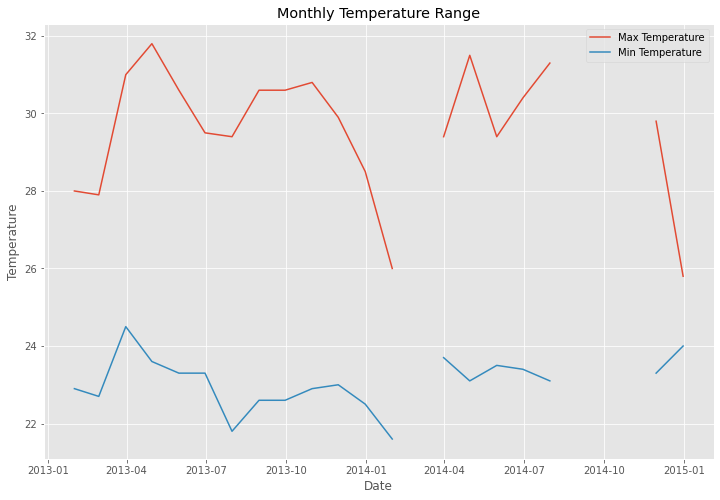

In [46]:
## Monthly seasonal variation for Temp
# Resample data to monthly frequency
# Resample the data to monthly frequency
monthly_data = dff['Temp'].resample('M')

# Compute the maximum and minimum temperature for each month
monthly_max = monthly_data.max()
monthly_min = monthly_data.min()

# Plot the maximum and minimum temperature for each month
plt.plot(monthly_max, label='Max Temperature')
plt.plot(monthly_min, label='Min Temperature')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Monthly Temperature Range')
plt.legend()
plt.show()


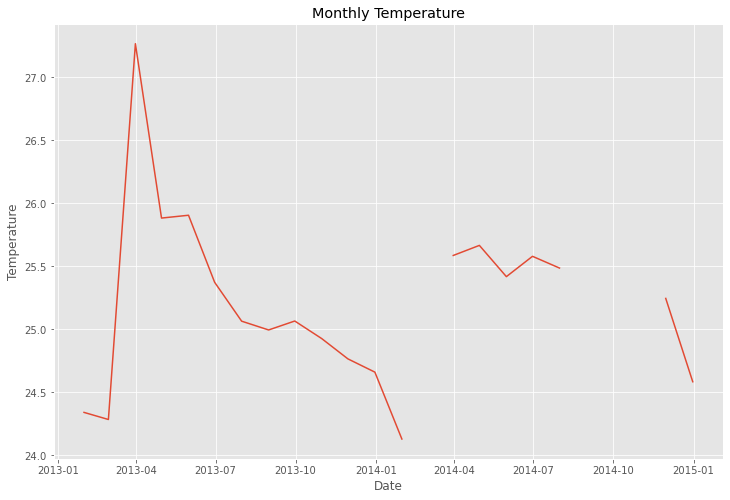

In [56]:
## Monthly seasonal variation for Temp
# Resample data to monthly frequency
monthly_data = dff['Temp'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Monthly Temperature')
plt.show()

### Observation
The Temperature seasonal trend has its average maximum point of 28.8 degrees celsius in April 2013 and its average minimum point of 24.2 degrees celsius in February 2014.

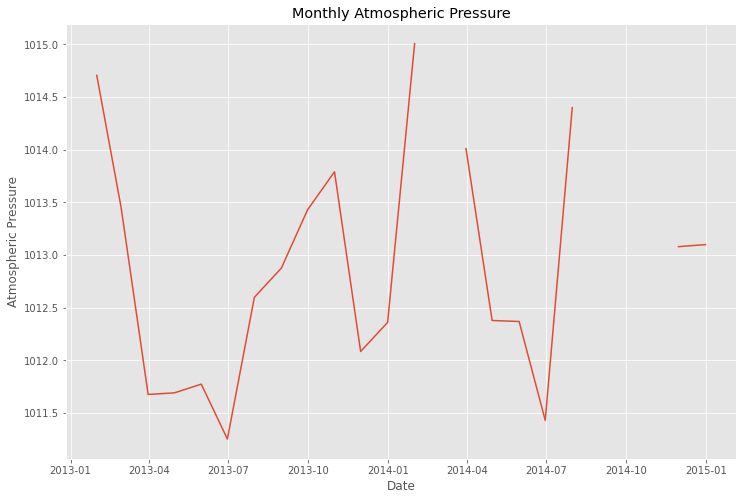

In [57]:
# Monthly seasonal variation for Hpa
# Resample data to monthly frequency
monthly_data = dff['Hpa'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Atmospheric Pressure')
plt.title('Monthly Atmospheric Pressure')
plt.show()

### Observation
The maximum average value of the atmospheric presure is 1015.1atm in the month February 2014 and its minimum average value of the atmospheric pressure is 1011.3atm in the month of July 2013.

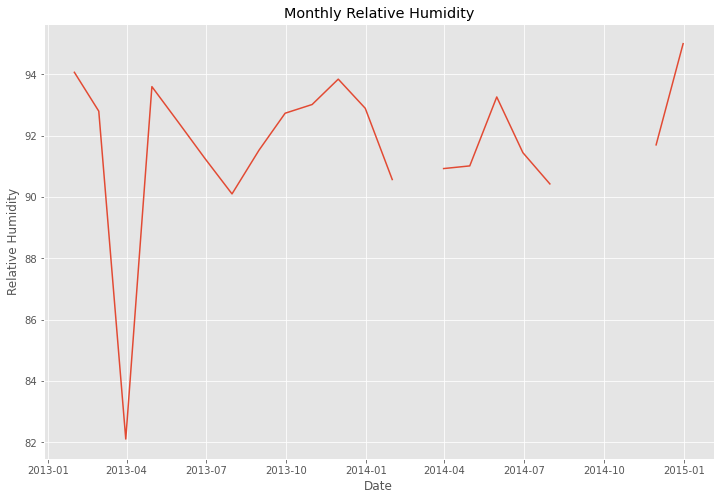

In [58]:
# Monthly seasonal variation for Relative humidity
# Resample data to monthly frequency
monthly_data = dff['rel_humidity'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Relative Humidity')
plt.title('Monthly Relative Humidity')
plt.show()


### Observation
The maximum average value of the relative humidity is 95.1% in the month December 2014 and its minimum average value of the relative humidity is 82.1% in the month of March 2013.

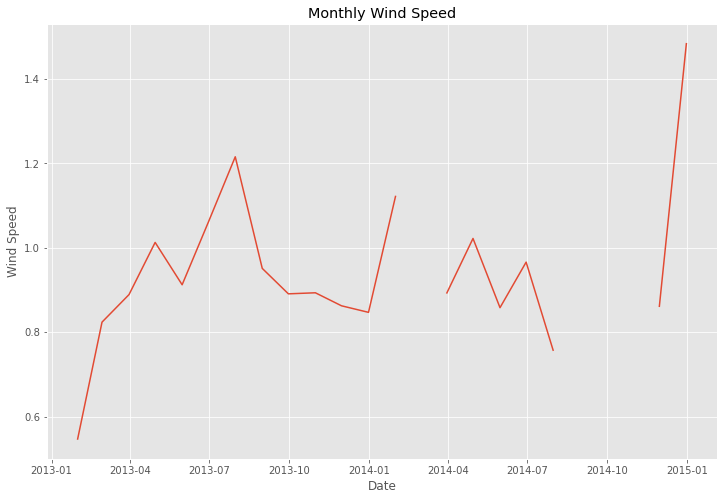

In [59]:
# Monthly seasonal variation for Wind speed
# Resample data to monthly frequency
monthly_data = dff['wind_speed'].resample('M').mean()

# Plot monthly data
plt.plot(monthly_data)
plt.xlabel('Date')
plt.ylabel('Wind Speed')
plt.title('Monthly Wind Speed')
plt.show()

### Observation
The maximum average value of the wind speed is 1.52m/s in the month December 2014 and its minimum average value of the wind speed is 0.4m/s in the month of February 2013.

## Monthy Seasonal Variation for the parameters for 2013

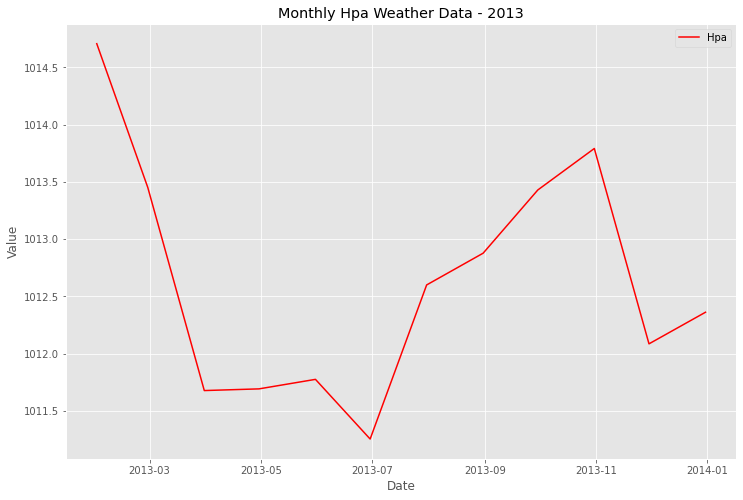

In [69]:
# Filter the DataFrame to select only rows with index in 2013
df_2013 = dff[dff.index.year == 2013]

# Resample data to monthly frequency
monthly_data = df_2013.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['Hpa'], color='red', label='Hpa')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Hpa Weather Data - 2013')
plt.legend()
plt.show()

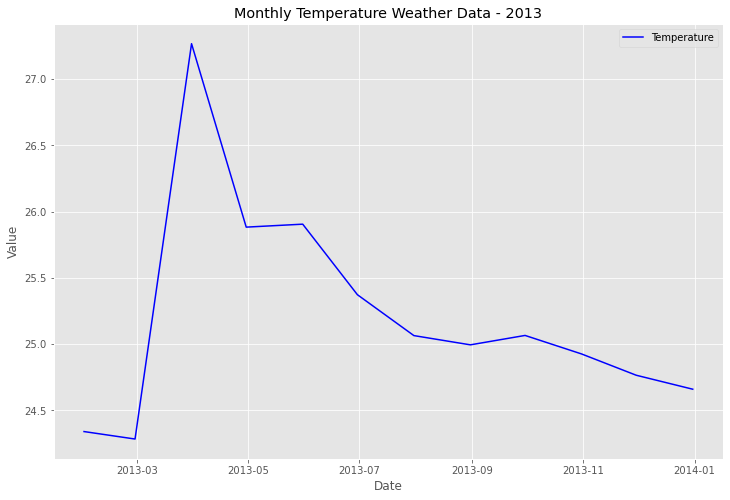

In [70]:
# Filter the DataFrame to select only rows with index in 2013
df_2013 = dff[dff.index.year == 2013]

# Resample data to monthly frequency
monthly_data = df_2013.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['Temp'], color='blue', label='Temperature')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Temperature Weather Data - 2013')
plt.legend()
plt.show()


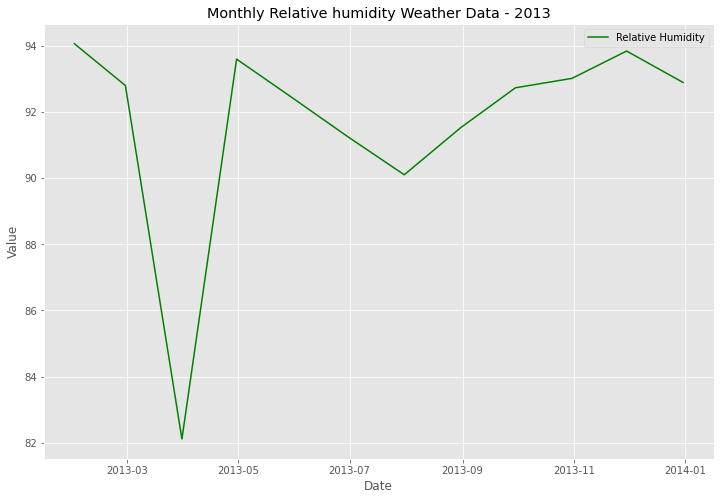

In [71]:
# Filter the DataFrame to select only rows with index in 2013
df_2013 = dff[dff.index.year == 2013]

# Resample data to monthly frequency
monthly_data = df_2013.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['rel_humidity'], color='green', label='Relative Humidity')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Relative humidity Weather Data - 2013')
plt.legend()
plt.show()


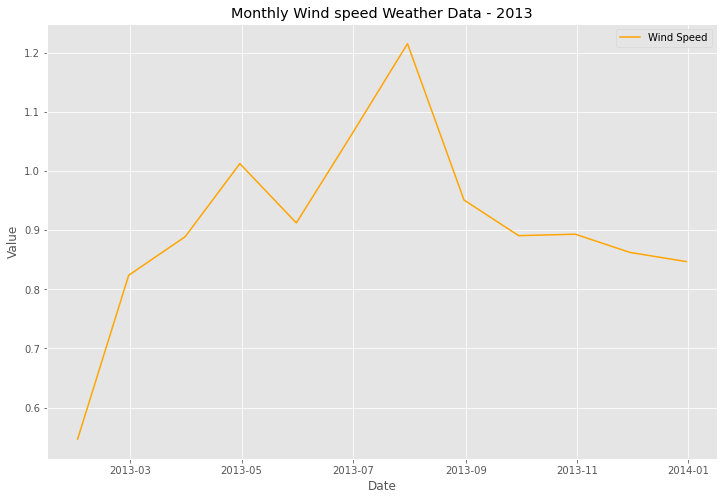

In [72]:
# Filter the DataFrame to select only rows with index in 2013
df_2013 = dff[dff.index.year == 2013]

# Resample data to monthly frequency
monthly_data = df_2013.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['wind_speed'], color='orange', label='Wind Speed')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Wind speed Weather Data - 2013')
plt.legend()
plt.show()


## Monthy Seasonal Variation for the parameters for 2014

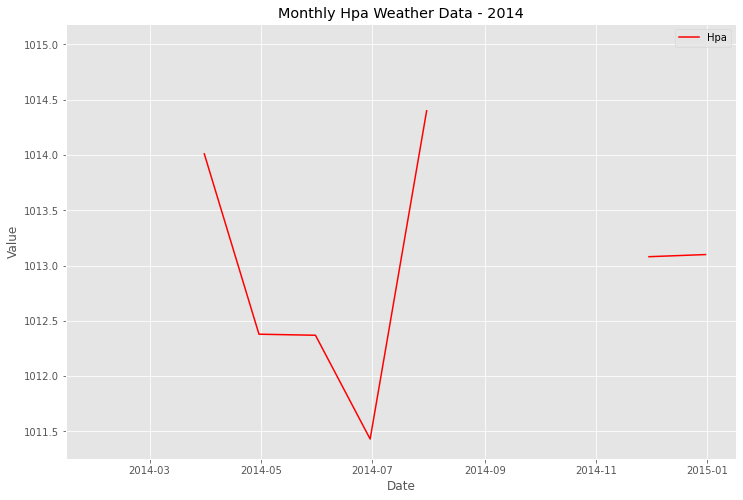

In [73]:
# Filter the DataFrame to select only rows with index in 2013
df_2014 = dff[dff.index.year == 2014]

# Resample data to monthly frequency
monthly_data = df_2014.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['Hpa'], color='red', label='Hpa')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Hpa Weather Data - 2014')
plt.legend()
plt.show()

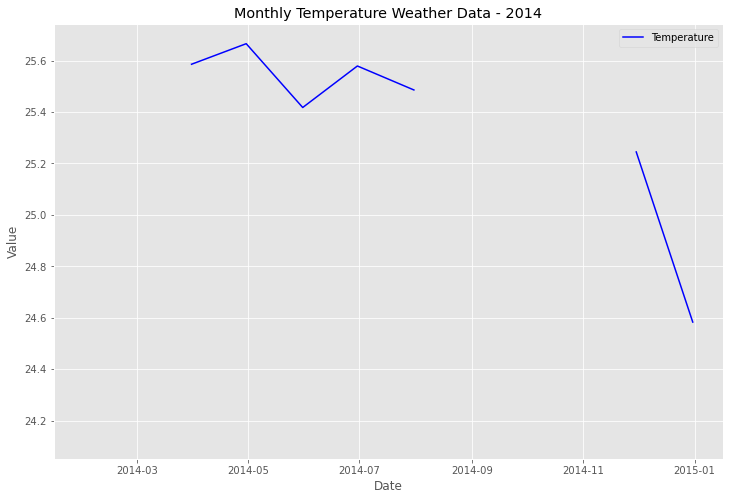

In [74]:
# Filter the DataFrame to select only rows with index in 2013
df_2014 = dff[dff.index.year == 2014]

# Resample data to monthly frequency
monthly_data = df_2014.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['Temp'], color='blue', label='Temperature')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Temperature Weather Data - 2014')
plt.legend()
plt.show()


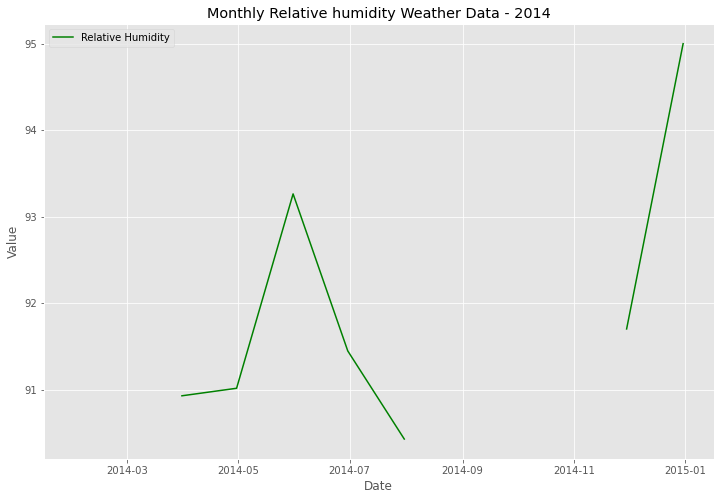

In [75]:
# Filter the DataFrame to select only rows with index in 2013
df_2014 = dff[dff.index.year == 2014]

# Resample data to monthly frequency
monthly_data = df_2014.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['rel_humidity'], color='green', label='Relative Humidity')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Relative humidity Weather Data - 2014')
plt.legend()
plt.show()


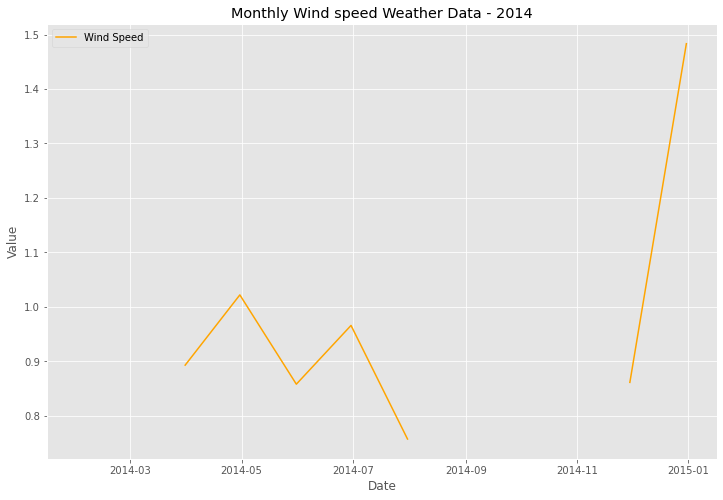

In [76]:
# Filter the DataFrame to select only rows with index in 2013
df_2014 = dff[dff.index.year == 2014]

# Resample data to monthly frequency
monthly_data = df_2014.resample('M').mean()

# Plot monthly data for each variable with different line colors
plt.plot(monthly_data['wind_speed'], color='orange', label='Wind Speed')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Monthly Wind speed Weather Data - 2014')
plt.legend()
plt.show()


## Daily Seasonal Variation for all the Parameters in a Month of May 2013

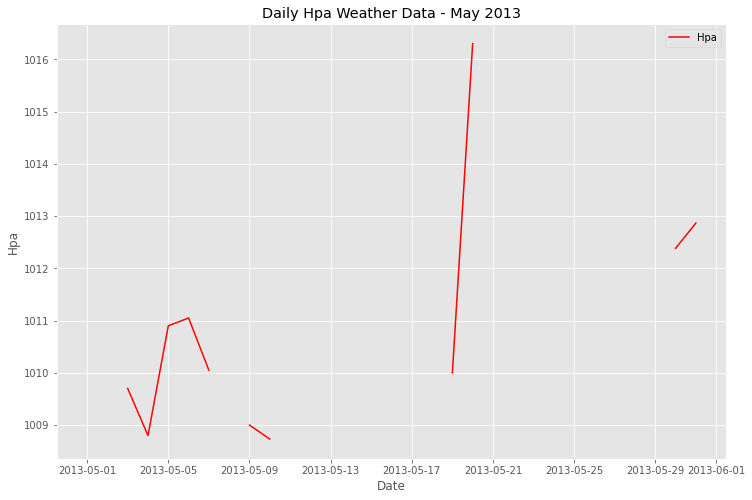

In [93]:
# Select only rows with index in May 2013
df_may_2013 = dff.loc['2013-05']

# Resample data to daily frequency
daily_data = df_may_2013.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['Hpa'], color='red', label='Hpa')

plt.xlabel('Date')
plt.ylabel('Hpa')
plt.title('Daily Hpa Weather Data - May 2013')
plt.legend()
plt.show()

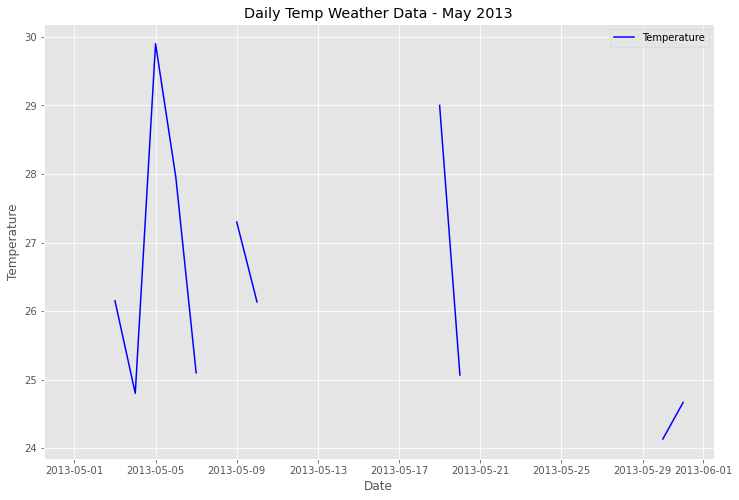

In [92]:
# Select only rows with index in May 2013
df_may_2013 = dff.loc['2013-05']

# Resample data to daily frequency
daily_data = df_may_2013.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['Temp'], color='blue', label='Temperature')

plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Daily Temp Weather Data - May 2013')
plt.legend()
plt.show()

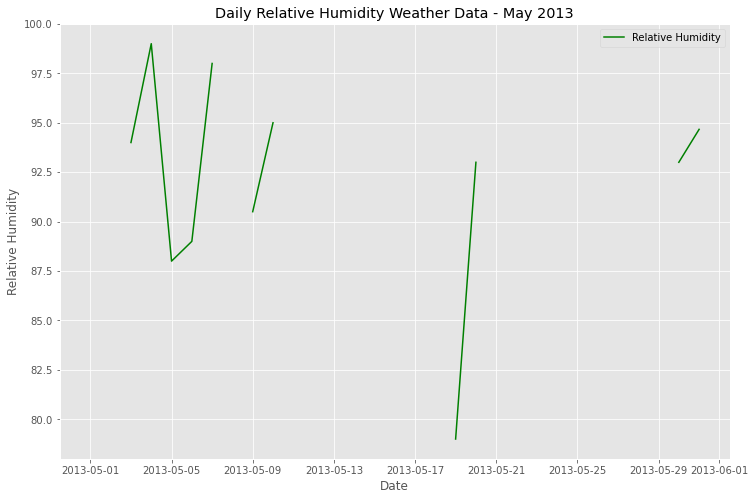

In [91]:
# Select only rows with index in May 2013
df_may_2013 = dff.loc['2013-05']

# Resample data to daily frequency
daily_data = df_may_2013.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['rel_humidity'], color='green', label='Relative Humidity')

plt.xlabel('Date')
plt.ylabel('Relative Humidity')
plt.title('Daily Relative Humidity Weather Data - May 2013')
plt.legend()
plt.show()

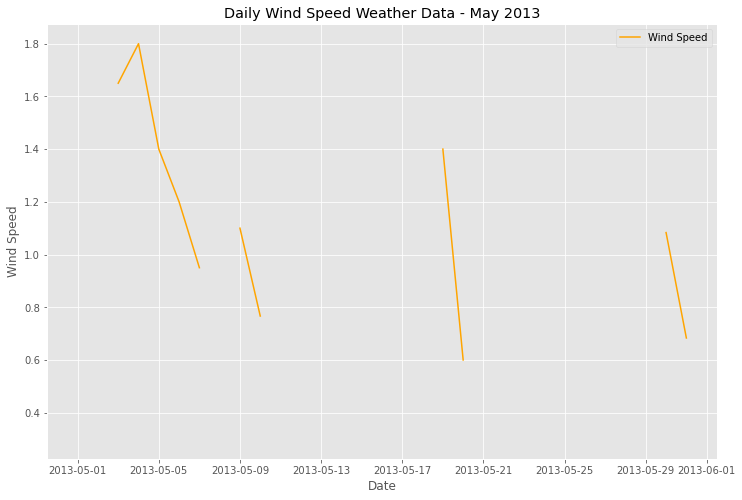

In [94]:
# Select only rows with index in May 2013
df_may_2013 = dff.loc['2013-05']

# Resample data to daily frequency
daily_data = df_may_2013.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['wind_speed'], color='orange', label='Wind Speed')

plt.xlabel('Date')
plt.ylabel('Wind Speed')
plt.title('Daily Wind Speed Weather Data - May 2013')
plt.legend()
plt.show()

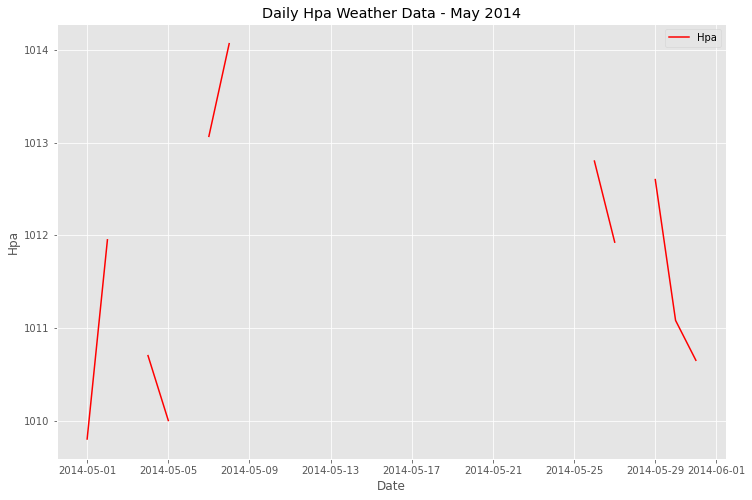

In [95]:
# Select only rows with index in May 2013
df_may_2014 = dff.loc['2014-05']

# Resample data to daily frequency
daily_data = df_may_2014.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['Hpa'], color='red', label='Hpa')

plt.xlabel('Date')
plt.ylabel('Hpa')
plt.title('Daily Hpa Weather Data - May 2014')
plt.legend()
plt.show()

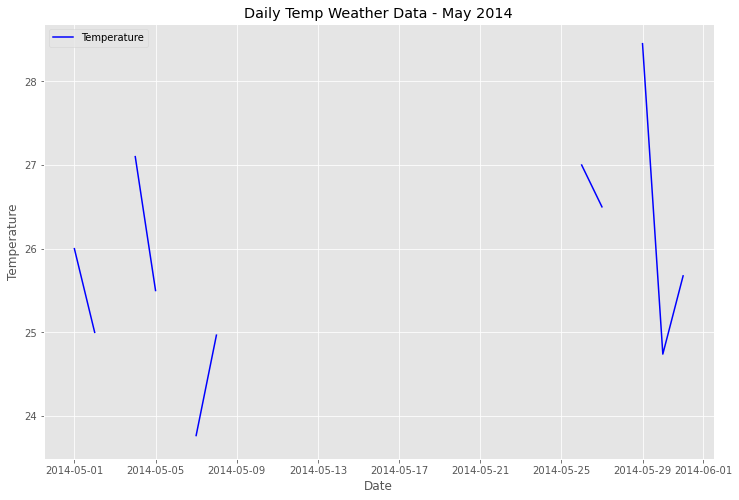

In [96]:
# Select only rows with index in May 2013
df_may_2014 = dff.loc['2014-05']

# Resample data to daily frequency
daily_data = df_may_2014.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['Temp'], color='blue', label='Temperature')

plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Daily Temp Weather Data - May 2014')
plt.legend()
plt.show()

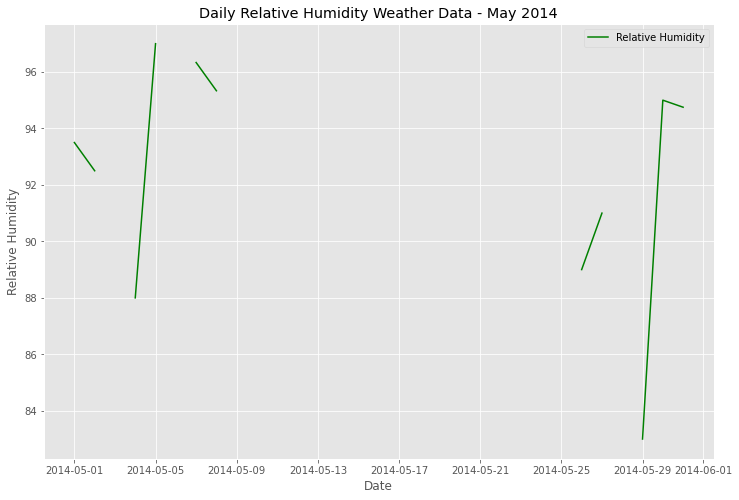

In [97]:
# Select only rows with index in May 2013
df_may_2014 = dff.loc['2014-05']

# Resample data to daily frequency
daily_data = df_may_2014.resample('D').mean()

# Plot daily data for each variable with different line colors
plt.plot(daily_data['rel_humidity'], color='green', label='Relative Humidity')

plt.xlabel('Date')
plt.ylabel('Relative Humidity')
plt.title('Daily Relative Humidity Weather Data - May 2014')
plt.legend()
plt.show()

## Inspecting the Distribution for each parameter hourly

In [98]:
dff.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
datetime,,,,,,,,,,,,
2013-01-01 06:00:00,2013,1,1,6,1012.9,22.9,22.0,95.0,320.0,0.6,35.0,0.5
2013-01-02 15:00:00,2013,1,2,15,1012.0,27.3,24.6,85.0,110.0,0.5,17.0,1.6
2013-01-02 23:00:00,2013,1,2,23,1015.8,24.4,23.9,97.0,170.0,0.5,22.0,2.3
2013-01-03 01:00:00,2013,1,3,1,1015.6,24.0,23.6,98.0,320.0,0.5,60.0,7.4
2013-01-03 02:00:00,2013,1,3,2,1014.9,23.7,23.0,96.0,290.0,0.6,60.0,8.0


In [99]:
# Reset datetime column as index
dff.reset_index('datetime', inplace=True)

In [100]:
dff.head()

,datetime,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2013-01-01 06:00:00,2013,1,1,6,1012.9,22.9,22.0,95.0,320.0,0.6,35.0,0.5
1,2013-01-02 15:00:00,2013,1,2,15,1012.0,27.3,24.6,85.0,110.0,0.5,17.0,1.6
2,2013-01-02 23:00:00,2013,1,2,23,1015.8,24.4,23.9,97.0,170.0,0.5,22.0,2.3
3,2013-01-03 01:00:00,2013,1,3,1,1015.6,24.0,23.6,98.0,320.0,0.5,60.0,7.4
4,2013-01-03 02:00:00,2013,1,3,2,1014.9,23.7,23.0,96.0,290.0,0.6,60.0,8.0


#### Distribution of Hpa Hourly

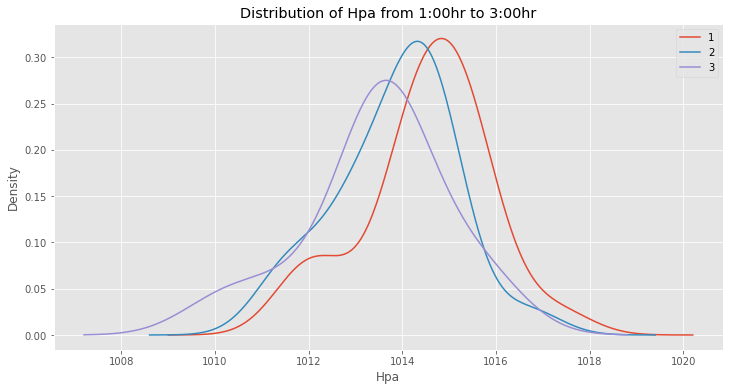

In [115]:
# Filter the data for hours 1 to 3 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 1) & (dff['datetime'].dt.hour <= 3)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['Hpa'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Hpa')
plt.ylabel('Density')
plt.title('Distribution of Hpa from 1:00hr to 3:00hr')
plt.show()

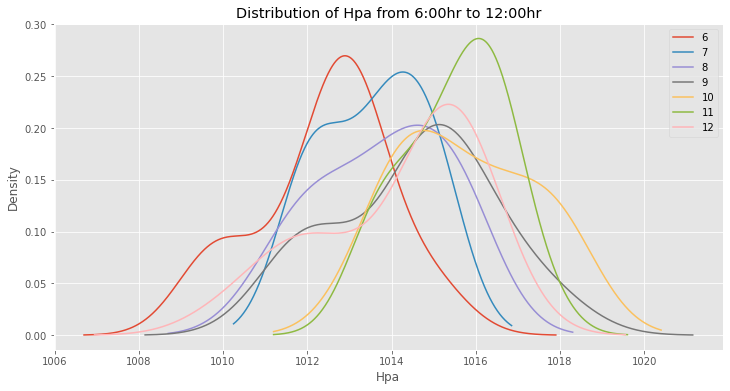

In [111]:
# Filter the data for hours 6 to 12 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 6) & (dff['datetime'].dt.hour <= 12)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['Hpa'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Hpa')
plt.ylabel('Density')
plt.title('Distribution of Hpa from 6:00hr to 12:00hr')
plt.show()


The kernel density estimate (KDE) plot shows the shape of the distribution of Hpa values at each hour of the day, but it doesn't tell us the exact type of distribution.

However, we can make some general observations about the shape of the KDE plot. It appears that the distribution of Hpa values is roughly bell-shaped and unimodal for most hours of the day, with some variation in the spread and skewness of the distribution across different hours. **This suggests that the underlying distribution may be normal or Gaussian**, but other distributions with similar shapes (e.g. t-distribution) may also be possible.

In [132]:
from scipy.stats import shapiro

# Perform Shapiro-Wilk test on Hpa data
stat, p = shapiro(dff['Hpa'])

# Print test statistic and p-value
print('Shapiro-Wilk test statistic:', round(stat, 3))
print('p-value:', round(p, 3))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Hpa data is normally distributed (fail to reject H0)')
else:
    print('Hpa data is not normally distributed (reject H0)')


Shapiro-Wilk test statistic: 0.995
p-value: 0.003
Hpa data is not normally distributed (reject H0)


Finally, we interpret the test result by comparing the p-value to a chosen significance level (e.g. 0.05). If the p-value is greater than the significance level, we fail to reject the null hypothesis that the data is normally distributed. If the p-value is less than or equal to the significance level, we reject the null hypothesis and conclude that the **Hpa data is not normally distributed.**

## To fit a lognormal or gamma distribution

The fitted lognormal or gamma distribution can be used to describe the underlying probability distribution of the Hpa data. The fitted distribution can be used to estimate the probability of observing different Hpa values and to generate random samples that follow the same distribution as the observed data.

The fitted lognormal or gamma distribution is plotted along with a histogram of the Hpa data to visually compare the shape of the two distributions. If the fitted distribution closely matches the shape of the histogram, it suggests that the observed data may follow a lognormal or gamma distribution, respectively.

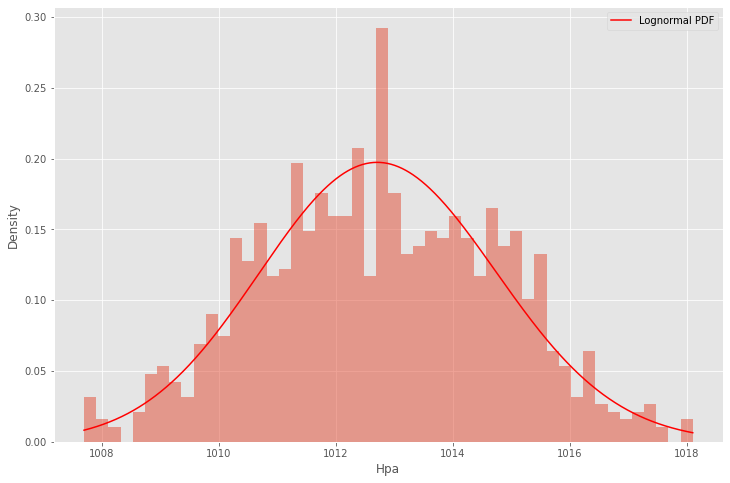

In [138]:
# from scipy.stats import lognorm

# Fit lognormal distribution to Hpa data
params = lognorm.fit(dff['Hpa'])

# Generate PDF of lognormal distribution with fitted parameters
pdf_x = np.linspace(dff['Hpa'].min(), dff['Hpa'].max(), 1000)
pdf_y = lognorm.pdf(pdf_x, *params)

# Plot PDF of lognormal distribution with fitted parameters
plt.hist(dff['Hpa'], bins=50, density=True, alpha=0.5)
plt.plot(pdf_x, pdf_y, 'r-', label='Lognormal PDF')
plt.xlabel('Hpa')
plt.ylabel('Density')
plt.legend()
plt.show()


To further quantify the goodness-of-fit of the fitted distribution, you can use statistical tests such as the Kolmogorov-Smirnov (KS) test or Anderson-Darling (AD) test to compare the observed data to the fitted distribution. These tests can provide a p-value that indicates the probability of observing the data if it were drawn from the fitted distribution. A high p-value (e.g. > 0.05) suggests that the observed data is consistent with the fitted distribution, while a low p-value (e.g. <= 0.05) suggests that the observed data is unlikely to be drawn from the fitted distribution and may require a different distributional model.

### The Kolmogorov-Smirnov (KS) and Chi-Squared test to compare the observed Hpa data to the fitted lognormal distribution

In [139]:
from scipy.stats import kstest, lognorm

# Fit lognormal distribution to Hpa data
params = lognorm.fit(dff['Hpa'])

# Perform KS test on Hpa data and fitted lognormal distribution
stat, p = kstest(dff['Hpa'], 'lognorm', args=params)

# Print test statistic and p-value
print('KS test statistic:', round(stat, 3))
print('p-value:', round(p, 3))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

KS test statistic: 0.038
p-value: 0.141
Observed data is consistent with lognormal distribution (fail to reject H0)


In [151]:
import scipy.stats as stats

# Fit lognormal distribution to Hpa data
params = lognorm.fit(dff['Hpa'])

# Generate lognormal distribution with fitted parameters
ln_dist = lognorm(*params)

# Perform Chi-Squared test on Hpa data and lognormal distribution
hist, bin_edges = np.histogram(dff['Hpa'], bins='auto', density=True)
expected_freq = ln_dist.cdf(bin_edges[:-1]) - ln_dist.cdf(bin_edges[1:])
chi2, p_value = stats.chisquare(hist, f_exp=expected_freq)

# Print test statistic and p-value
print('Chi-Squared test statistic:', round(chi2, 3))
print('p-value:', p_value)

# Interpret test result
alpha = 0.05
if p_value > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')


Chi-Squared test statistic: -7.019
p-value: 1.0
Observed data is consistent with lognormal distribution (fail to reject H0)


The Chi-Squared test is performed by comparing the observed frequencies (hist) with the expected frequencies (expected_freq). The expected frequencies are obtained by calculating the cumulative probabilities of the lognormal distribution at the bin edges.

The stats.chisquare() function from scipy.stats is used to calculate the Chi-Squared test statistic and the p-value. The test statistic and p-value are then printed, followed by the interpretation of the test result.

#### Distribution of Temp hourly

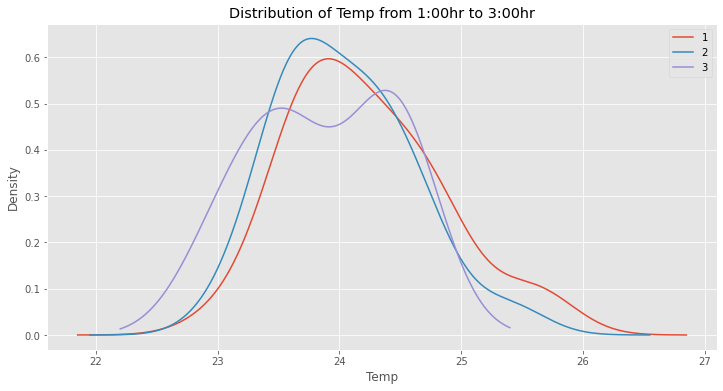

In [116]:
# Filter the data for hours 1 to 3 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 1) & (dff['datetime'].dt.hour <= 3)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['Temp'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Temp')
plt.ylabel('Density')
plt.title('Distribution of Temp from 1:00hr to 3:00hr')
plt.show()

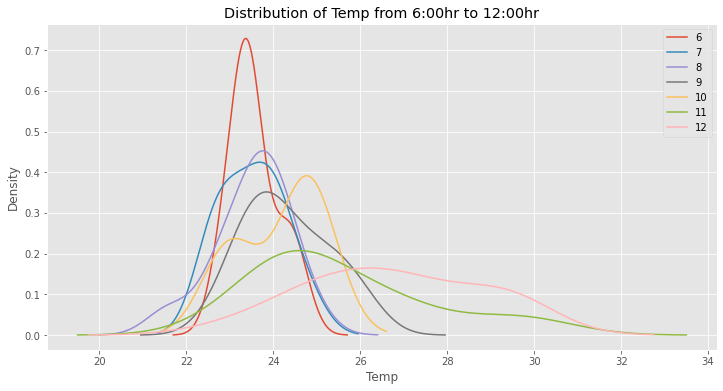

In [117]:
# Filter the data for hours 6 to 12 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 6) & (dff['datetime'].dt.hour <= 12)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['Temp'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Temp')
plt.ylabel('Density')
plt.title('Distribution of Temp from 6:00hr to 12:00hr')
plt.show()

In [131]:
# Perform Shapiro-Wilk test on Hpa data
stat, p = shapiro(dff['Temp'])

# Print test statistic and p-value
print('Shapiro-Wilk test statistic:', round(stat, 3))
print('p-value:', round(p, 3))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Temp data is normally distributed (fail to reject H0)')
else:
    print('Temp data is not normally distributed (reject H0)')


Shapiro-Wilk test statistic: 0.908
p-value: 0.0
Temp data is not normally distributed (reject H0)


Finally, we interpret the test result by comparing the p-value to a chosen significance level (e.g. 0.05). If the p-value is greater than the significance level, we fail to reject the null hypothesis that the data is normally distributed. If the p-value is 0 which less than the significance level, we reject the null hypothesis and conclude that the **Temp data is not normally distributed.**

## To fit a lognormal or gamma distribution

The fitted lognormal or gamma distribution can be used to describe the underlying probability distribution of the Hpa data. The fitted distribution can be used to estimate the probability of observing different Hpa values and to generate random samples that follow the same distribution as the observed data.

The fitted lognormal or gamma distribution is plotted along with a histogram of the Hpa data to visually compare the shape of the two distributions. If the fitted distribution closely matches the shape of the histogram, it suggests that the observed data may follow a lognormal or gamma distribution, respectively.

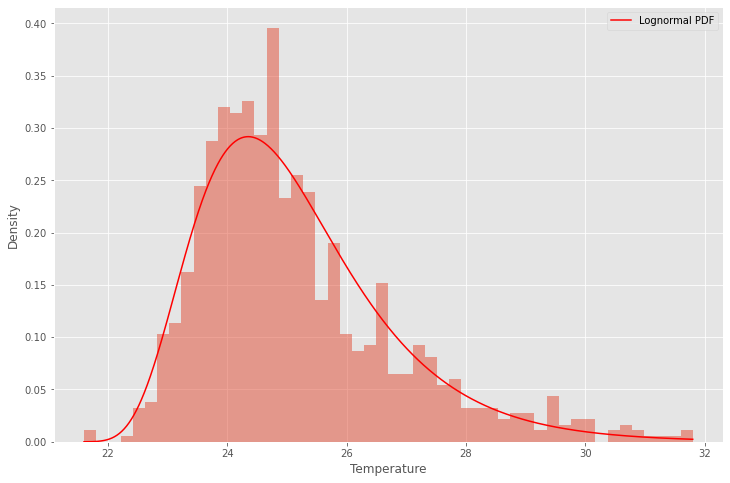

In [153]:
from scipy.stats import lognorm

# Fit lognormal distribution to Temperature data
params = lognorm.fit(dff['Temp'])

# Generate PDF of lognormal distribution with fitted parameters
pdf_x = np.linspace(dff['Temp'].min(), dff['Temp'].max(), 1000)
pdf_y = lognorm.pdf(pdf_x, *params)

# Plot PDF of lognormal distribution with fitted parameters
plt.hist(dff['Temp'], bins=50, density=True, alpha=0.5)
plt.plot(pdf_x, pdf_y, 'r-', label='Lognormal PDF')
plt.xlabel('Temperature')
plt.ylabel('Density')
plt.legend()
plt.show()

### The Kolmogorov-Smirnov (KS) and Chi-Squared test to compare the observed Temperature data to the fitted lognormal distribution

In [154]:
from scipy.stats import kstest, lognorm

# Fit lognormal distribution to Hpa data
params = lognorm.fit(dff['Temp'])

# Perform KS test on Hpa data and fitted lognormal distribution
stat, p = kstest(dff['Temp'], 'lognorm', args=params)

# Print test statistic and p-value
print('KS test statistic:', round(stat, 3))
print('p-value:', round(p, 3))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

KS test statistic: 0.058
p-value: 0.005
Observed data is not consistent with lognormal distribution (reject H0)


In [157]:
import scipy.stats as stats

# Fit lognormal distribution to Temperature data
params = lognorm.fit(dff['Temp'])

# Generate lognormal distribution with fitted parameters
ln_dist = lognorm(*params)

# Perform Chi-Squared test on Temperature data and lognormal distribution
hist, bin_edges = np.histogram(dff['Temp'], bins='auto', density=True)
expected_freq = ln_dist.cdf(bin_edges[:-1]) - ln_dist.cdf(bin_edges[1:])
chi2, p_value = stats.chisquare(hist, f_exp=expected_freq)

# Print test statistic and p-value
print('Chi-Squared test statistic:', round(chi2, 3))
print('p-value:', p_value)

# Interpret test result
alpha = 0.05
if p_value > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

Chi-Squared test statistic: -14.751
p-value: 1.0
Observed data is consistent with lognormal distribution (fail to reject H0)


The Chi-Squared test is performed by comparing the observed frequencies (hist) with the expected frequencies (expected_freq). The expected frequencies are obtained by calculating the cumulative probabilities of the lognormal distribution at the bin edges.

The stats.chisquare() function from scipy.stats is used to calculate the Chi-Squared test statistic and the p-value. The test statistic and p-value are then printed, followed by the interpretation of the test result.

#### Distribution of Relative humidity Hourly

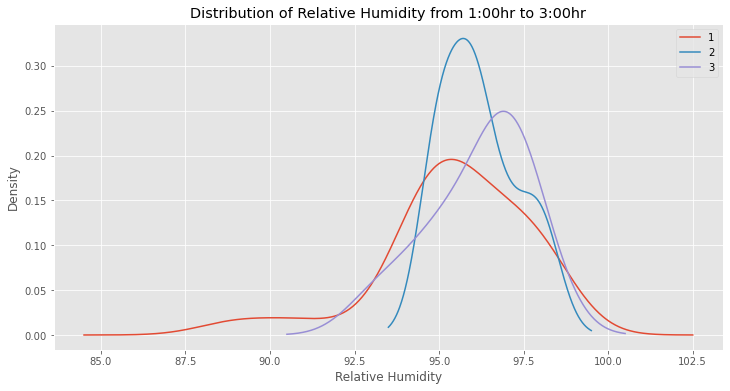

In [126]:
# Filter the data for hours 1 to 3 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 1) & (dff['datetime'].dt.hour <= 3)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['rel_humidity'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Relative Humidity')
plt.ylabel('Density')
plt.title('Distribution of Relative Humidity from 1:00hr to 3:00hr')
plt.show()

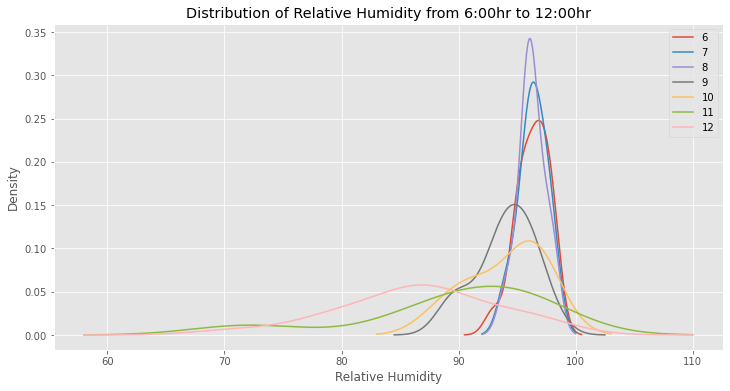

In [127]:
# Filter the data for hours 6 to 12 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 6) & (dff['datetime'].dt.hour <= 12)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['rel_humidity'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Relative Humidity')
plt.ylabel('Density')
plt.title('Distribution of Relative Humidity from 6:00hr to 12:00hr')
plt.show()

In [130]:
# Perform Shapiro-Wilk test on Relative Humidity data
stat, p = shapiro(dff['rel_humidity'])

# Print test statistic and p-value
print('Shapiro-Wilk test statistic:', round(stat, 3))
print('p-value:', round(p, 4))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Relative  humidity is normally distributed (fail to reject H0)')
else:
    print('Relative humidity data is not normally distributed (reject H0)')

Shapiro-Wilk test statistic: 0.792
p-value: 0.0
Relative humidity data is not normally distributed (reject H0)


Finally, we interpret the test result by comparing the p-value to a chosen significance level (e.g. 0.05). If the p-value is greater than the significance level, we fail to reject the null hypothesis that the data is normally distributed. If the p-value is 0 which less than the significance level, we reject the null hypothesis and conclude that the **Relative Humidity data is not normally distributed.**

## To fit a lognormal or gamma distribution

The fitted lognormal or gamma distribution can be used to describe the underlying probability distribution of the Hpa data. The fitted distribution can be used to estimate the probability of observing different Hpa values and to generate random samples that follow the same distribution as the observed data.

The fitted lognormal or gamma distribution is plotted along with a histogram of the Hpa data to visually compare the shape of the two distributions. If the fitted distribution closely matches the shape of the histogram, it suggests that the observed data may follow a lognormal or gamma distribution, respectively.

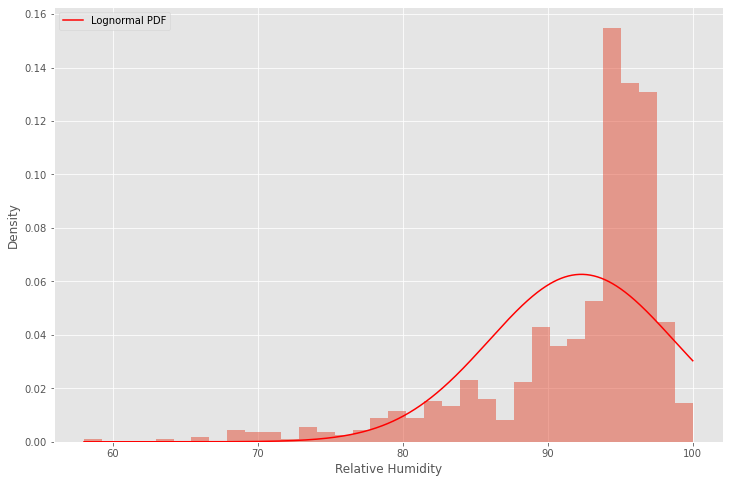

In [159]:
from scipy.stats import lognorm

# Fit lognormal distribution to Relative humidity data
params = lognorm.fit(dff['rel_humidity'])

# Generate PDF of lognormal distribution with fitted parameters
pdf_x = np.linspace(dff['rel_humidity'].min(), dff['rel_humidity'].max(), 1000)
pdf_y = lognorm.pdf(pdf_x, *params)

# Plot PDF of lognormal distribution with fitted parameters
plt.hist(dff['rel_humidity'], bins='auto', density=True, alpha=0.5)
plt.plot(pdf_x, pdf_y, 'r-', label='Lognormal PDF')
plt.xlabel('Relative Humidity')
plt.ylabel('Density')
plt.legend()
plt.show()

To further quantify the goodness-of-fit of the fitted distribution, you can use statistical tests such as the Kolmogorov-Smirnov (KS) test or Anderson-Darling (AD) test to compare the observed data to the fitted distribution. These tests can provide a p-value that indicates the probability of observing the data if it were drawn from the fitted distribution. A high p-value (e.g. > 0.05) suggests that the observed data is consistent with the fitted distribution, while a low p-value (e.g. <= 0.05) suggests that the observed data is unlikely to be drawn from the fitted distribution and may require a different distributional model.

### The Kolmogorov-Smirnov (KS) and Chi-Squared test to compare the observed Relative Humidity data to the fitted lognormal distribution

In [160]:
from scipy.stats import kstest, lognorm

# Fit lognormal distribution to Relative humidity data
params = lognorm.fit(dff['rel_humidity'])

# Perform KS test on Relative humidity data and fitted lognormal distribution
stat, p = kstest(dff['rel_humidity'], 'lognorm', args=params)

# Print test statistic and p-value
print('KS test statistic:', round(stat, 3))
print('p-value:', round(p, 3))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

KS test statistic: 0.199
p-value: 0.0
Observed data is not consistent with lognormal distribution (reject H0)


In [161]:
import scipy.stats as stats

# Fit lognormal distribution to Relative humidity data
params = lognorm.fit(dff['rel_humidity'])

# Generate lognormal distribution with fitted parameters
ln_dist = lognorm(*params)

# Perform Chi-Squared test on Hpa data and lognormal distribution
hist, bin_edges = np.histogram(dff['rel_humidity'], bins='auto', density=True)
expected_freq = ln_dist.cdf(bin_edges[:-1]) - ln_dist.cdf(bin_edges[1:])
chi2, p_value = stats.chisquare(hist, f_exp=expected_freq)

# Print test statistic and p-value
print('Chi-Squared test statistic:', round(chi2, 3))
print('p-value:', p_value)

# Interpret test result
alpha = 0.05
if p_value > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

Chi-Squared test statistic: -19.663
p-value: 1.0
Observed data is consistent with lognormal distribution (fail to reject H0)


The Chi-Squared test is performed by comparing the observed frequencies (hist) with the expected frequencies (expected_freq). The expected frequencies are obtained by calculating the cumulative probabilities of the lognormal distribution at the bin edges.

The stats.chisquare() function from scipy.stats is used to calculate the Chi-Squared test statistic and the p-value. The test statistic and p-value are then printed, followed by the interpretation of the test result.

#### Distribution of Wind Speed Hourly

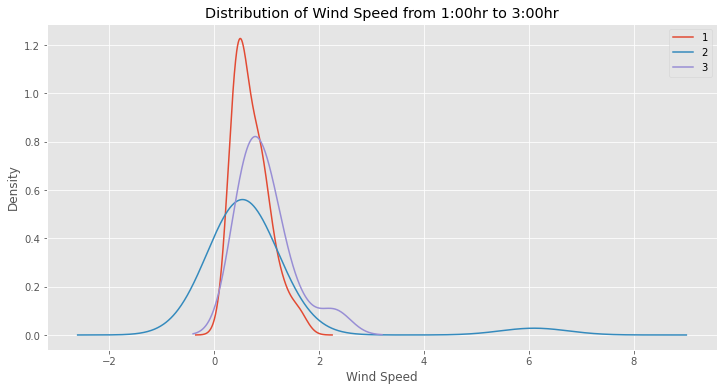

In [133]:
# Filter the data for hours 1 to 3 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 1) & (dff['datetime'].dt.hour <= 3)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['wind_speed'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Wind Speed')
plt.ylabel('Density')
plt.title('Distribution of Wind Speed from 1:00hr to 3:00hr')
plt.show()

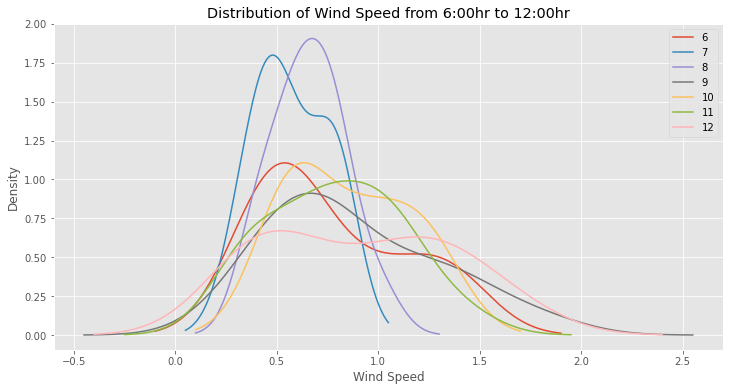

In [134]:
# Filter the data for hours 6 to 12 (inclusive)
hourly_data = dff.loc[(dff['datetime'].dt.hour >= 6) & (dff['datetime'].dt.hour <= 12)].groupby(dff['datetime'].dt.hour)

# Plot distribution curve for relative humidity at each hour of the day
hourly_data['wind_speed'].plot(kind='density', legend=True, figsize=(12, 6))

plt.xlabel('Wind Speed')
plt.ylabel('Density')
plt.title('Distribution of Wind Speed from 6:00hr to 12:00hr')
plt.show()

In [152]:
# Perform Shapiro-Wilk test on Wind speed data
stat, p = shapiro(dff['wind_speed'])

# Print test statistic and p-value
print('Shapiro-Wilk test statistic:', round(stat, 3))
print('p-value:', round(p, 4))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Wind Speed is normally distributed (fail to reject H0)')
else:
    print('Wind Speed data is not normally distributed (reject H0)')


Shapiro-Wilk test statistic: 0.634
p-value: 0.0
Wind Speed data is not normally distributed (reject H0)


Finally, we interpret the test result by comparing the p-value to a chosen significance level (e.g. 0.05). If the p-value is greater than the significance level, we fail to reject the null hypothesis that the data is normally distributed. If the p-value is 0 which less than the significance level, we reject the null hypothesis and conclude that the **Wind speed data is not normally distributed.**

## To fit a lognormal or gamma distribution

The fitted lognormal or gamma distribution can be used to describe the underlying probability distribution of the Wind speed data. The fitted distribution can be used to estimate the probability of observing different Hpa values and to generate random samples that follow the same distribution as the observed data.

The fitted lognormal or gamma distribution is plotted along with a histogram of the Hpa data to visually compare the shape of the two distributions. If the fitted distribution closely matches the shape of the histogram, it suggests that the observed data may follow a lognormal or gamma distribution, respectively.

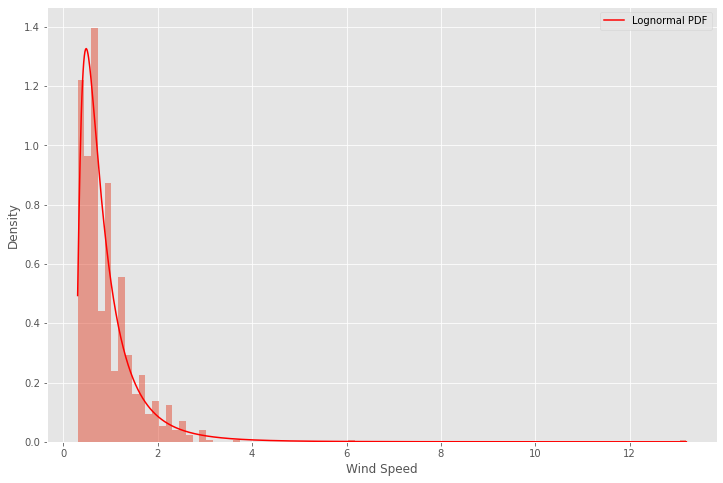

In [164]:
from scipy.stats import lognorm

# Fit lognormal distribution to Wind speed data
params = lognorm.fit(dff['wind_speed'])

# Generate PDF of lognormal distribution with fitted parameters
pdf_x = np.linspace(dff['wind_speed'].min(), dff['wind_speed'].max(), 1000)
pdf_y = lognorm.pdf(pdf_x, *params)

# Plot PDF of lognormal distribution with fitted parameters
plt.hist(dff['wind_speed'], bins='auto', density=True, alpha=0.5)
plt.plot(pdf_x, pdf_y, 'r-', label='Lognormal PDF')
plt.xlabel('Wind Speed')
plt.ylabel('Density')
plt.legend()
plt.show()

To further quantify the goodness-of-fit of the fitted distribution, you can use statistical tests such as the Kolmogorov-Smirnov (KS) test or Anderson-Darling (AD) test to compare the observed data to the fitted distribution. These tests can provide a p-value that indicates the probability of observing the data if it were drawn from the fitted distribution. A high p-value (e.g. > 0.05) suggests that the observed data is consistent with the fitted distribution, while a low p-value (e.g. <= 0.05) suggests that the observed data is unlikely to be drawn from the fitted distribution and may require a different distributional model.

### The Kolmogorov-Smirnov (KS) and Chi-Squared test to compare the observed Wind Speed data to the fitted lognormal distribution

In [165]:
from scipy.stats import kstest, lognorm

# Fit lognormal distribution to Wind speed data
params = lognorm.fit(dff['wind_speed'])

# Perform KS test on Wind speed data and fitted lognormal distribution
stat, p = kstest(dff['wind_speed'], 'lognorm', args=params)

# Print test statistic and p-value
print('KS test statistic:', round(stat, 3))
print('p-value:', round(p, 3))

# Interpret test result
alpha = 0.05
if p > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

KS test statistic: 0.08
p-value: 0.0
Observed data is not consistent with lognormal distribution (reject H0)


In [166]:
import scipy.stats as stats

# Fit lognormal distribution to Wind speed data
params = lognorm.fit(dff['wind_speed'])

# Generate lognormal distribution with fitted parameters
ln_dist = lognorm(*params)

# Perform Chi-Squared test on wind speed data and lognormal distribution
hist, bin_edges = np.histogram(dff['wind_speed'], bins='auto', density=True)
expected_freq = ln_dist.cdf(bin_edges[:-1]) - ln_dist.cdf(bin_edges[1:])
chi2, p_value = stats.chisquare(hist, f_exp=expected_freq)

# Print test statistic and p-value
print('Chi-Squared test statistic:', round(chi2, 3))
print('p-value:', p_value)

# Interpret test result
alpha = 0.05
if p_value > alpha:
    print('Observed data is consistent with lognormal distribution (fail to reject H0)')
else:
    print('Observed data is not consistent with lognormal distribution (reject H0)')

Chi-Squared test statistic: -99.413
p-value: 1.0
Observed data is consistent with lognormal distribution (fail to reject H0)


The Chi-Squared test is performed by comparing the observed frequencies (hist) with the expected frequencies (expected_freq). The expected frequencies are obtained by calculating the cumulative probabilities of the lognormal distribution at the bin edges.

The stats.chisquare() function from scipy.stats is used to calculate the Chi-Squared test statistic and the p-value. The test statistic and p-value are then printed, followed by the interpretation of the test result.

## Ploting the distribution of data points of a parameter over a few hours in a day.

In [168]:
dff.head()

,datetime,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2013-01-01 06:00:00,2013,1,1,6,1012.9,22.9,22.0,95.0,320.0,0.6,35.0,0.5
1,2013-01-02 15:00:00,2013,1,2,15,1012.0,27.3,24.6,85.0,110.0,0.5,17.0,1.6
2,2013-01-02 23:00:00,2013,1,2,23,1015.8,24.4,23.9,97.0,170.0,0.5,22.0,2.3
3,2013-01-03 01:00:00,2013,1,3,1,1015.6,24.0,23.6,98.0,320.0,0.5,60.0,7.4
4,2013-01-03 02:00:00,2013,1,3,2,1014.9,23.7,23.0,96.0,290.0,0.6,60.0,8.0


## Moving Averages for Hpa, Temp, Relative Humidity and Wind Speed
- Moving averages are a commonly used technique in time series analysis, which involves analyzing data that changes over time. In machine learning, moving averages can be used to smooth out noisy or erratic data, making it easier to identify trends or patterns. They can also be used as features in machine learning models.

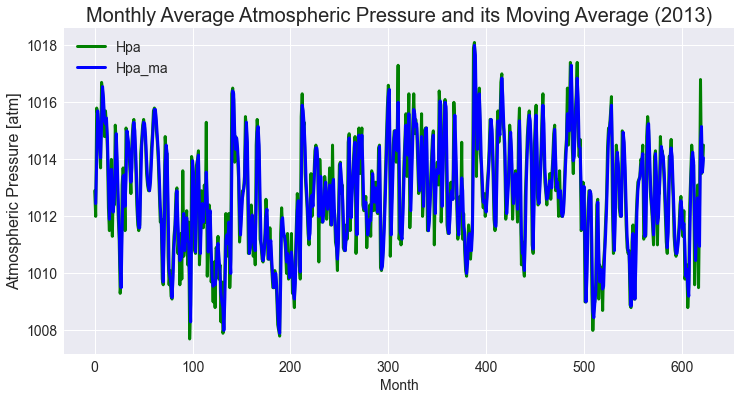

In [218]:
# Select rows where the year is 2013
df_subset = dff.loc[dff['Year'] == 2013]

# Calculate moving average of Temp with window size 2
df_subset['Hpa_ma'] = df_subset['Hpa'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average air temperature and its moving average
df_subset[['Hpa', 'Hpa_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Atmospheric Pressure and its Moving Average (2013)', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Atmospheric Pressure [atm]', fontsize=16)

plt.show()

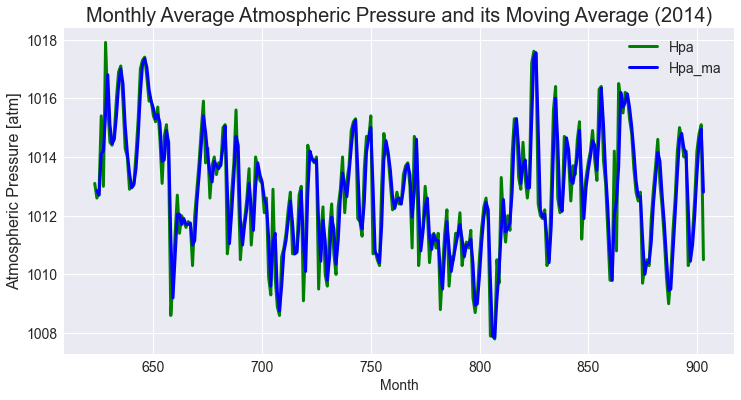

In [215]:
# Select rows where the year is 2014
df_subset = dff.loc[dff['Year'] == 2014]

# Calculate moving average of Temp with window size 2
df_subset['Hpa_ma'] = df_subset['Hpa'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average air temperature and its moving average
df_subset[['Hpa', 'Hpa_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Atmospheric Pressure and its Moving Average (2014)', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Atmospheric Pressure [atm]', fontsize=16)

plt.show()

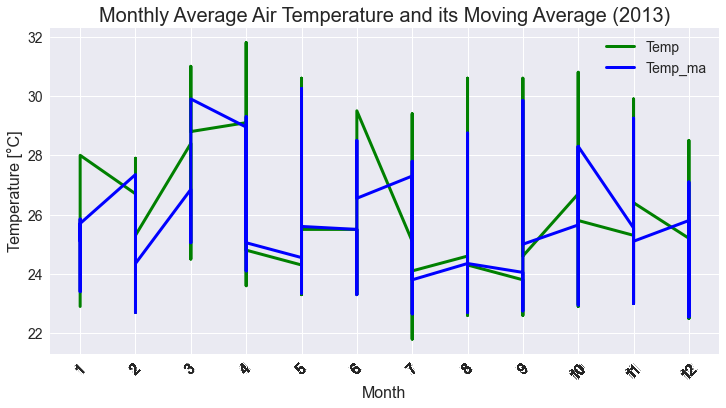

In [193]:
# Select rows where the year is 2013
df_subset = dff.loc[dff['Year'] == 2013]

# Calculate moving average of Temp with window size 2
df_subset['Temp_ma'] = df_subset['Temp'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average air temperature and its moving average
df_subset[['Temp', 'Temp_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size
plt.xticks(df_subset.index, fontsize=14, rotation=45)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Air Temperature and its Moving Average (2013)', fontsize=20)
plt.xlabel('Month', fontsize=16)
plt.ylabel('Temperature [°C]', fontsize=16)

plt.show()


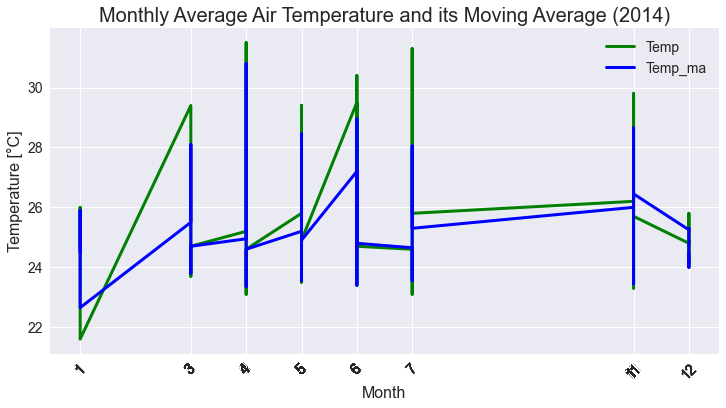

In [194]:
# Select rows where the year is 2014
df_subset = dff.loc[dff['Year'] == 2014]

# Calculate moving average of Temp with window size 2
df_subset['Temp_ma'] = df_subset['Temp'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average air temperature and its moving average
df_subset[['Temp', 'Temp_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size
plt.xticks(df_subset.index, fontsize=14, rotation=45)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Air Temperature and its Moving Average (2014)', fontsize=20)
plt.xlabel('Month', fontsize=16)
plt.ylabel('Temperature [°C]', fontsize=16)

plt.show()

In [202]:
# reset month column
dff.reset_index('Month', inplace=True)

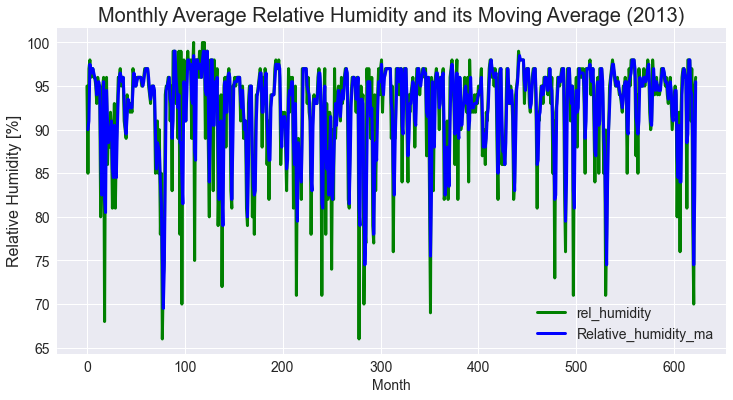

In [224]:
# Select rows where the year is 2013
df_subset = dff.loc[dff['Year'] == 2013]

# Calculate moving average of Hpa with window size 2
df_subset['Relative_humidity_ma'] = df_subset['rel_humidity'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average atmospheric pressure and its moving average
df_subset[['rel_humidity', 'Relative_humidity_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size and label the months on x-axis
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Relative Humidity and its Moving Average (2013)', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Relative Humidity [%]', fontsize=16)

plt.show()

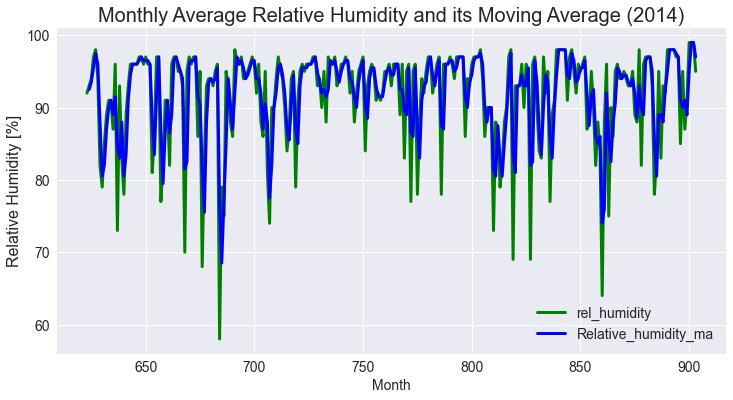

In [226]:
# Select rows where the year is 2014
df_subset = dff.loc[dff['Year'] == 2014]

# Calculate moving average of Hpa with window size 2
df_subset['Relative_humidity_ma'] = df_subset['rel_humidity'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average atmospheric pressure and its moving average
df_subset[['rel_humidity', 'Relative_humidity_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size and label the months on x-axis
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Relative Humidity and its Moving Average (2014)', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Relative Humidity [%]', fontsize=16)

plt.show()

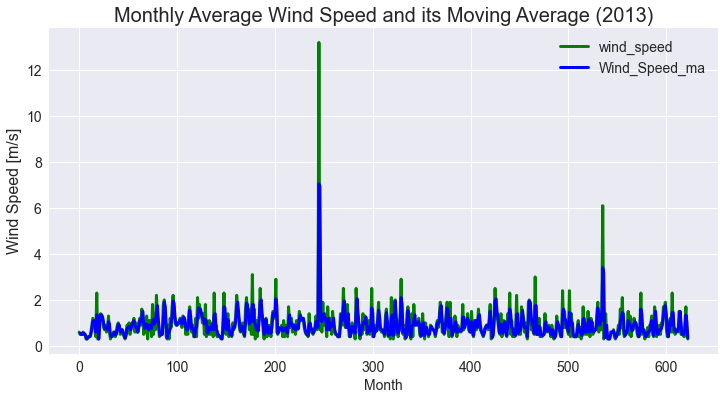

In [238]:
# Select rows where the year is 2013
df_subset = dff.loc[dff['Year'] == 2013]

# Calculate moving average of Hpa with window size 2
df_subset['Wind_Speed_ma'] = df_subset['wind_speed'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average atmospheric pressure and its moving average
df_subset[['wind_speed', 'Wind_Speed_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size and label the months on x-axis
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Wind Speed and its Moving Average (2013)', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Wind Speed [m/s]', fontsize=16)

plt.show()

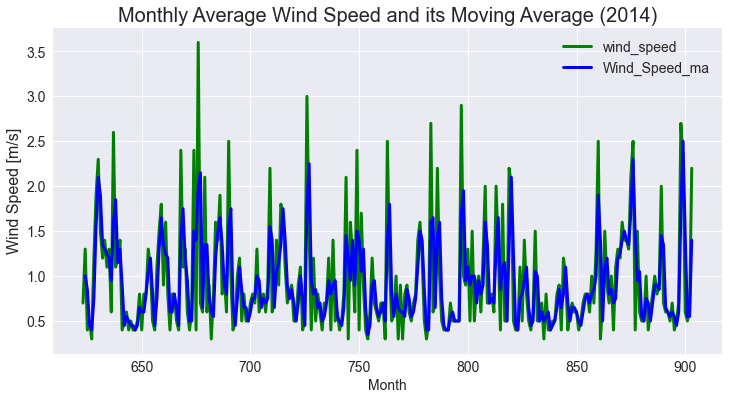

In [230]:
# Select rows where the year is 2014
df_subset = dff.loc[dff['Year'] == 2014]

# Calculate moving average of Hpa with window size 2
df_subset['Wind_Speed_ma'] = df_subset['wind_speed'].rolling(window=2).mean()

plt.style.use('seaborn')
# Line plot - the monthly average atmospheric pressure and its moving average
df_subset[['wind_speed', 'Wind_Speed_ma']].plot(color=['green', 'blue'], linewidth=3, figsize=(12, 6))

# Modify tick size and label the months on x-axis
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)

# Title and labels
plt.title('Monthly Average Wind Speed and its Moving Average (2014)', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Wind Speed [m/s]', fontsize=16)

plt.show()

## Data Preprocessing

In [244]:
df.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012,1,1,1,1014.9,24.4,23.0,92.0,NaN,NaN,NaN,NaN
1,2012,1,1,2,1014.5,24.3,23.0,93.0,NaN,NaN,NaN,NaN
2,2012,1,1,3,1013.7,23.8,23.2,96.0,NaN,NaN,57.0,1.8
3,2012,1,1,4,1012.9,23.6,23.1,97.0,NaN,NaN,60.0,4.3
4,2012,1,1,5,1013.3,23.5,23.1,98.0,NaN,NaN,60.0,9.8


In [245]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24579 entries, 0 to 24578
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Year          24579 non-null  int64  
 1   Month         24579 non-null  int64  
 2   Day           24579 non-null  int64  
 3   Hour          24579 non-null  int64  
 4   Hpa           21532 non-null  float64
 5   Temp          21532 non-null  float64
 6   Dew_point     21532 non-null  float64
 7   rel_humidity  21532 non-null  float64
 8   wind_dir      12492 non-null  float64
 9   wind_speed    12492 non-null  float64
 10  rain_dur      1718 non-null   float64
 11  rain_amt      1718 non-null   float64
dtypes: float64(8), int64(4)
memory usage: 2.3 MB


In [246]:
df.shape

(24579, 12)

In [247]:
df.isnull().sum()

Year                0
Month               0
Day                 0
Hour                0
Hpa              3047
Temp             3047
Dew_point        3047
rel_humidity     3047
wind_dir        12087
wind_speed      12087
rain_dur        22861
rain_amt        22861
dtype: int64

In [316]:
df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [317]:
df.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012,1,1,1,1014.9,24.4,23.0,92.0,NaN,NaN,NaN,NaN
1,2012,1,1,2,1014.5,24.3,23.0,93.0,NaN,NaN,NaN,NaN
2,2012,1,1,3,1013.7,23.8,23.2,96.0,NaN,NaN,57.0,1.8
3,2012,1,1,4,1012.9,23.6,23.1,97.0,NaN,NaN,60.0,4.3
4,2012,1,1,5,1013.3,23.5,23.1,98.0,NaN,NaN,60.0,9.8


In [318]:
df.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Hpa', 'Temp', 'Dew_point',
       'rel_humidity', 'wind_dir', 'wind_speed', 'rain_dur', 'rain_amt'],
      dtype='object')

## Techniques for imputing missing values
- K-Nearest Neighbour Imputer
- Interpolation

### K-Nearest Neighbour Imputer

In [362]:
# KNN imputation for missing values
imputer = KNNImputer(n_neighbors=5)
df_imputed = imputer.fit_transform(df)

# convert the numpy array into a dataframe
df_knn_imputed = pd.DataFrame(df_imputed, columns = ['Year', 'Month', 'Day', 'Hour', 'Hpa', 'Temp', 'Dew_point',
       'rel_humidity', 'wind_dir', 'wind_speed', 'rain_dur', 'rain_amt'])
df_knn_imputed.head()

,Year,Month,Day,Hour,Hpa,Temp,Dew_point,rel_humidity,wind_dir,wind_speed,rain_dur,rain_amt
0,2012.0,1.0,1.0,1.0,1014.9,24.4,23.0,92.0,192.0,0.54,39.6,2.32
1,2012.0,1.0,1.0,2.0,1014.5,24.3,23.0,93.0,168.0,0.46,39.6,2.32
2,2012.0,1.0,1.0,3.0,1013.7,23.8,23.2,96.0,182.0,0.42,57.0,1.80
3,2012.0,1.0,1.0,4.0,1012.9,23.6,23.1,97.0,138.0,0.38,60.0,4.30
4,2012.0,1.0,1.0,5.0,1013.3,23.5,23.1,98.0,216.0,0.42,60.0,9.80


## Features Selection

In [363]:
df1= df_knn_imputed[['Hpa', 'Temp', 'rel_humidity', 'wind_speed']]
df1.head()

,Hpa,Temp,rel_humidity,wind_speed
0,1014.9,24.4,92.0,0.54
1,1014.5,24.3,93.0,0.46
2,1013.7,23.8,96.0,0.42
3,1012.9,23.6,97.0,0.38
4,1013.3,23.5,98.0,0.42


In [364]:
df1.shape

(24579, 4)

In [365]:
df1.isna().sum()

Hpa             0
Temp            0
rel_humidity    0
wind_speed      0
dtype: int64

## Predicting the target Parameters of the Dataset using the Machine Learning Models
it is a regression task. In this task we will be looking at the following Algorrithm:
- Linear Regression
- Random Forest Regressor
- Decision Tree Regressor
- K-Nearest Neighbor Regressor

In [366]:
from sklearn.model_selection import train_test_split

# Define X_train and y_train using the non-missing values in data_without_missing
X = df1.drop('Hpa', axis=1) #X_train=X, y_train=y
y = df1['Hpa']

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [367]:
# to confirm the shape of both the training set and test set
print('X_train: ', X_train.shape)
print('X_test: ', X_test.shape)
print('y_train: ', y_train.shape)
print('y_test: ', y_test.shape)

X_train:  (19663, 3)
X_test:  (4916, 3)
y_train:  (19663,)
y_test:  (4916,)


In [368]:
# to confirm if there's missing values of both the training set and test set
print('X_train: ', X_train.isna().sum())
print('X_test: ', X_test.isna().sum())
print('y_train: ', y_train.isna().sum())
print('y_test: ', y_test.isna().sum())

X_train:  Temp            0
rel_humidity    0
wind_speed      0
dtype: int64
X_test:  Temp            0
rel_humidity    0
wind_speed      0
dtype: int64
y_train:  0
y_test:  0


## Linear Regression Model

In [369]:
# Define the models
linear_model = LinearRegression()

In [370]:
# Fit the model on the training data
linear_model.fit(X_train, y_train)

LinearRegression()

In [371]:
# Predict using the trained model
#data_with_missing1.replace([np.inf, -np.inf], np.nan, inplace=True)
y_pred_linear = linear_model.predict(X_test)

In [372]:
y_pred_linear.shape

(4916,)

In [373]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the linear regression model
mse_linear = mean_squared_error(y_test, y_pred_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)
rmse_linear = mean_squared_error(y_test, y_pred_linear, squared=False)
r2_linear = r2_score(y_test, y_pred_linear)

# Print the performance metrics for the linear regression model
print('Linear Regression MSE:',round( mse_linear, 2))
print('Linear Regression MAE:', round(mae_linear, 2))
print('Linear Regression RMSE:', round(rmse_linear, 2))
print('Linear Regression R2 Score:', round(r2_linear, 2))

Linear Regression MSE: 3.24
Linear Regression MAE: 1.44
Linear Regression RMSE: 1.8
Linear Regression R2 Score: 0.25


In [374]:
print('Actual Hpa values:', df1['Hpa'].head().values.tolist())
print('.......................................................................')
print('Predicted Hpa values:', [round(x, 2) for x in y_pred_linear[:5]])

Actual Hpa values: [1014.9, 1014.5, 1013.7, 1012.9, 1013.3]
.......................................................................
Predicted Hpa values: [1013.47, 1011.7, 1012.67, 1013.34, 1013.61]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa  values. A lower MSE indicates better performance. In this case, the Linear Regression model has an MSE of 3.24, which means that on average, the squared difference between the predicted and true values is 3.24.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Hpa values. A lower MAE indicates better performance. In this case, the Linear Regression model has an MAE of 1.44, which means that on average, the absolute difference between the predicted and true values is 1.44.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Linear Regression model has an RMSE of 1.8, which means that on average, the difference between the predicted and true Hpa values is 1.8.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Linear Regression model has an R2 score of 0.25, which means that it explains about 25% of the variance in the target Hpa variable.

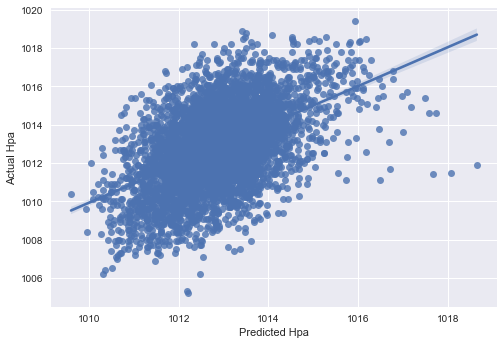

Pearsons correlation: 0.497


In [375]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_linear, y=y_test)
plt.xlabel('Predicted Hpa')
plt.ylabel('Actual Hpa')
plt.show()

corr, _ = pearsonr(x=y_pred_linear, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- It is observed that the actual Hpa and the predicted Hpa is positively correlated with a correlation coefficient of approximately 0.5.

## Random Forest Regression Model

In [376]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
rf_model = RandomForestRegressor()

In [377]:
# Fit the models on the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor()

In [378]:
# Predict using the trained model
y_pred_rf = rf_model.predict(X_test)

In [379]:
y_pred_rf.shape

(4916,)

In [380]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Random Forest regression model
mse_random = mean_squared_error(y_test, y_pred_rf)
mae_random = mean_absolute_error(y_test, y_pred_rf)
rmse_random = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_random = r2_score(y_test, y_pred_rf)

# Print the performance metrics for the linear regression model
print('Random Forest Regression MSE:',round( mse_random, 2))
print('Random Forest Regression MAE:', round(mae_random, 2))
print('Random Forest Regression RMSE:', round(rmse_random, 2))
print('Random Forest Regression R2 Score:', round(r2_random, 2))

Random Forest Regression MSE: 3.56
Random Forest Regression MAE: 1.5
Random Forest Regression RMSE: 1.89
Random Forest Regression R2 Score: 0.17


In [381]:
print('Actual Hpa values:', df1['Hpa'].head().values.tolist())
print('.......................................................................')
print('Predicted Hpa values:', [round(x, 2) for x in y_pred_rf[:5]])

Actual Hpa values: [1014.9, 1014.5, 1013.7, 1012.9, 1013.3]
.......................................................................
Predicted Hpa values: [1014.6, 1013.77, 1012.22, 1012.66, 1013.58]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa values. A lower MSE indicates better performance. In this case, the Random Forest Regression model has an MSE of 3.56, which means that on average, the squared difference between the predicted and true values is 3.56.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Hpa values. A lower MAE indicates better performance. In this case, the Random Forest Regression model has an MAE of 1.5, which means that on average, the absolute difference between the predicted and true values is 1.5.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Random Forest Regression model has an RMSE of 1.89, which means that on average, the difference between the predicted and true values is 1.89.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Random Forest Regression model has an R2 score of 0.17, which means that it explains about 17% of the variance in the Hpa variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.

Therefore, in this case, there is room for improvement in all metrics for this Random Forest Regression model.

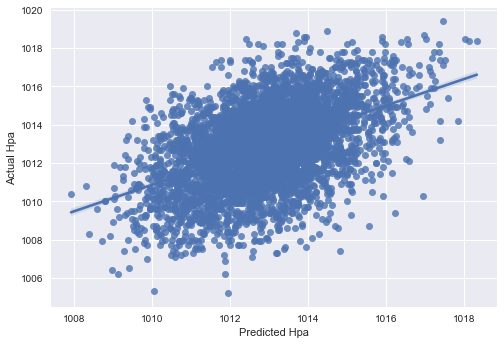

Pearsons correlation: 0.466


In [382]:
# Correlating the y_Hpa and pred_Hpa for the random forest regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_rf, y=y_test)
plt.xlabel('Predicted Hpa')
plt.ylabel('Actual Hpa')
plt.show()

corr, _ = pearsonr(x=y_pred_rf, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- It is observed that the actual Hpa and the predicted Hpa is positively correlated with a correlation coefficient of approximately 0.47.

## Decision Tree Regression Model

In [383]:
from sklearn.tree import DecisionTreeRegressor

# Define the model
tree_model = DecisionTreeRegressor()

In [384]:
# Fit the model on the training data
tree_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [385]:
# Predict using the trained model
y_pred_tree = tree_model.predict(X_test)

In [386]:
y_pred_tree.shape

(4916,)

In [388]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Decision Tree regression model
mse_tree = mean_squared_error(y_test, y_pred_tree)
mae_tree = mean_absolute_error(y_test, y_pred_tree)
rmse_tree = mean_squared_error(y_test, y_pred_tree, squared=False)
r2_tree = r2_score(y_test, y_pred_tree)

# Print the performance metrics for the linear regression model
print('Decision Tree Regression MSE:',round( mse_tree, 2))
print('Decision Tree Regression MAE:', round(mae_tree, 2))
print('Decision Tree Regression RMSE:', round(rmse_tree, 2))
print('Decision Tree Regression R2 Score:', round(r2_tree, 2))

Decision Tree Regression MSE: 5.41
Decision Tree Regression MAE: 1.81
Decision Tree Regression RMSE: 2.33
Decision Tree Regression R2 Score: -0.26


In [389]:
print('Actual Hpa values:', df1['Hpa'].head().values.tolist())
print('.............................................................')
print('Predicted Hpa values:', [round(x, 2) for x in y_pred_tree[:5]])

Actual Hpa values: [1014.9, 1014.5, 1013.7, 1012.9, 1013.3]
.............................................................
Predicted Hpa values: [1015.2, 1014.1, 1011.9, 1012.45, 1014.1]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa values. A lower MSE indicates better performance. In this case, the Decision Tree Regression model has an MSE of 5.41, which means that on average, the squared difference between the predicted and true values is 5.41.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Hpa values. A lower MAE indicates better performance. In this case, the Decision Tree Regression model has an MAE of 1.81, which means that on average, the absolute difference between the predicted and true values is 1.81.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa values, but it is in the same units as the Hpa variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Decision Tree Regression model has an RMSE of 2.33, which means that on average, the difference between the predicted and true Hpa values is 2.33.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Decision Tree Regression model has an R2 score of -0.26, which means that it explains about -26% of the variance in the target variable. A negative R2 score indicates that the model performs worse than a horizontal line (i.e., predicting the mean value of the target variable for all samples).

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, there is room for improvement in all metrics for this Decision Tree Regression model. Additionally, the negative R2 score suggests that this model is not a good fit for the data and may be underfitting.



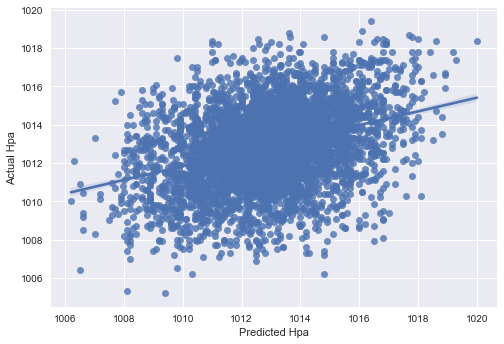

Pearsons correlation: 0.340


In [398]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_tree, y=y_test)
plt.xlabel('Predicted Hpa')
plt.ylabel('Actual Hpa')
plt.show()

corr, _ = pearsonr(x=y_pred_tree, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- It is observed that the actual Hpa and the predicted Hpa is positively correlated with a correlation coefficient of approximately 0.34.

## K-Nearest Neighbour Model

In [391]:
from sklearn.neighbors import KNeighborsRegressor

# Define the model
knn_model = KNeighborsRegressor()

In [392]:
# Fit the model on the training data
knn_model.fit(X_train, y_train)

KNeighborsRegressor()

In [393]:
# Predict using the trained model
y_pred_knn = knn_model.predict(X_test)

In [394]:
y_pred_knn.shape

(4916,)

In [396]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the KNN regression model
mse_knn = mean_squared_error(y_test, y_pred_knn)
mae_knn = mean_absolute_error(y_test, y_pred_knn)
rmse_knn = mean_squared_error(y_test, y_pred_knn, squared=False)
r2_knn = r2_score(y_test, y_pred_knn)

# Print the performance metrics for the linear regression model
print('KNN Regression MSE:',round( mse_knn, 2))
print('KNN Tree Regression MAE:', round(mae_knn, 2))
print('KNN Tree Regression RMSE:', round(rmse_knn, 2))
print('KNN Tree Regression R2 Score:', round(r2_knn, 2))

KNN Regression MSE: 3.55
KNN Tree Regression MAE: 1.51
KNN Tree Regression RMSE: 1.88
KNN Tree Regression R2 Score: 0.18


In [397]:
print('Actual Hpa values:', df1['Hpa'].head().values.tolist())
print('.............................................................')
print('Predicted Hpa values:', [round(x, 2) for x in y_pred_knn[:5]])

Actual Hpa values: [1014.9, 1014.5, 1013.7, 1012.9, 1013.3]
.............................................................
Predicted Hpa values: [1013.38, 1013.94, 1012.14, 1014.04, 1013.49]


## Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Hpa  values. A lower MSE indicates better performance. In this case, the KNN Regression model has an MSE of 3.55, which means that on average, the squared difference between the predicted and true Hpa values is 3.55.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Hpa values. A lower MAE indicates better performance. In this case, the KNN Regression model has an MAE of 1.51, which means that on average, the absolute difference between the predicted and true Hpa values is 1.51.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true values, but it is in the same units as the target Hpa variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the KNN Regression model has an RMSE of 1.88, which means that on average, the difference between the predicted and true values is 1.88.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the KNN Regression model has an R2 score of 0.18, which means that it explains about 18% of the variance in the target variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, KNN Regression model performed better than Decision Tree Regression model but worse than Random Forest Regression model.

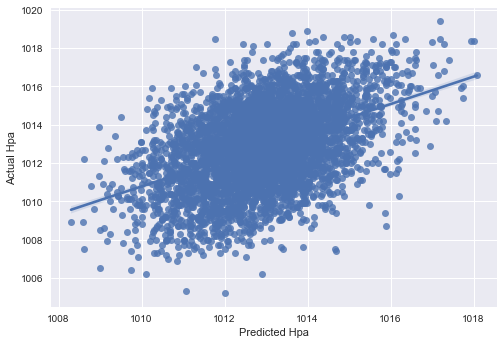

Pearsons correlation: 0.458


In [399]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_knn, y=y_test)
plt.xlabel('Predicted Hpa')
plt.ylabel('Actual Hpa')
plt.show()

corr, _ = pearsonr(x=y_pred_knn, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- It is observed that the actual Hpa and the predicted Hpa is positively correlated with a correlation coefficient of approximately 0.46.

## Predicting the Temperature Target

In [400]:
from sklearn.model_selection import train_test_split

# Define X_train and y_train using the non-missing values in data_without_missing
X = df1.drop('Temp', axis=1) #X_train=X, y_train=y
y = df1['Temp']

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [401]:
# to confirm the shape of both the training set and test set
print('X_train: ', X_train.shape)
print('X_test: ', X_test.shape)
print('y_train: ', y_train.shape)
print('y_test: ', y_test.shape)

X_train:  (19663, 3)
X_test:  (4916, 3)
y_train:  (19663,)
y_test:  (4916,)


In [402]:
# to confirm if there's missing values of both the training set and test set
print('X_train: ', X_train.isna().sum())
print('X_test: ', X_test.isna().sum())
print('y_train: ', y_train.isna().sum())
print('y_test: ', y_test.isna().sum())

X_train:  Hpa             0
rel_humidity    0
wind_speed      0
dtype: int64
X_test:  Hpa             0
rel_humidity    0
wind_speed      0
dtype: int64
y_train:  0
y_test:  0


## Linear Regression Model

In [403]:
# Define the models
linear_model = LinearRegression()

In [404]:
# Fit the models on the training data
linear_model.fit(X_train, y_train)

LinearRegression()

In [405]:
# Predict using the trained models
#data_with_missing1.replace([np.inf, -np.inf], np.nan, inplace=True)
y_pred_linear = linear_model.predict(X_test)

In [406]:
y_pred_linear.shape

(4916,)

In [407]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the linear regression model
mse_linear = mean_squared_error(y_test, y_pred_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)
rmse_linear = mean_squared_error(y_test, y_pred_linear, squared=False)
r2_linear = r2_score(y_test, y_pred_linear)

# Print the performance metrics for the linear regression model
print('Linear Regression MSE:',round( mse_linear, 2))
print('Linear Regression MAE:', round(mae_linear, 2))
print('Linear Regression RMSE:', round(rmse_linear, 2))
print('Linear Regression R2 Score:', round(r2_linear, 2))

Linear Regression MSE: 1.46
Linear Regression MAE: 0.92
Linear Regression RMSE: 1.21
Linear Regression R2 Score: 0.87


In [408]:
print('Actual Temp values:', df1['Temp'].head().values.tolist())
print('.......................................................................')
print('Predicted Temp values:', [round(x, 2) for x in y_pred_linear[:5]])

Actual Temp values: [24.4, 24.3, 23.8, 23.6, 23.5]
.......................................................................
Predicted Temp values: [23.44, 28.44, 25.16, 23.91, 24.05]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values. A lower MSE indicates better performance. In this case, the Linear Regression model has an MSE of 1.46, which means that on average, the squared difference between the predicted and true Temp values is 1.46.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Temp values. A lower MAE indicates better performance. In this case, the Linear Regression model has an MAE of 0.92, which means that on average, the absolute difference between the predicted and true Temp values is 0.92.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Linear Regression model has an RMSE of 1.21, which means that on average, the difference between the predicted and true Temp values is 1.21.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Linear Regression model has an R2 score of 0.87, which means that it explains about 87% of the variance in the target Temp variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.

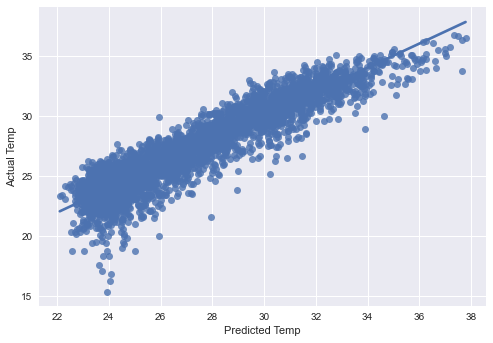

Pearsons correlation: 0.935


In [410]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_linear, y=y_test)
plt.xlabel('Predicted Temp')
plt.ylabel('Actual Temp')
plt.show()

corr, _ = pearsonr(x=y_pred_linear, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- It is observed that the actual Hpa and the predicted Hpa is positively correlated with a correlation coefficient of approximately 0.94.

## Random Forest Regression Model

In [411]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
rf_model = RandomForestRegressor()

In [412]:
# Fit the models on the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor()

In [413]:
# Predict using the trained model
y_pred_rf = rf_model.predict(X_test)

In [414]:
y_pred_rf.shape

(4916,)

In [415]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Random Forest regression model
mse_random = mean_squared_error(y_test, y_pred_rf)
mae_random = mean_absolute_error(y_test, y_pred_rf)
rmse_random = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_random = r2_score(y_test, y_pred_rf)

# Print the performance metrics for the linear regression model
print('Random Forest Regression MSE:',round( mse_random, 2))
print('Random Forest Regression MAE:', round(mae_random, 2))
print('Random Forest Regression RMSE:', round(rmse_random, 2))
print('Random Forest Regression R2 Score:', round(r2_random, 2))

Random Forest Regression MSE: 1.54
Random Forest Regression MAE: 0.94
Random Forest Regression RMSE: 1.24
Random Forest Regression R2 Score: 0.87


In [416]:
print('Actual Temp values:', df1['Temp'].head().values.tolist())
print('.......................................................................')
print('Predicted Temp values:', [round(x, 2) for x in y_pred_rf[:5]])

Actual Temp values: [24.4, 24.3, 23.8, 23.6, 23.5]
.......................................................................
Predicted Temp values: [23.9, 28.04, 25.32, 24.44, 23.69]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values. A lower MSE indicates better performance. In this case, the Random Forest Regression model has an MSE of 1.54, which means that on average, the squared difference between the predicted and true Temp values is 1.54.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Temp values. A lower MAE indicates better performance. In this case, the Random Forest Regression model has an MAE of 0.94, which means that on average, the absolute difference between the predicted and true Temp values is 0.94.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Random Forest Regression model has an RMSE of 1.24, which means that on average, the difference between the predicted and true Temp values is 1.24.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Random Forest Regression model has an R2 score of 0.87, which means that it explains about 87% of the variance in the target Temp variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, both Linear Regression model and Random Forest Regression model performed equally well in terms of MSE, MAE and R2 score. However, Linear Regression model performed slightly better than Random Forest Regression model in terms of RMSE.

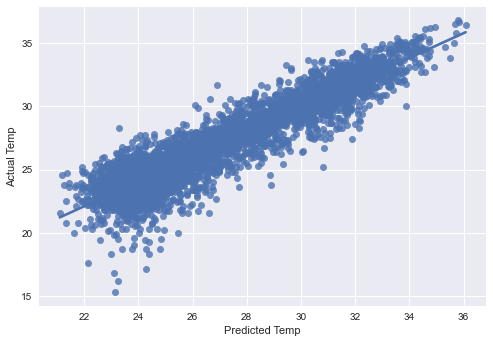

Pearsons correlation: 0.932


In [417]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_rf, y=y_test)
plt.xlabel('Predicted Temp')
plt.ylabel('Actual Temp')
plt.show()

corr, _ = pearsonr(x=y_pred_rf, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- It is observed that the actual Hpa and the predicted Hpa is positively correlated with a correlation coefficient of approximately 0.93.

## Decision Tree Regression Model

In [418]:
from sklearn.tree import DecisionTreeRegressor

# Define the model
tree_model = DecisionTreeRegressor()

In [419]:
# Fit the model on the training data
tree_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [420]:
# Predict using the trained model
y_pred_tree = tree_model.predict(X_test)

In [421]:
y_pred_tree.shape

(4916,)

In [422]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Decision Tree regression model
mse_tree = mean_squared_error(y_test, y_pred_tree)
mae_tree = mean_absolute_error(y_test, y_pred_tree)
rmse_tree = mean_squared_error(y_test, y_pred_tree, squared=False)
r2_tree = r2_score(y_test, y_pred_tree)

# Print the performance metrics for the linear regression model
print('Decision Tree Regression MSE:',round( mse_tree, 2))
print('Decision Tree Regression MAE:', round(mae_tree, 2))
print('Decision Tree Regression RMSE:', round(rmse_tree, 2))
print('Decision Tree Regression R2 Score:', round(r2_tree, 2))

Decision Tree Regression MSE: 2.46
Decision Tree Regression MAE: 1.18
Decision Tree Regression RMSE: 1.57
Decision Tree Regression R2 Score: 0.79


In [423]:
print('Actual Temp values:', df1['Temp'].head().values.tolist())
print('.............................................................')
print('Predicted Temp values:', [round(x, 2) for x in y_pred_tree[:5]])

Actual Temp values: [24.4, 24.3, 23.8, 23.6, 23.5]
.............................................................
Predicted Temp values: [24.0, 26.2, 25.58, 25.8, 23.4]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values. A lower MSE indicates better performance. In this case, the Decision Tree Regression model has an MSE of 2.46, which means that on average, the squared difference between the predicted and true Temp values is 2.46.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Temp values. A lower MAE indicates better performance. In this case, the Decision Tree Regression model has an MAE of 1.18, which means that on average, the absolute difference between the predicted and true Temp values is 1.18.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Decision Tree Regression model has an RMSE of 1.57, which means that on average, the difference between the predicted and true Temp values is 1.57.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Decision Tree Regression model has an R2 score of 0.79, which means that it explains about 79% of the variance in the target Temp variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, Decision Tree Regression model performed well in terms of R2 score but not as well as Linear Regression model or Random Forest Regression model in terms of MSE, MAE and RMSE.

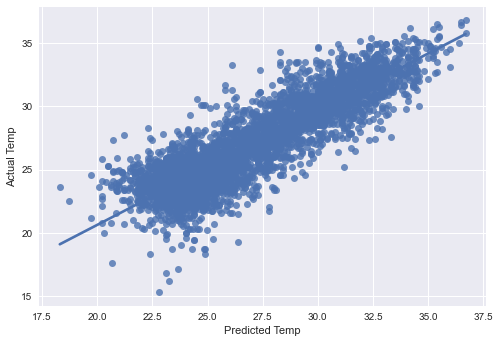

Pearsons correlation: 0.893


In [424]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_tree, y=y_test)
plt.xlabel('Predicted Temp')
plt.ylabel('Actual Temp')
plt.show()

corr, _ = pearsonr(x=y_pred_tree, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
The Pearson correlation coefficient is a statistical measure that indicates the strength and direction of the linear relationship between two variables. The coefficient ranges from -1 to +1, where -1 indicates a perfect negative correlation (as one variable increases, the other decreases), +1 indicates a perfect positive correlation (as one variable increases, the other also increases), and 0 indicates no correlation (there is no linear relationship between the variables).

- In this case, a Pearson correlation coefficient of 0.893 indicates a strong positive linear relationship between the two variables being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## K-Nearest Neighbour Model

In [425]:
from sklearn.neighbors import KNeighborsRegressor

# Define the model
knn_model = KNeighborsRegressor()

In [426]:
# Fit the model on the training data
knn_model.fit(X_train, y_train)

KNeighborsRegressor()

In [427]:
# Predict using the trained model
y_pred_knn = knn_model.predict(X_test)

In [428]:
y_pred_knn.shape

(4916,)

In [431]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the KNN regression model
mse_knn = mean_squared_error(y_test, y_pred_knn)
mae_knn = mean_absolute_error(y_test, y_pred_knn)
rmse_knn = mean_squared_error(y_test, y_pred_knn, squared=False)
r2_knn = r2_score(y_test, y_pred_knn)

# Print the performance metrics for the linear regression model
print('KNN Regression MSE:',round( mse_knn, 2))
print('KNN Regression MAE:', round(mae_knn, 2))
print('KNN Regression RMSE:', round(rmse_knn, 2))
print('KNN Regression R2 Score:', round(r2_knn, 2))

KNN Regression MSE: 1.51
KNN Regression MAE: 0.92
KNN Regression RMSE: 1.23
KNN Regression R2 Score: 0.87


In [430]:
print('Actual Temp values:', df1['Temp'].head().values.tolist())
print('.............................................................')
print('Predicted Temp values:', [round(x, 2) for x in y_pred_knn[:5]])

Actual Temp values: [24.4, 24.3, 23.8, 23.6, 23.5]
.............................................................
Predicted Temp values: [23.94, 29.02, 25.56, 23.9, 23.7]


## Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values. A lower MSE indicates better performance. In this case, the KNN Regression model has an MSE of 1.51, which means that on average, the squared difference between the predicted and true Temp values is 1.51.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Temp values. A lower MAE indicates better performance. In this case, the KNN Regression model has an MAE of 0.92, which means that on average, the absolute difference between the predicted and true Temp values is 0.92.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the KNN Regression model has an RMSE of 1.23, which means that on average, the difference between the predicted and true values Temp is 1.23.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the KNN Regression model has an R2 score of 0.87, which means that it explains about 87% of the variance in the target Temp variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, both Linear Regression model and Random Forest Regression model performed slightly better than KNN Regression model in terms of MSE, MAE and RMSE. However, all three models performed equally well in terms of R2 score.

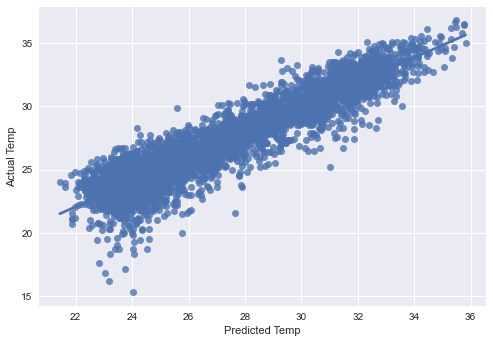

Pearsons correlation: 0.933


In [432]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_knn, y=y_test)
plt.xlabel('Predicted Temp')
plt.ylabel('Actual Temp')
plt.show()

corr, _ = pearsonr(x=y_pred_knn, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.933 indicates a strong positive linear relationship between the Actual Temp and the Predicted Temp being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## Predicting the Relative Humidity Target

In [434]:
from sklearn.model_selection import train_test_split

# Define X_train and y_train using the non-missing values in data_without_missing
X = df1.drop('rel_humidity', axis=1) #X_train=X, y_train=y
y = df1['rel_humidity']

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [435]:
# to confirm the shape of both the training set and test set
print('X_train: ', X_train.shape)
print('X_test: ', X_test.shape)
print('y_train: ', y_train.shape)
print('y_test: ', y_test.shape)

X_train:  (19663, 3)
X_test:  (4916, 3)
y_train:  (19663,)
y_test:  (4916,)


In [436]:
# to confirm if there's missing values of both the training set and test set
print('X_train: ', X_train.isna().sum())
print('X_test: ', X_test.isna().sum())
print('y_train: ', y_train.isna().sum())
print('y_test: ', y_test.isna().sum())

X_train:  Hpa           0
Temp          0
wind_speed    0
dtype: int64
X_test:  Hpa           0
Temp          0
wind_speed    0
dtype: int64
y_train:  0
y_test:  0


## Linear Regression Model

In [437]:
# Define the models
linear_model = LinearRegression()

In [438]:
# Fit the models on the training data
linear_model.fit(X_train, y_train)

LinearRegression()

In [439]:
# Predict using the trained models
#data_with_missing1.replace([np.inf, -np.inf], np.nan, inplace=True)
y_pred_linear = linear_model.predict(X_test)

In [440]:
y_pred_linear.shape

(4916,)

In [444]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the linear regression model
mse_linear = mean_squared_error(y_test, y_pred_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)
rmse_linear = mean_squared_error(y_test, y_pred_linear, squared=False)
r2_linear = r2_score(y_test, y_pred_linear)

# Print the performance metrics for the linear regression model
print('Linear Regression MSE:',round( mse_linear, 2))
print('Linear Regression MAE:', round(mae_linear, 2))
print('Linear Regression RMSE:', round(rmse_linear, 2))
print('Linear Regression R2 Score:', round(r2_linear, 2))

Linear Regression MSE: 28.11
Linear Regression MAE: 3.94
Linear Regression RMSE: 5.3
Linear Regression R2 Score: 0.88


In [445]:
print('Actual Relative Humidity values:', df1['rel_humidity'].head().values.tolist())
print('.......................................................................')
print('Predicted Relative Humidity values:', [round(x, 2) for x in y_pred_linear[:5]])

Actual Relative Humidity values: [92.0, 93.0, 96.0, 97.0, 98.0]
.......................................................................
Predicted Relative Humidity values: [94.31, 63.62, 87.43, 96.29, 99.05]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true relative humidity values. A lower MSE indicates better performance. In this case, the Linear Regression model has an MSE of 28.11, which means that on average, the squared difference between the predicted and true relative humidity values is 28.11.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true relative humidity values. A lower MAE indicates better performance. In this case, the Linear Regression model has an MAE of 3.94, which means that on average, the absolute difference between the predicted and true relative humidity values is 3.94.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the relative humidity true values, but it is in the same units as the relative humidity target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Linear Regression model has an RMSE of 5.3, which means that on average, the difference between the predicted and true relative humidity values is 5.3.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Linear Regression model has an R2 score of 0.88, which means that it explains about 88% of the variance in the target relative humidity variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.

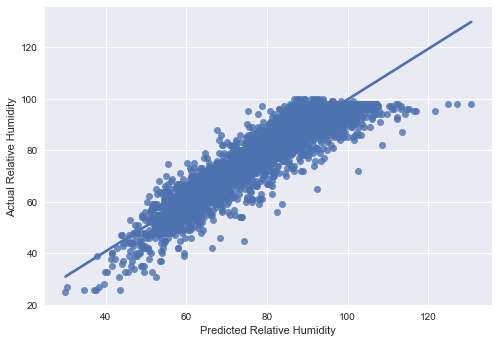

Pearsons correlation: 0.941


In [446]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_linear, y=y_test)
plt.xlabel('Predicted Relative Humidity')
plt.ylabel('Actual Relative Humidity')
plt.show()

corr, _ = pearsonr(x=y_pred_linear, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.941 indicates a very strong positive linear relationship between the Predicted Relative humidity and the Actual Relative Humidity being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## Random Forest Regression Model

In [447]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
rf_model = RandomForestRegressor()

In [448]:
# Fit the models on the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor()

In [449]:
# Predict using the trained model
y_pred_rf = rf_model.predict(X_test)

In [450]:
y_pred_rf.shape

(4916,)

In [451]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Random Forest regression model
mse_random = mean_squared_error(y_test, y_pred_rf)
mae_random = mean_absolute_error(y_test, y_pred_rf)
rmse_random = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_random = r2_score(y_test, y_pred_rf)

# Print the performance metrics for the linear regression model
print('Random Forest Regression MSE:',round( mse_random, 2))
print('Random Forest Regression MAE:', round(mae_random, 2))
print('Random Forest Regression RMSE:', round(rmse_random, 2))
print('Random Forest Regression R2 Score:', round(r2_random, 2))

Random Forest Regression MSE: 22.25
Random Forest Regression MAE: 3.29
Random Forest Regression RMSE: 4.72
Random Forest Regression R2 Score: 0.91


In [452]:
print('Actual Relative humidity values:', df1['rel_humidity'].head().values.tolist())
print('.......................................................................')
print('Predicted Relative humidity values:', [round(x, 2) for x in y_pred_rf[:5]])

Actual Relative humidity values: [92.0, 93.0, 96.0, 97.0, 98.0]
.......................................................................
Predicted Relative humidity values: [96.01, 67.62, 92.35, 96.46, 97.21]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Temp values. A lower MSE indicates better performance. In this case, the Random Forest Regression model has an MSE of 22.25, which means that on average, the squared difference between the predicted and true Temp values is 22.25.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Temp values. A lower MAE indicates better performance. In this case, the Random Forest Regression model has an MAE of 3.29, which means that on average, the absolute difference between the predicted and true Temp values is 3.29.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Random Forest Regression model has an RMSE of 4.72, which means that on average, the difference between the predicted and true Temp values is 4.72.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Random Forest Regression model has an R2 score of 0.91, which means that it explains about 91% of the variance in the target Temp variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.

Therefore, in this case, Random Forest Regression model performed well in terms of all four metrics - MSE, MAE, RMSE and R2 score - indicating that it is a good model for predicting the target relative humidity variable.

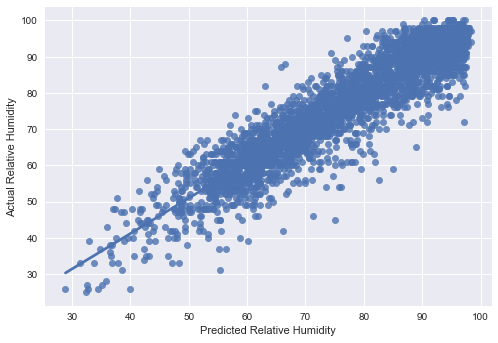

Pearsons correlation: 0.954


In [453]:
# Correlating the y_rel_humidity and pred_rel_humidity for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_rf, y=y_test)
plt.xlabel('Predicted Relative Humidity')
plt.ylabel('Actual Relative Humidity')
plt.show()

corr, _ = pearsonr(x=y_pred_rf, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.954 indicates an extremely strong positive linear relationship between the Predicted Relative Humidity and Actual Relative Humidity being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## Decision Tree Regression Model

In [454]:
from sklearn.tree import DecisionTreeRegressor

# Define the model
tree_model = DecisionTreeRegressor()

In [455]:
# Fit the model on the training data
tree_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [456]:
# Predict using the trained model
y_pred_tree = tree_model.predict(X_test)

In [457]:
y_pred_tree.shape

(4916,)

In [458]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Decision Tree regression model
mse_tree = mean_squared_error(y_test, y_pred_tree)
mae_tree = mean_absolute_error(y_test, y_pred_tree)
rmse_tree = mean_squared_error(y_test, y_pred_tree, squared=False)
r2_tree = r2_score(y_test, y_pred_tree)

# Print the performance metrics for the linear regression model
print('Decision Tree Regression MSE:',round( mse_tree, 2))
print('Decision Tree Regression MAE:', round(mae_tree, 2))
print('Decision Tree Regression RMSE:', round(rmse_tree, 2))
print('Decision Tree Regression R2 Score:', round(r2_tree, 2))

Decision Tree Regression MSE: 39.21
Decision Tree Regression MAE: 4.32
Decision Tree Regression RMSE: 6.26
Decision Tree Regression R2 Score: 0.84


In [459]:
print('Actual Relative Humidity values:', df1['rel_humidity'].head().values.tolist())
print('.............................................................')
print('Predicted Relative Humidity values:', [round(x, 2) for x in y_pred_tree[:5]])

Actual Relative Humidity values: [92.0, 93.0, 96.0, 97.0, 98.0]
.............................................................
Predicted Relative Humidity values: [95.4, 67.0, 93.0, 94.0, 98.0]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Relative humidity values. A lower MSE indicates better performance. In this case, the Decision Tree Regression model has an MSE of 39.21, which means that on average, the squared difference between the predicted and true Relative humidity values is 39.21.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Relative humidity values. A lower MAE indicates better performance. In this case, the Decision Tree Regression model has an MAE of 4.32, which means that on average, the absolute difference between the predicted and true Relative humidity values is 4.32.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Relative humidity values, but it is in the same units as the target Relative humidity variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Decision Tree Regression model has an RMSE of 6.26, which means that on average, the difference between the predicted and true Relative humidity values is 6.26.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Decision Tree Regression model has an R2 score of 0.84, which means that it explains about 84% of the variance in the target Relative humidity variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, Decision Tree Regression model performed well in terms of R2 score but not as well as Random Forest Regression model in terms of MSE, MAE and RMSE.

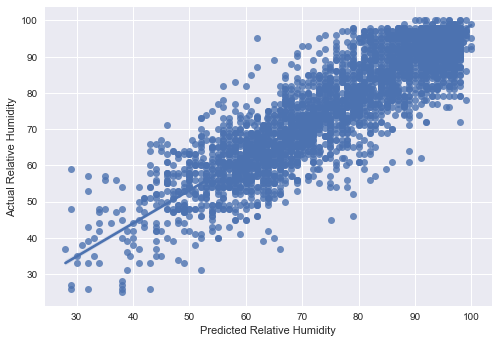

Pearsons correlation: 0.921


In [460]:
# Correlating the y_Relative humidity and pred_Relative humidity for the Decision tree regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_tree, y=y_test)
plt.xlabel('Predicted Relative Humidity')
plt.ylabel('Actual Relative Humidity')
plt.show()

corr, _ = pearsonr(x=y_pred_tree, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
A Pearson correlation coefficient of 0.921 indicates a strong positive linear relationship between the Predicted Relative Humidity and Actual Relative Humidity being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## K-Nearest Neighbour Model

In [461]:
from sklearn.neighbors import KNeighborsRegressor

# Define the model
knn_model = KNeighborsRegressor()

In [462]:
# Fit the model on the training data
knn_model.fit(X_train, y_train)

KNeighborsRegressor()

In [463]:
# Predict using the trained model
y_pred_knn = knn_model.predict(X_test)

In [464]:
y_pred_knn.shape

(4916,)

In [465]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the KNN regression model
mse_knn = mean_squared_error(y_test, y_pred_knn)
mae_knn = mean_absolute_error(y_test, y_pred_knn)
rmse_knn = mean_squared_error(y_test, y_pred_knn, squared=False)
r2_knn = r2_score(y_test, y_pred_knn)

# Print the performance metrics for the linear regression model
print('KNN Regression MSE:',round( mse_knn, 2))
print('KNN Regression MAE:', round(mae_knn, 2))
print('KNN Regression RMSE:', round(rmse_knn, 2))
print('KNN Regression R2 Score:', round(r2_knn, 2))

KNN Regression MSE: 22.57
KNN Regression MAE: 3.3
KNN Regression RMSE: 4.75
KNN Regression R2 Score: 0.91


In [466]:
print('Actual Relative humidity values:', df1['rel_humidity'].head().values.tolist())
print('.............................................................')
print('Predicted Relative humidity values:', [round(x, 2) for x in y_pred_knn[:5]])

Actual Relative humidity values: [92.0, 93.0, 96.0, 97.0, 98.0]
.............................................................
Predicted Relative humidity values: [95.96, 65.4, 92.6, 96.0, 97.6]


## Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Relative humidity values. A lower MSE indicates better performance. In this case, the KNN Regression model has an MSE of 22.57, which means that on average, the squared difference between the predicted and true Relative humidity values is 22.57.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Relative humidity values. A lower MAE indicates better performance. In this case, the KNN Regression model has an MAE of 3.3, which means that on average, the absolute difference between the predicted and true Relative humidity values is 3.3.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Relative humidity values, but it is in the same units as the target Relative humidity variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the KNN Regression model has an RMSE of 4.75, which means that on average, the difference between the predicted and true Relative humidity values is 4.75.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the KNN Regression model has an R2 score of 0.91, which means that it explains about 91% of the variance in the target Relative humidity variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, KNN Regression model performed well in terms of all four metrics - MSE, MAE, RMSE and R2 score - indicating that it is a good model for predicting the target Relative humidity variable.

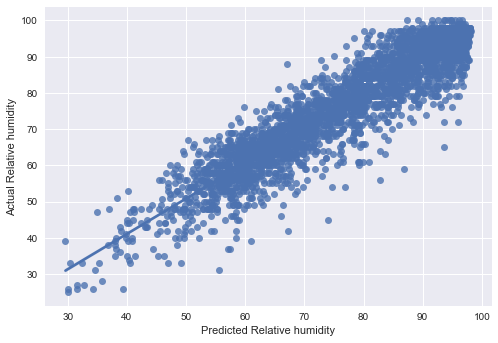

Pearsons correlation: 0.953


In [467]:
# Correlating the y_Hpa and pred_Hpa for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_knn, y=y_test)
plt.xlabel('Predicted Relative humidity')
plt.ylabel('Actual Relative humidity')
plt.show()

corr, _ = pearsonr(x=y_pred_knn, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.953 indicates a strong positive linear relationship between the Actual Relative humidity and the Predicted Relative humidity being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## Predicting the Wind Speed Target

In [468]:
from sklearn.model_selection import train_test_split

# Define X_train and y_train using the non-missing values in data_without_missing
X = df1.drop('wind_speed', axis=1) #X_train=X, y_train=y
y = df1['wind_speed']

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [469]:
# to confirm the shape of both the training set and test set
print('X_train: ', X_train.shape)
print('X_test: ', X_test.shape)
print('y_train: ', y_train.shape)
print('y_test: ', y_test.shape)

X_train:  (19663, 3)
X_test:  (4916, 3)
y_train:  (19663,)
y_test:  (4916,)


In [470]:
# to confirm if there's missing values of both the training set and test set
print('X_train: ', X_train.isna().sum())
print('X_test: ', X_test.isna().sum())
print('y_train: ', y_train.isna().sum())
print('y_test: ', y_test.isna().sum())

X_train:  Hpa             0
Temp            0
rel_humidity    0
dtype: int64
X_test:  Hpa             0
Temp            0
rel_humidity    0
dtype: int64
y_train:  0
y_test:  0


## Linear Regression Model

In [471]:
# Define the models
linear_model = LinearRegression()

In [472]:
# Fit the models on the training data
linear_model.fit(X_train, y_train)

LinearRegression()

In [473]:
# Predict using the trained models
#data_with_missing1.replace([np.inf, -np.inf], np.nan, inplace=True)
y_pred_linear = linear_model.predict(X_test)

In [474]:
y_pred_linear.shape

(4916,)

In [475]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the linear regression model
mse_linear = mean_squared_error(y_test, y_pred_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)
rmse_linear = mean_squared_error(y_test, y_pred_linear, squared=False)
r2_linear = r2_score(y_test, y_pred_linear)

# Print the performance metrics for the linear regression model
print('Linear Regression MSE:',round( mse_linear, 2))
print('Linear Regression MAE:', round(mae_linear, 2))
print('Linear Regression RMSE:', round(rmse_linear, 2))
print('Linear Regression R2 Score:', round(r2_linear, 2))

Linear Regression MSE: 0.1
Linear Regression MAE: 0.22
Linear Regression RMSE: 0.32
Linear Regression R2 Score: 0.54


In [478]:
print('Actual Wind Speed values:', [round(x, 2) for x in df1['wind_speed'].head().values.tolist()])
print('.......................................................................')
print('Predicted Wind Speed values:', [round(x, 2) for x in y_pred_linear[:5]])

Actual Wind Speed values: [0.54, 0.46, 0.42, 0.38, 0.42]
.......................................................................
Predicted Wind Speed values: [0.58, 1.21, 0.66, 0.55, 0.52]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Wind Speed values. A lower MSE indicates better performance. In this case, the Linear Regression model has an MSE of 0.1, which means that on average, the squared difference between the predicted and true Wind Speed values is 0.1.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Wind Speed values. A lower MAE indicates better performance. In this case, the Linear Regression model has an MAE of 0.22, which means that on average, the absolute difference between the predicted and true Wind Speed values is 0.22.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Wind Speed values, but it is in the same units as the target Wind Speed variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Linear Regression model has an RMSE of 0.32, which means that on average, the difference between the predicted and true Wind Speed values is 0.32.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Linear Regression model has an R2 score of 0.54, which means that it explains about 54% of the variance in the target Wind Speed variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, Linear Regression model performed well in terms of MAE and RMSE but not as well as MSE and R2 score.

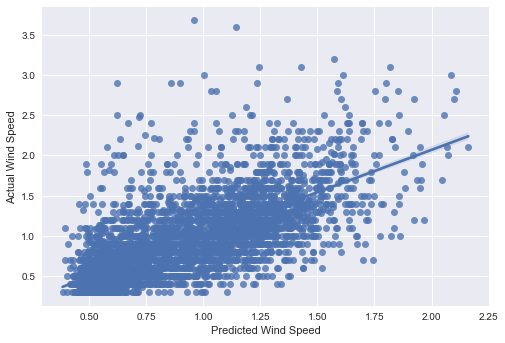

Pearsons correlation: 0.738


In [479]:
# Correlating the y_Wind Speed  and pred_Wind Speed for the linear regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_linear, y=y_test)
plt.xlabel('Predicted Wind Speed')
plt.ylabel('Actual Wind Speed')
plt.show()

corr, _ = pearsonr(x=y_pred_linear, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.738 indicates a strong positive linear relationship between the Predicted Wind Speed and the Actual Wind Speed being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## Random Forest Regression Model

In [480]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
rf_model = RandomForestRegressor()

In [481]:
# Fit the models on the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor()

In [482]:
# Predict using the trained model
y_pred_rf = rf_model.predict(X_test)

In [483]:
y_pred_rf.shape

(4916,)

In [484]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Random Forest regression model
mse_random = mean_squared_error(y_test, y_pred_rf)
mae_random = mean_absolute_error(y_test, y_pred_rf)
rmse_random = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_random = r2_score(y_test, y_pred_rf)

# Print the performance metrics for the linear regression model
print('Random Forest Regression MSE:',round( mse_random, 2))
print('Random Forest Regression MAE:', round(mae_random, 2))
print('Random Forest Regression RMSE:', round(rmse_random, 2))
print('Random Forest Regression R2 Score:', round(r2_random, 2))

Random Forest Regression MSE: 0.12
Random Forest Regression MAE: 0.23
Random Forest Regression RMSE: 0.34
Random Forest Regression R2 Score: 0.5


In [486]:
print('Actual Wind Speed values:', [round(x, 2) for x in df1['wind_speed'].head().values.tolist()])
print('.......................................................................')
print('Predicted Wind Speed values:', [round(x, 2) for x in y_pred_rf[:5]])

Actual Wind Speed values: [0.54, 0.46, 0.42, 0.38, 0.42]
.......................................................................
Predicted Wind Speed values: [0.37, 1.34, 0.69, 0.49, 0.71]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true  Wind Speed values. A lower MSE indicates better performance. In this case, the Random Forest Regression model has an MSE of 0.12, which means that on average, the squared difference between the predicted and true Wind Speed values is 0.12.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Wind Speed values. A lower MAE indicates better performance. In this case, the Random Forest Regression model has an MAE of 0.23, which means that on average, the absolute difference between the predicted and true Wind Speed values is 0.23.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Wind Speed values, but it is in the same units as the target Wind Speed variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Random Forest Regression model has an RMSE of 0.34, which means that on average, the difference between the predicted and true Wind Speed values is 0.34.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Random Forest Regression model has an R2 score of 0.5, which means that it explains about 50% of the variance in the target Wind Speed variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.
Therefore, in this case, Random Forest Regression model performed well in terms of MAE and RMSE but not as well as MSE and R2 score.

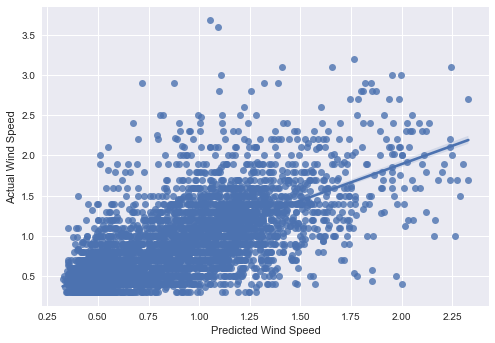

Pearsons correlation: 0.709


In [487]:
# Correlating the y_ Wind Speed and pred_ Wind Speed for the Random forest regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_rf, y=y_test)
plt.xlabel('Predicted Wind Speed')
plt.ylabel('Actual Wind Speed')
plt.show()

corr, _ = pearsonr(x=y_pred_rf, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.709 indicates a strong positive linear relationship between the Predicted Wind Speed and Actual Wind Speed being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## Decision Tree Regression Model

In [488]:
from sklearn.tree import DecisionTreeRegressor

# Define the model
tree_model = DecisionTreeRegressor()

In [489]:
# Fit the model on the training data
tree_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [490]:
# Predict using the trained model
y_pred_tree = tree_model.predict(X_test)

In [491]:
y_pred_tree.shape

(4916,)

In [492]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the Decision Tree regression model
mse_tree = mean_squared_error(y_test, y_pred_tree)
mae_tree = mean_absolute_error(y_test, y_pred_tree)
rmse_tree = mean_squared_error(y_test, y_pred_tree, squared=False)
r2_tree = r2_score(y_test, y_pred_tree)

# Print the performance metrics for the linear regression model
print('Decision Tree Regression MSE:',round( mse_tree, 2))
print('Decision Tree Regression MAE:', round(mae_tree, 2))
print('Decision Tree Regression RMSE:', round(rmse_tree, 2))
print('Decision Tree Regression R2 Score:', round(r2_tree, 2))

Decision Tree Regression MSE: 0.2
Decision Tree Regression MAE: 0.31
Decision Tree Regression RMSE: 0.45
Decision Tree Regression R2 Score: 0.11


In [494]:
print('Actual Wind Speed values:', [round(x, 2) for x in df1['wind_speed'].head().values.tolist()])
print('.............................................................')
print('Predicted Wind Speed values:', [round(x, 2) for x in y_pred_tree[:5]])

Actual Wind Speed values: [0.54, 0.46, 0.42, 0.38, 0.42]
.............................................................
Predicted Wind Speed values: [0.37, 1.9, 0.8, 0.46, 0.36]


### Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true  Wind Speed values. A lower MSE indicates better performance. In this case, the Decision Tree Regression model has an MSE of 0.2, which means that on average, the squared difference between the predicted and true Wind Speed values is 0.2.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true  Wind Speed values. A lower MAE indicates better performance. In this case, the Decision Tree Regression model has an MAE of 0.31, which means that on average, the absolute difference between the predicted and true Wind Speed values is 0.31.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Wind Speed values, but it is in the same units as the target  Wind Speed variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the Decision Tree Regression model has an RMSE of 0.45, which means that on average, the difference between the predicted and true Wind Speed values is 0.45.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the Decision Tree Regression model has an R2 score of 0.11, which means that it explains about 11% of the variance in the target Relative humidity variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.

Therefore, in this case, Decision Tree Regression model did not perform well in terms of any of the four metrics - MSE, MAE, RMSE and R2 score - indicating that it is not a good model for predicting the target variable.

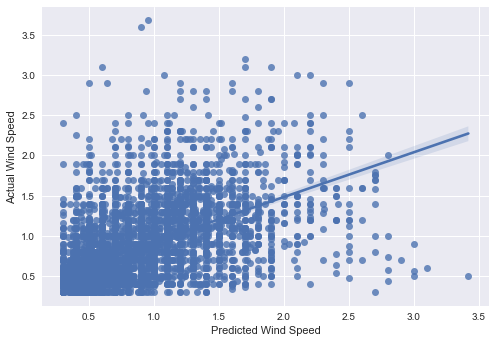

Pearsons correlation: 0.546


In [495]:
# Correlating the y_Relative humidity and pred_Relative humidity for the Decision tree regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_tree, y=y_test)
plt.xlabel('Predicted Wind Speed')
plt.ylabel('Actual Wind Speed')
plt.show()

corr, _ = pearsonr(x=y_pred_tree, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
A Pearson correlation coefficient of 0.546 indicates a strong positive linear relationship between the Predicted Wind Speed and Actual Wind Speed being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.

## K-Nearest Neighbour Model

In [496]:
from sklearn.neighbors import KNeighborsRegressor

# Define the model
knn_model = KNeighborsRegressor()

In [497]:
# Fit the model on the training data
knn_model.fit(X_train, y_train)

KNeighborsRegressor()

In [498]:
# Predict using the trained model
y_pred_knn = knn_model.predict(X_test)

In [499]:
y_pred_knn.shape

(4916,)

In [500]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate the performance metrics for the KNN regression model
mse_knn = mean_squared_error(y_test, y_pred_knn)
mae_knn = mean_absolute_error(y_test, y_pred_knn)
rmse_knn = mean_squared_error(y_test, y_pred_knn, squared=False)
r2_knn = r2_score(y_test, y_pred_knn)

# Print the performance metrics for the linear regression model
print('KNN Regression MSE:',round( mse_knn, 2))
print('KNN Regression MAE:', round(mae_knn, 2))
print('KNN Regression RMSE:', round(rmse_knn, 2))
print('KNN Regression R2 Score:', round(r2_knn, 2))

KNN Regression MSE: 0.11
KNN Regression MAE: 0.23
KNN Regression RMSE: 0.34
KNN Regression R2 Score: 0.5


In [501]:
print('Actual Wind Speed values:', [round(x, 2) for x in df1['wind_speed'].head().values.tolist()])
print('.............................................................')
print('Predicted Wind Speed values:', [round(x, 2) for x in y_pred_knn[:5]])

Actual Wind Speed values: [0.54, 0.46, 0.42, 0.38, 0.42]
.............................................................
Predicted Wind Speed values: [0.37, 1.17, 0.6, 0.73, 0.65]


## Observation
MSE (Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Wind Speed values. A lower MSE indicates better performance. In this case, the KNN Regression model has an MSE of 0.11, which means that on average, the squared difference between the predicted and true Wind Speed values is 0.11.

MAE (Mean Absolute Error): This is a measure of the average absolute difference between the predicted values and the true Wind Speed values. A lower MAE indicates better performance. In this case, the KNN Regression model has an MAE of 0.23, which means that on average, the absolute difference between the predicted and true Wind Speed values is 0.23.

RMSE (Root Mean Squared Error): This is a measure of the average squared difference between the predicted values and the true Wind Speed values, but it is in the same units as the target variable (i.e., not squared). A lower RMSE indicates better performance. In this case, the KNN Regression model has an RMSE of 0.34, which means that on average, the difference between the predicted and true Wind Speed values is 0.34.

R2 Score (Coefficient of Determination): This is a measure of how well the model fits the data, with a value between 0 and 1. A higher R2 score indicates better performance. An R2 score of 1 indicates that the model perfectly fits the data, while an R2 score of 0 indicates that the model does not fit the data at all. In this case, the KNN Regression model has an R2 score of 0.5, which means that it explains about 50% of the variance in the target Wind Speed variable.

In summary, for each metric:

The lower the MSE and RMSE, the better.
The lower the MAE, the better.
The higher the R2 score, the better.

Therefore, in this case, KNN Regression model performed well in terms of MAE and RMSE but not as well as other models in terms of MSE and R2 score.

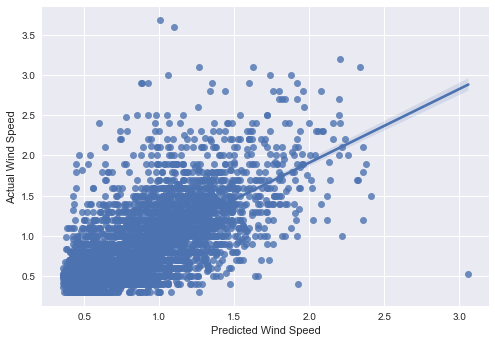

Pearsons correlation: 0.714


In [502]:
# Correlating the y_Wind Speed and pred_Wind Speed for the KNN regression model
from scipy.stats import pearsonr

# Plot a scatter plot for the prediction
sns.regplot(x=y_pred_knn, y=y_test)
plt.xlabel('Predicted Wind Speed')
plt.ylabel('Actual Wind Speed')
plt.show()

corr, _ = pearsonr(x=y_pred_knn, y=y_test)
print('Pearsons correlation: %.3f' % corr)

### Observation
- A Pearson correlation coefficient of 0.714 indicates a strong positive linear relationship between the ActualWind Speed and the Predicted Wind Speed being analyzed. This means that as one variable increases, the other variable also tends to increase. The closer the coefficient is to +1, the stronger the positive correlation.